# Вариант № 4

# Предисловие

## Условие

Данные: [ссылка](http://archive.ics.uci.edu/dataset/291/airfoil+self+noise).

Число нейронов 1-го скрытого слоя: `15`.

Активационная характеристика нейронов 1-го скрытого слоя: `tanh`.

Число нейронов 2-го скрытого слоя: `10`.

Активационная характеристика нейронов 2-го скрытого слоя: `tanh`.

Число нейронов 3-го скрытого слоя: `5`.

Активационная характеристика нейронов 1-го скрытого слоя: `tanh`.

Режим обучения: `Stohastic`.

# Оглавление

- [0. Импорты и определения](#0)
- [1. Исходные данные](#1)
  - [1.1. Описание исходных данных](#11)
  - [1.2. Визуальный анализ исходных данных](#12)
    - [1.2.1. Гистограммы распределения и диаграммы Box-and-Whisker](#121)
    - [1.2.2. Корреляционная матрица признаков](#122)
    - [1.2.3. Диаграммы рассеяния](#123)
- [2. Предобработка данных](#2)
  - [2.1. Очистка данных](#21)
    - [2.1.1. Обнаружение и устранение дубликатов](#211)
    - [2.1.2. Обнаружение и устранение выбросов](#212)
    - [2.1.3. Пропущенные значения](#213)
    - [2.1.4. Визуальный анализ очищенных данных](#214)
  - [2.2. Преобразование данных](#22)
    - [2.2.1. Преобразование входов](#221)
    - [2.2.2. Преобразование выходов](#222)
    - [2.2.3. Визуальный анализ преобразованных данных](#223)
- [3. Формирование признаков](#3)
  - [3.1. Сокращение числа признаков](#31)
  - [3.2. Конструирование новых признаков](#32)
- [4. Построение и исследование нейросетевых моделей](#4)
  - [4.1. Параметры архитектуры и обучения многослойной нейронной сети](#41)
  - [4.2. Исследование простого градиентного метода обучения](#42)
  - [4.3. Исследование методов GDM и NAG](#43)
  - [4.4. Исследование методов наискорейшего спуска и сопряжённых градиентов](#44)
    - [4.4.1. Сравнение кривых обучения](#441)
    - [4.4.2. Таблица по результатам обучения](#442)
  - [4.5. Исследование метода AdaGrad](#45)
  - [4.6. Исследование методов RMSProp и AdaDelta](#46)
  - [4.7. Исследование метода Adam](#47)
  - [4.8. Исследование метода RProp](#48)
  - [4.9. Исследование методов Левенберга-Маркардта и BFGS](#49)
  - [4.10. Исследование метода стохастического градиента](#410)
  - [4.11. Сравнение методов обучения](#411) 
    - [4.11.1. Сравнение числа эпох обучения](#4111)
    - [4.11.2. Сравнение качества обученных нейросетевых моделей](#4112)
  - [4.12. Исследование влияния способа инициализации весов на качество обучения](#412) 
    - [4.12.1. Исследование прямого информационного потока в сети](#4121)
    - [4.12.2. Исследование обратного информационного потока в сети](#4122)
    - [4.12.3. Исследование распределений выходов и двойственных потенциалов нейронов](#4123)
    - [4.12.4. Кривые обучения](#4124)
    - [4.12.5. Таблица по результатам обучения](#4125)
  - [4.13. Методы кросс-валидации](#413) 
    - [4.13.1. Таблица по результатам кросс-валидации различными методами](#4131)
    - [4.13.2. Исследование k-fold кросс-валидации](#4132)
  - [4.14. Исследование различных архитектур нейронных сетей](#414)
    - [4.14.1. Исследование зависимости качества обучения от числа нейронов в скрытых слоях](#4141)
    - [4.14.2. Исследование зависимости качества обучения от активационных характеристик нейронов](#4142)
  - [4.15. $L_1$ и $L_2$ регуляризация весов](#415) 
    - [4.15.1. Исследование зависимости качества обученной сети от параметра регуляризации](#4151)
    - [4.15.2. Исследование зависимости нормы вектора синаптических коэффициентов от параметра регуляризации](#4152)
    - [4.15.3. Сравнение кривых обучения при различных значениях параметра регуляризации](#4153)
  - [4.16. Инъекция шума](#416)
    - [4.16.1. Исследование зависимости качества обученной сети от параметра зашумления](#4161)
    - [4.16.2. Сравнение кривых обучения](#4162)
- [5. Исследование обученной нейросетевой модели](#5)
  - [5.1. Исследование качества обученной модели](#51)
  - [5.2. Оценка важности признаков](#52)

# 0. Импорты и определения <a id="0"></a>

## Установка зависимостей

In [1]:
# %pip install numpy pandas matplotlib seaborn torch tqdm scikit-learn ucimlrepo tabulate dask

In [2]:
# !git clone https://github.com/xausssr/LewenbergMarkvardt-PyTorch

## Импорт библиотек

In [3]:
# Основные библиотеки и функции
import os
import random
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from tqdm.auto import tqdm

# настройка среды разработки
from IPython.display import (
    Markdown,
    display,
    HTML,
)

# загрузка датасета
from ucimlrepo import fetch_ucirepo

# для кастомизации чего-либо
from matplotlib.colors import LinearSegmentedColormap

# поиск выбросов
from sklearn.preprocessing import RobustScaler
from sklearn.neighbors import NearestNeighbors, LocalOutlierFactor
from sklearn.manifold import TSNE
from scipy.spatial.distance import cdist
from sklearn.cluster import DBSCAN
from itertools import combinations
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest

# преобразование признаков
from sklearn.preprocessing import RobustScaler
from scipy.linalg import sqrtm


# сокращение числа признаков
from sklearn.feature_selection import (
    SelectKBest,
    f_regression,
    RFE,
)
from sklearn.linear_model import (
    LinearRegression,
    Lasso,
)
from sklearn.ensemble import RandomForestRegressor

# конструирование новых признаков
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy.stats import skew

# разделение выборки
from sklearn.model_selection import train_test_split

# понадобилось в 4 разделе
from math import ceil
from abc import ABC, abstractmethod

# методы второго порядка
import sys

sys.path.append("./LewenbergMarkvardt-PyTorch")
from core.lm_distributed_samples import train_distributed_levenberg

## Настройка под среду разработки

In [4]:
plt.style.use("seaborn-v0_8-notebook")
display(
    HTML(
        """
<style>
    .cell-output-ipywidget-background {
        background-color: transparent !important;
    }

    :root {
        --jp-widgets-color: var(--vscode-editor-foreground);
        --jp-widgets-font-size: var(--vscode-editor-font-size);
    }
</style>
"""
    )
)

## Настройка воспроизводимости

In [5]:
def set_seed_all(seed: int = 42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.random.manual_seed(seed)

    print(f"Seed set to: {seed}")

In [6]:
SEED = 42
set_seed_all(SEED)

Seed set to: 42


In [7]:
g = torch.Generator().manual_seed(SEED)

In [8]:
def seed_worker(worker_id):
    np.random.seed(SEED)
    random.seed(SEED)

## Загрузка данных

In [9]:
# fetch dataset
airfoil_self_noise = fetch_ucirepo(id=291)

# data (as pandas dataframes)
X = pd.DataFrame(airfoil_self_noise.data.features)
y = pd.DataFrame(airfoil_self_noise.data.targets)
X.sample(5), y.sample(5)

(      frequency  attack-angle  chord-length  free-stream-velocity  \
 51          400           0.0        0.3048                  31.7   
 1465       1250          12.3        0.1016                  31.7   
 184        2500           4.0        0.3048                  39.6   
 1000       4000           0.0        0.0254                  31.7   
 746        5000           0.0        0.0508                  55.5   
 
       suction-side-displacement-thickness  
 51                               0.003313  
 1465                             0.041876  
 184                              0.005796  
 1000                             0.000439  
 746                              0.000762  ,
      scaled-sound-pressure
 744                134.826
 678                128.559
 248                128.816
 595                115.591
 942                121.485)

In [10]:
X.columns = ["freq", "angle", "length", "thickness", "velocity"]
y.columns = ["pressure"]
X.sample(5), y.sample(5)

(      freq  angle  length  thickness  velocity
 1498  2500   15.6  0.1016       39.6  0.052849
 59    2500    0.0  0.3048       31.7  0.003313
 1270  1000    0.0  0.1016       39.6  0.001463
 812   1250    8.4  0.0508       55.5  0.005449
 650    630    9.9  0.1524       55.5  0.020844,
       pressure
 1253   119.375
 523    116.724
 1059   129.556
 560    130.567
 550    123.311)

In [11]:
# определения
df = pd.concat((X, y), axis=1)
units = ["Hz", "deg", "m", "m/s", "m", "dB"]

# 1. Исходные данные <a id="1"></a>

## 1.1. Описание исходных данных <a id="11"></a>

Датасет **Airfoil Self-Noise**.

Описание: датасет NASA, полученный из серии аэродинамических и акустических испытаний двух- и трехмерных аэродинамических секций лопастей, проведенных в безэховой аэродинамической трубе.

Ссылка на источник: [ссылка](https://archive.ics.uci.edu/dataset/291/airfoil+self+noise).

Описание признаков:

| Название величины  | Название колонки в DataFrame | Признак/Цель | Тип величины   | Описание | Единицы измерения                        | Есть ли пропущенные значения |
| ------------------ | ---------------------------- | ------------ | -------------- | -------- | ---------------------------------------- | ---------------------------- |
| Частота            | freq                         | Признак      | Количественная | -        | Гц (Hz)                                  | Нет                          |
| Угол атаки         | angle                        | Признак      | Количественная | -        | $^\circ$ (deg)                           | Нет                          |
| Длина хорды        | length                       | Признак      | Количественная | -        | м (m)                                    | Нет                          |
| Скорость потока    | velocity                     | Признак      | Количественная | -        | $\dfrac{м}{с} \left(\dfrac{m}{s}\right)$ | Нет                          |
| Толщина всасывания | thickness                    | Признак      | Количественная | -        | м (m)                                    | Нет                          |
| Звуковое давление  | pressure                     | Цель         | Количественная | -        | дБ (dB)                                  | Нет                          |

Объем выборки: `1503`.

Пропуски отсутствуют, повторы отсутствуют, противоречия отсутствуют.

Формулировка задачи: по пяти входным признакам предсказать целевую величину - `Звуковое давление`. Эта задача по типу относится к задаче регрессии.

### Просмотр данных

In [12]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1503 entries, 0 to 1502
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   freq       1503 non-null   int64  
 1   angle      1503 non-null   float64
 2   length     1503 non-null   float64
 3   thickness  1503 non-null   float64
 4   velocity   1503 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 58.8 KB


In [13]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1503 entries, 0 to 1502
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   pressure  1503 non-null   float64
dtypes: float64(1)
memory usage: 11.9 KB


In [14]:
X["freq"].value_counts().sort_index()

freq
200       35
250       42
315       56
400       69
500       78
630       88
800       97
1000      99
1250     100
1600     103
2000     105
2500     104
3150     103
4000     102
5000      95
6300      89
8000      52
10000     42
12500     25
16000     13
20000      6
Name: count, dtype: int64

In [15]:
X["angle"].value_counts().sort_index()

angle
0.0     329
1.5      31
2.0      56
2.7      30
3.0      59
3.3      50
4.0      93
4.2      21
4.8      50
5.3      30
5.4      55
6.7      33
7.2      33
7.3      64
8.4      43
8.9      32
9.5      56
9.9      64
11.2     28
12.3     64
12.6     32
12.7     34
15.4     65
15.6     30
17.4     63
19.7     28
22.2     30
Name: count, dtype: int64

In [16]:
X["length"].value_counts()

length
0.0254    278
0.1524    271
0.2286    266
0.1016    263
0.0508    237
0.3048    188
Name: count, dtype: int64

In [17]:
X["velocity"].value_counts()

velocity
0.005295    23
0.003101    19
0.003313    18
0.004978    18
0.026427    17
            ..
0.001428    10
0.005929     9
0.005781     8
0.005214     8
0.004783     8
Name: count, Length: 105, dtype: int64

### Дубликаты и противоречия

In [18]:
X[X.duplicated()]

,freq,angle,length,thickness,velocity


In [19]:
mask = df.groupby(list(X.columns))["pressure"].nunique().gt(1)
conflicting_keys = mask[mask].index

result = df[df.set_index(list(X.columns)).index.isin(conflicting_keys)]

print(result)

Empty DataFrame
Columns: [freq, angle, length, thickness, velocity, pressure]
Index: []


## 1.2. Визуальный анализ исходных данных <a id="12"></a>

### 1.2.1. Гистограммы распределения и диаграммы Box-and-Whisker <a id="121"></a>

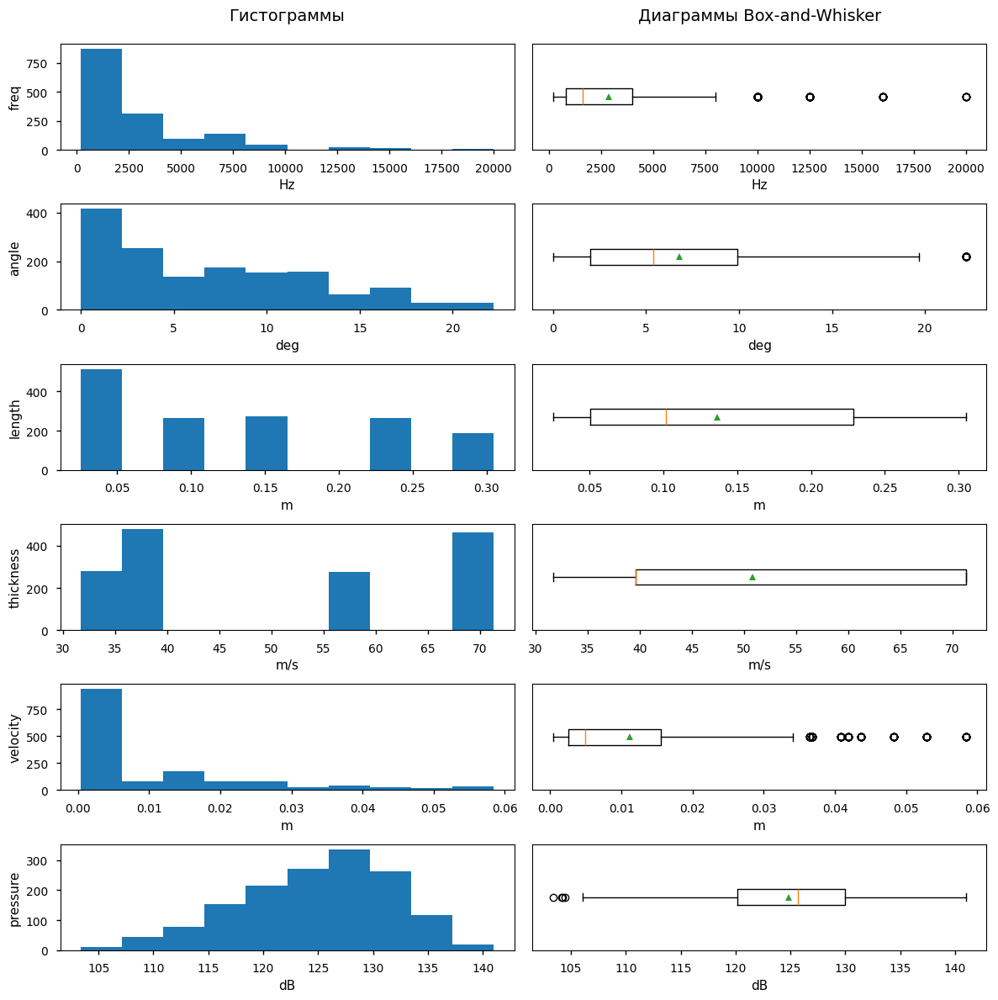

In [20]:
fig, axes = plt.subplots(ncols=2, nrows=len(df.columns), figsize=(12, 12))

axes[0, 0].set_title("Гистограммы", fontsize=14, pad=20)
axes[0, 1].set_title("Диаграммы Box-and-Whisker", fontsize=14, pad=20)

for i, column in enumerate(df.columns):
    axes[i, 0].hist(df[column])
    axes[i, 0].set_ylabel(column)
    axes[i, 0].set_xlabel(units[i])

    axes[i, 1].boxplot(df[column], vert=False, showmeans=True)
    axes[i, 1].set_xlabel(units[i])
    axes[i, 1].set_yticks([])

plt.tight_layout()
plt.show()

### 1.2.2. Корреляционная матрица признаков <a id="122"></a>

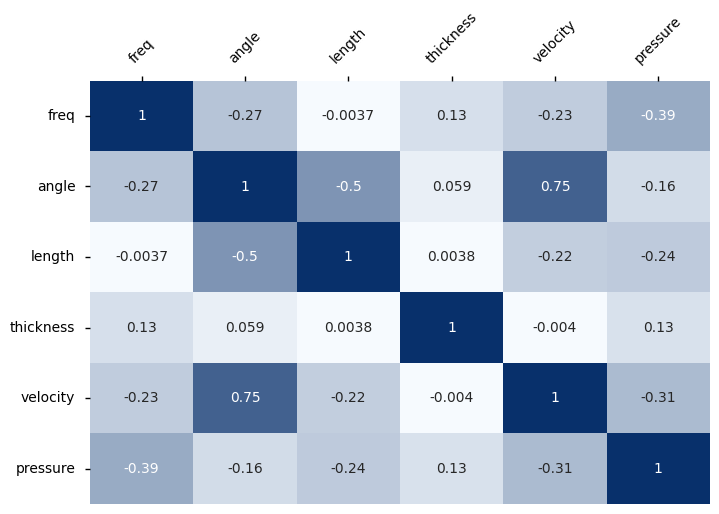

In [21]:
colors = ["#08306b", "#f7fbff", "#08306b"]  # тёмно-синий → белый → тёмно-синий
custom_diverging_blues = LinearSegmentedColormap.from_list("custom_div_blues", colors)

ax = sns.heatmap(
    df.corr(), cbar=False, annot=True, cmap=custom_diverging_blues, vmin=-1, vmax=1
)
ax.xaxis.tick_top()
ax.xaxis.set_tick_params(rotation=45)
ax.yaxis.set_tick_params(rotation=0)
plt.show()

### 1.2.3. Диаграммы рассеяния <a id="123"></a>

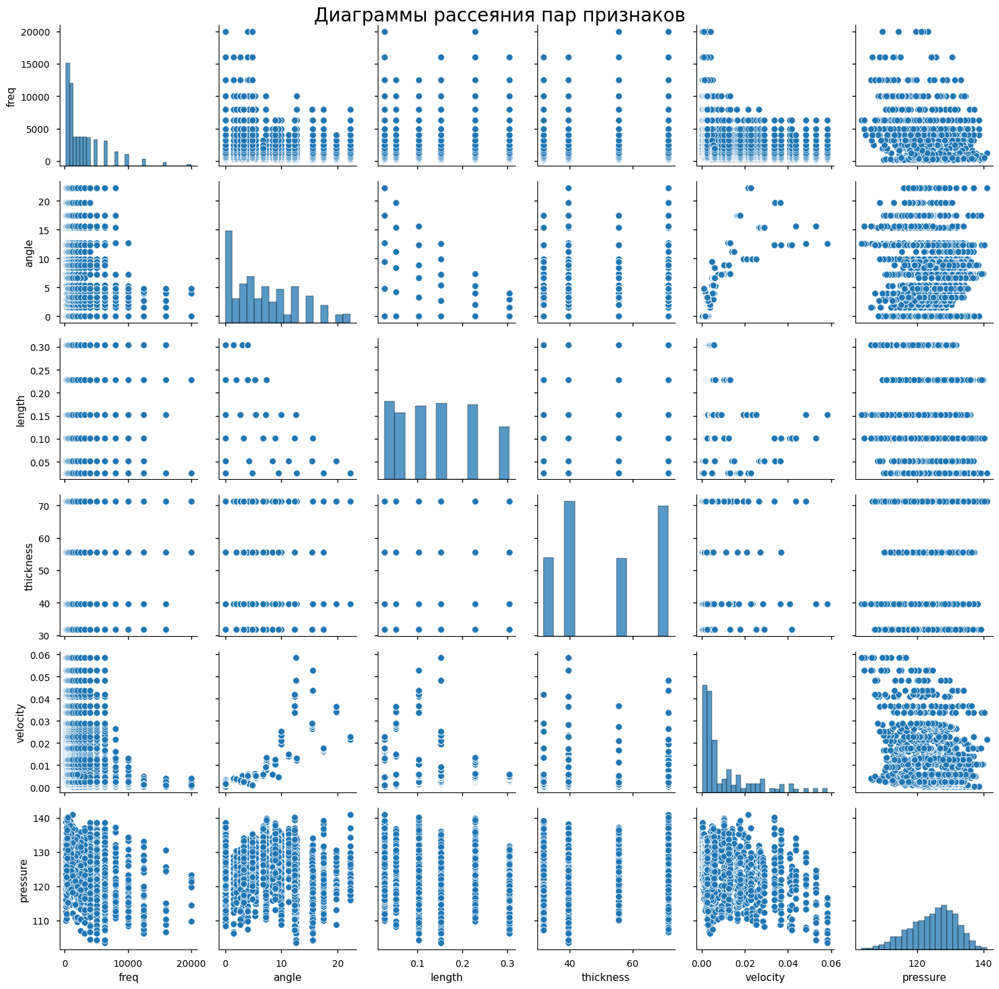

In [22]:
sns.pairplot(df)
plt.suptitle("Диаграммы рассеяния пар признаков", fontsize=20)
plt.tight_layout()
plt.show()

# 2. Предобработка данных <a id="2"></a>

## 2.1. Очистка данных <a id="21"></a>

### 2.1.1. Обнаружение и удаление дубликатов <a id="211"></a>

In [23]:
df[df.duplicated()]

,freq,angle,length,thickness,velocity,pressure


### 2.1.2. Обнаружение и удаление выбросов <a id="212"></a>

В лекциях я узнал про следующие методы обнаружения выбросов:
- Обычные статистические ($3\sigma$, IQR).
- На основе расстояния (плохо для высокомерного пространства признаков).
- На основе плотности.
- На основе спектра углов.

Еще немного порывшись в интернете, я нашел более конкретные способы:
- Основанные на моделях (One Class SVM, Isolation Forest,  Extended Isolation Forest).
- Автоэнкодеры.

#### Функции для подраздела

In [24]:
def anomalies_report(outliers):
    print(f"Total number of outliers: {sum(outliers)}")
    print(f"Percentage of outliers:   {sum(outliers) / len(outliers):.2%}")

In [25]:
# для методов, ищущих аномалии по каждой колонке
def get_column_outliers(data, function, columns=None, *args, **kwargs):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns

    outliers = pd.Series(data=[False] * len(data), index=data.index, name="is_outlier")
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, *args, **kwargs)
        comparison_table[column] = [
            upper_bound,
            lower_bound,
            sum(anomalies),
            100 * sum(anomalies) / len(anomalies),
        ]
        outliers[anomalies[anomalies].index] = True

    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns = [
        "upper_bound",
        "lower_bound",
        "anomalies_count",
        "anomalies_percentage",
    ]

    return comparison_table, outliers

In [26]:
def marker_outliers_pairplot(data, outlier_mask):
    labeled_data = data.copy()
    labeled_data["is_outlier"] = outlier_mask
    sns.pairplot(data=labeled_data, hue="is_outlier", markers=["o", "X"])
    plt.show()

In [27]:
def marker_outliers_tsne(data, outlier_mask, perplexity=5):
    tsne = TSNE(perplexity=perplexity, n_jobs=-1, random_state=SEED)
    tsne_transformed = pd.DataFrame(data=tsne.fit_transform(data), columns=["x", "y"])
    tsne_transformed["is_outlier"] = outlier_mask
    plt.figure(figsize=(10, 10))
    sns.scatterplot(
        tsne_transformed, x="x", y="y", hue="is_outlier", markers=["o", "X"]
    )
    plt.show()

#### Метод $3\sigma$

In [28]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col] > up_bound, data[col] < low_bound], axis=1).any(
        axis=1
    )
    return anomalies, up_bound, low_bound

In [29]:
comparison_table, std_outliers = get_column_outliers(X, outlier_std, threshold=3)
anomalies_report(std_outliers)
comparison_table

Total number of outliers: 76
Percentage of outliers:   5.06%


,upper_bound,lower_bound,anomalies_count,anomalies_percentage
freq,12344.099983,-6571.338839,44.0,2.927478
angle,24.536686,-10.972082,0.0,0.000000
length,0.417170,-0.144074,0.0,0.000000
thickness,97.579098,4.142392,0.0,0.000000
velocity,0.050591,-0.028311,32.0,2.129075


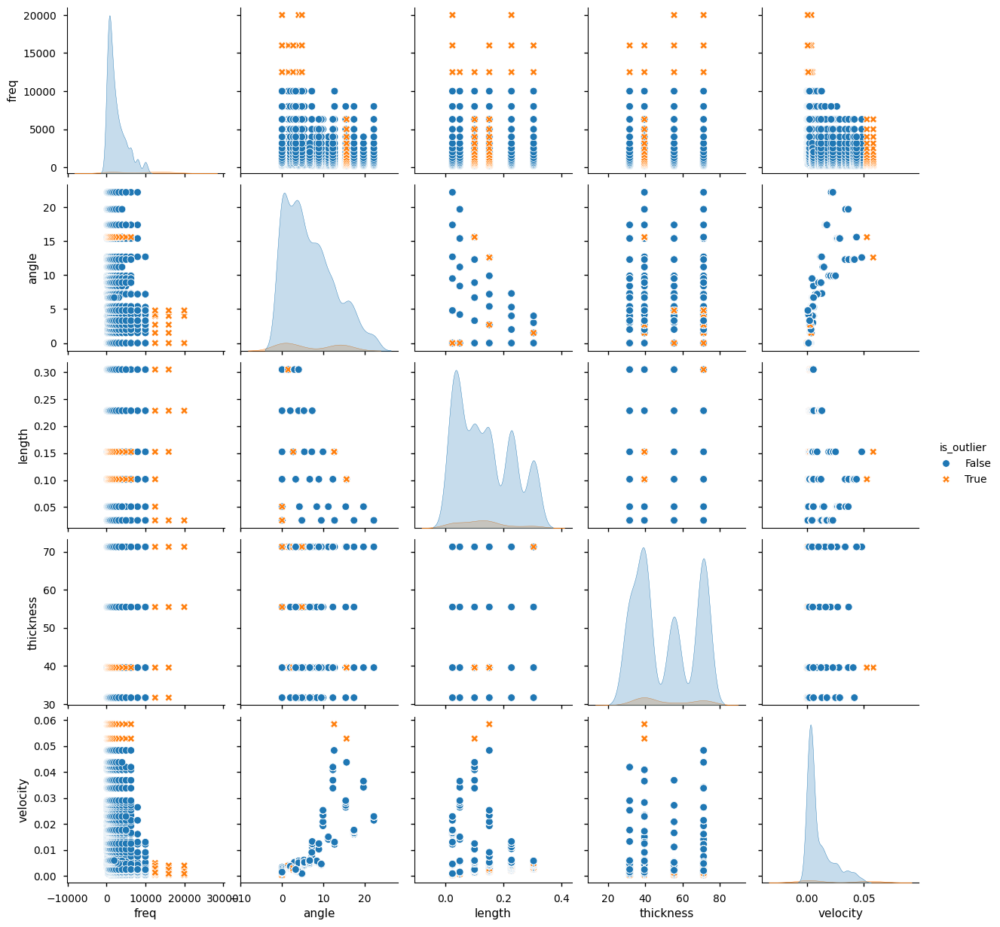

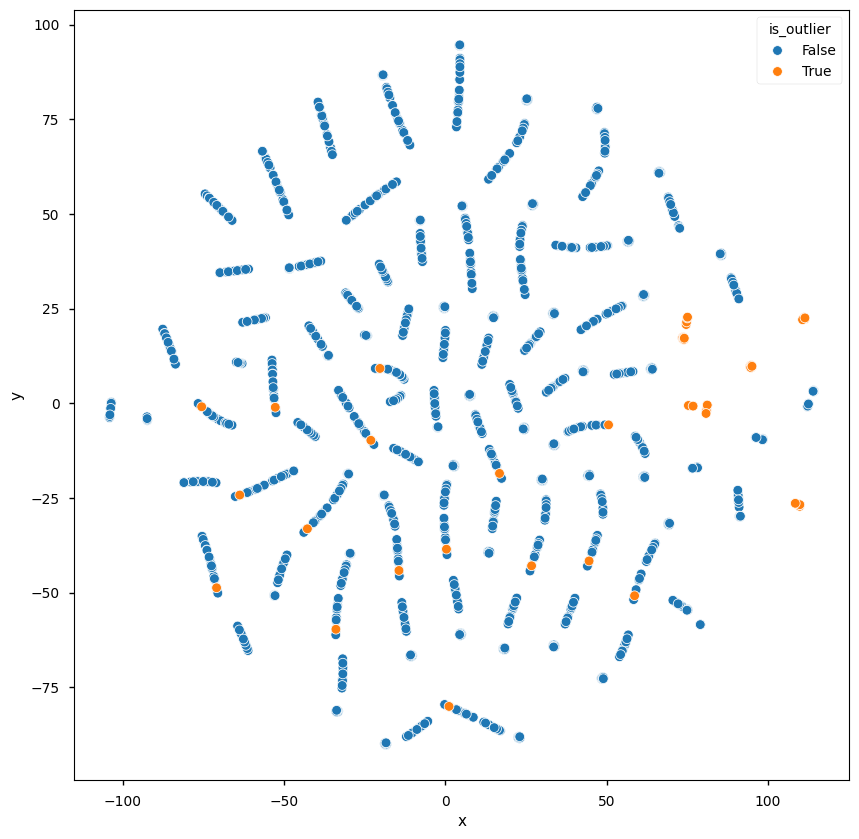

In [30]:
marker_outliers_pairplot(X, std_outliers)
marker_outliers_tsne(X, std_outliers)

#### Метод IQR

In [31]:
def outlier_iqr(data, col, threshold=1.5):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col] > up_bound, data[col] < low_bound], axis=1).any(
        axis=1
    )
    return anomalies, up_bound, low_bound

In [32]:
comparison_table, iqr_outliers = get_column_outliers(X, outlier_iqr, threshold=1.5)
anomalies_report(iqr_outliers)
comparison_table

Total number of outliers: 240
Percentage of outliers:   15.97%


,upper_bound,lower_bound,anomalies_count,anomalies_percentage
freq,8800.000000,-4000.000000,86.0,5.721890
angle,21.750000,-9.850000,30.0,1.996008
length,0.495300,-0.215900,0.0,0.000000
thickness,118.850000,-7.950000,0.0,0.000000
velocity,0.035137,-0.017026,124.0,8.250166


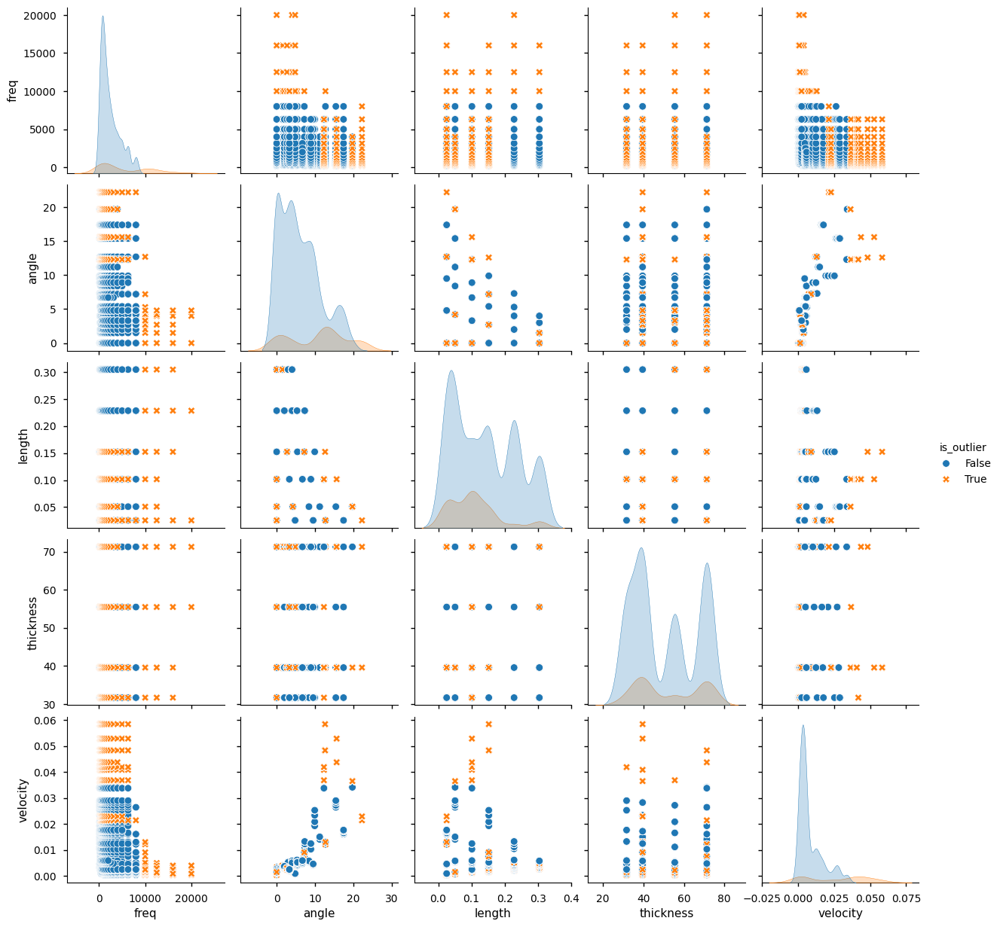

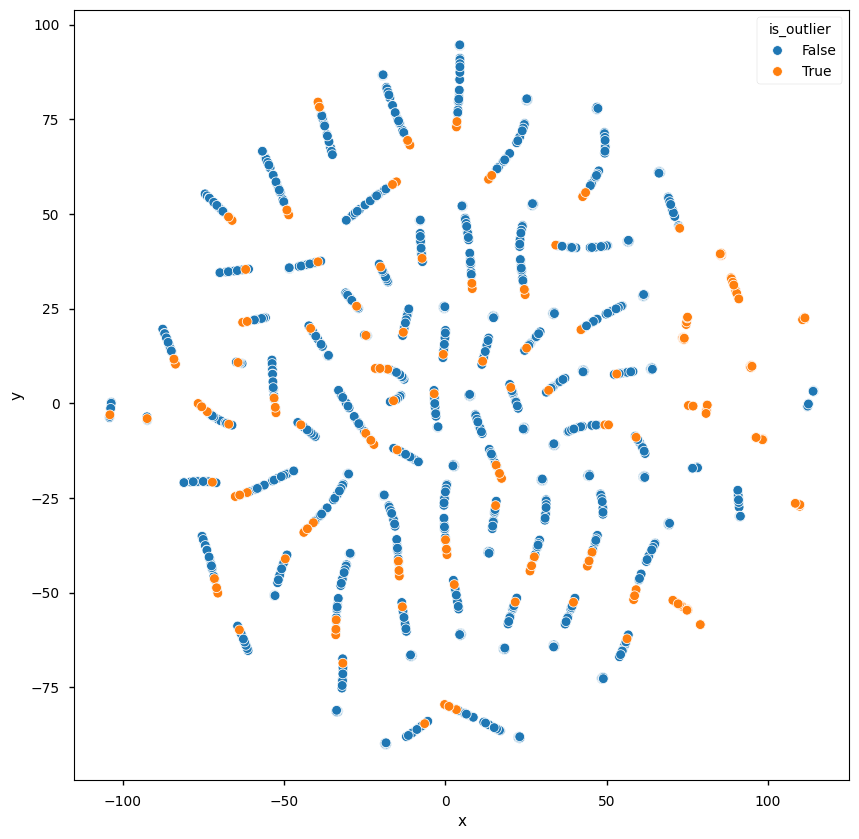

In [33]:
marker_outliers_pairplot(X, iqr_outliers)
marker_outliers_tsne(X, iqr_outliers)

#### Методы, основанные на расстоянии

In [34]:
def outlier_knn(data, k=5, threshold=95):
    nbrs = NearestNeighbors(n_neighbors=k).fit(X)
    distances, inds = nbrs.kneighbors(data)
    mean_dist = distances.mean(axis=1)
    threshold = np.percentile(mean_dist, threshold)
    outliers = mean_dist > threshold
    return outliers

Total number of outliers: 76
Percentage of outliers:   5.06%


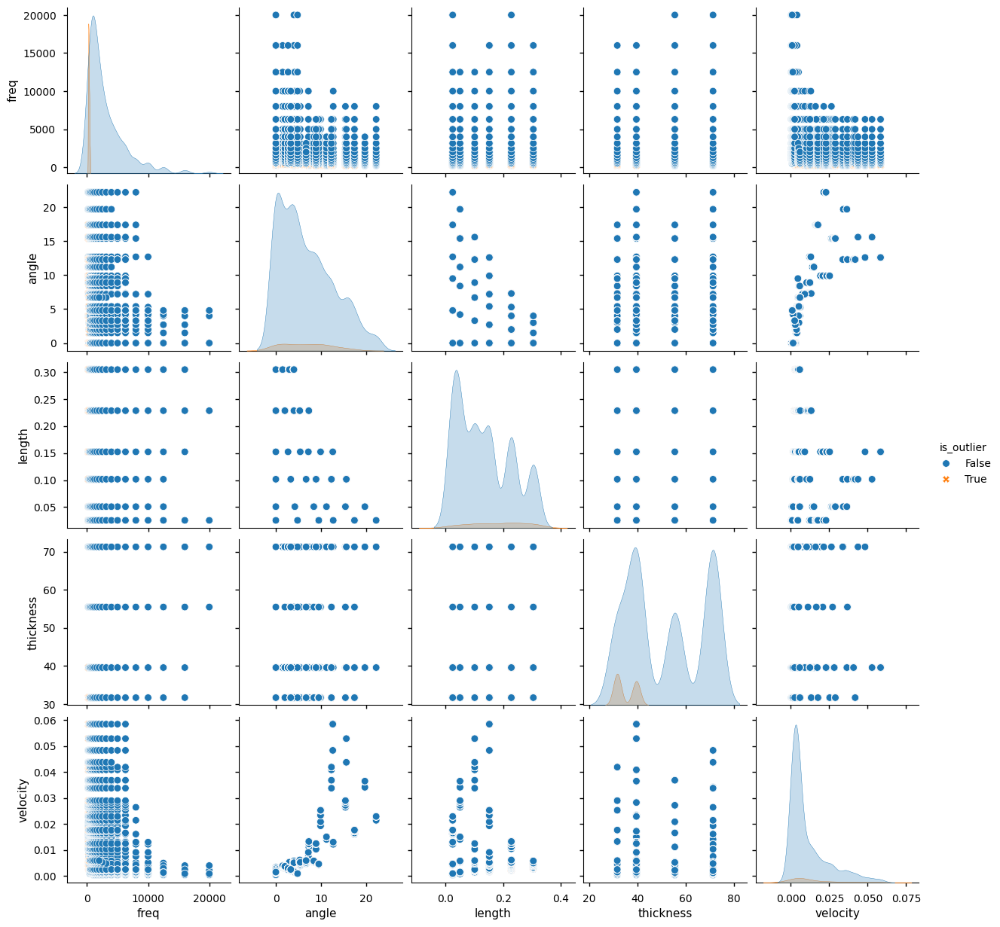

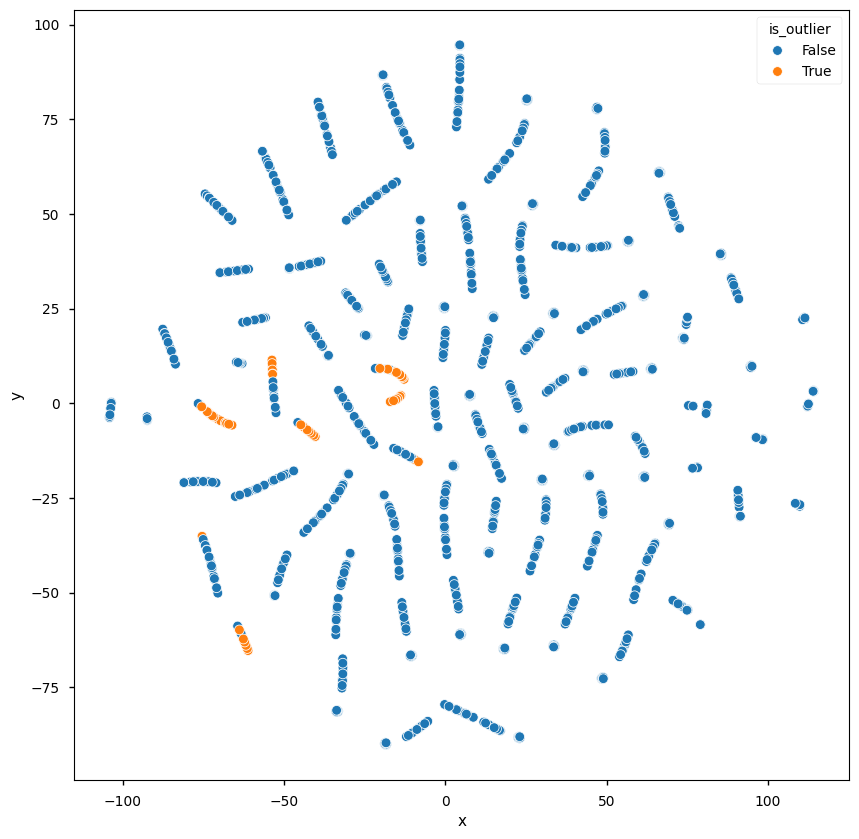

In [35]:
X_scaled = pd.DataFrame(data=RobustScaler().fit_transform(X), columns=X.columns)
knn_outliers = outlier_knn(X_scaled, k=10)
anomalies_report(knn_outliers)
marker_outliers_pairplot(X, knn_outliers)
marker_outliers_tsne(X, knn_outliers)

In [36]:
def outlier_distanse(data, metric="euclidean", threshold=90):
    centroid = np.mean(data, axis=0).values.reshape(1, -1)
    distances = cdist(centroid, data, metric=metric).reshape(-1)
    threshold = np.percentile(distances, threshold)
    outliers = distances > threshold
    return outliers

Total number of outliers: 151
Percentage of outliers:   10.05%


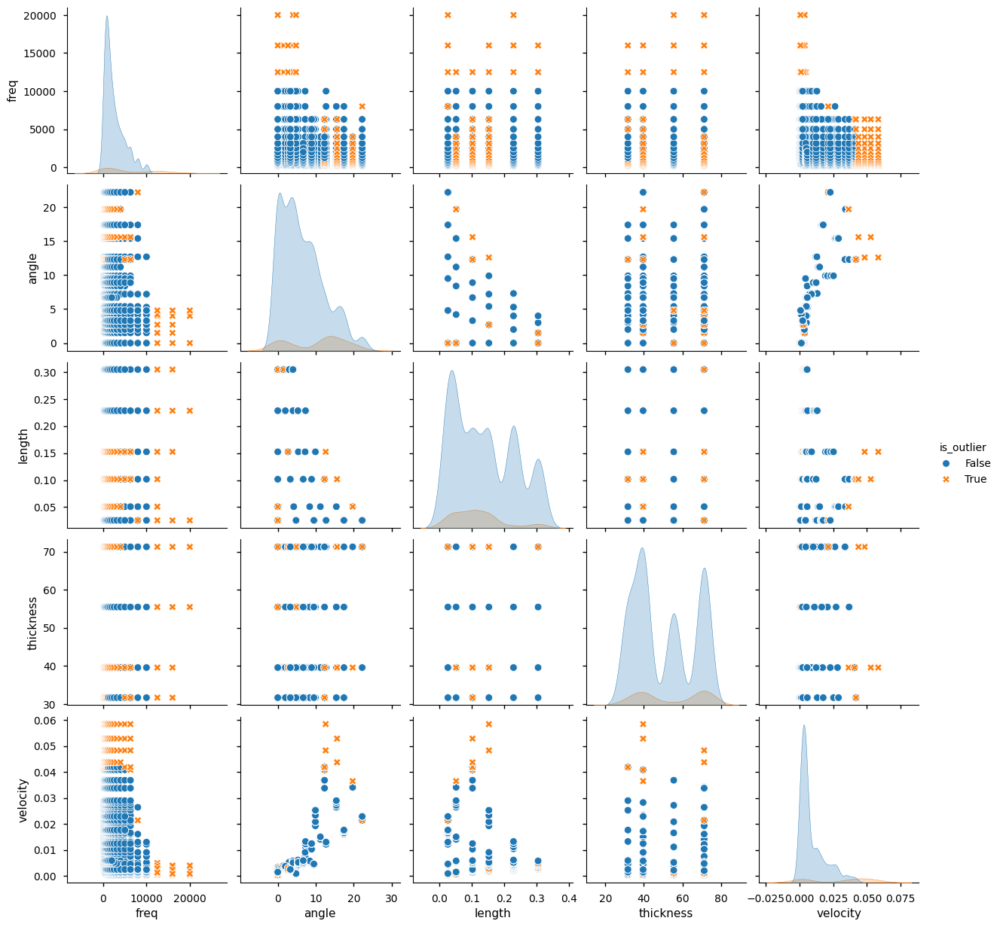

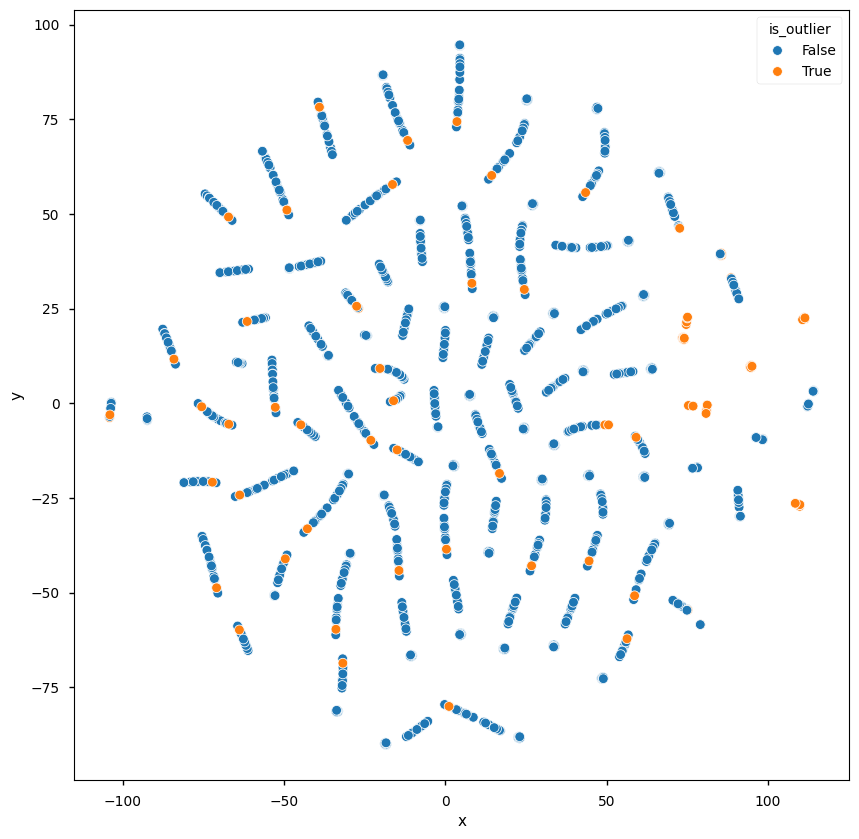

In [37]:
euclidean_outliers = outlier_distanse(X_scaled, metric="euclidean", threshold=90)
anomalies_report(euclidean_outliers)
marker_outliers_pairplot(X, euclidean_outliers)
marker_outliers_tsne(X, euclidean_outliers)

Total number of outliers: 151
Percentage of outliers:   10.05%


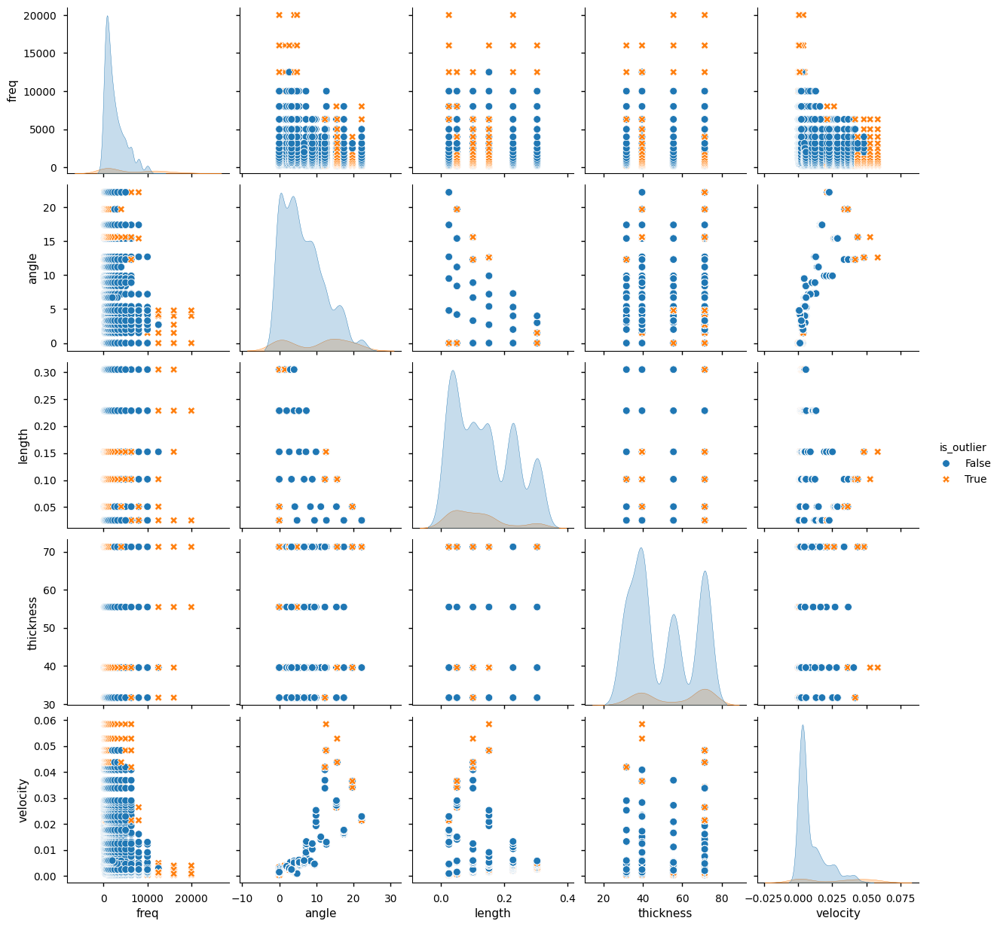

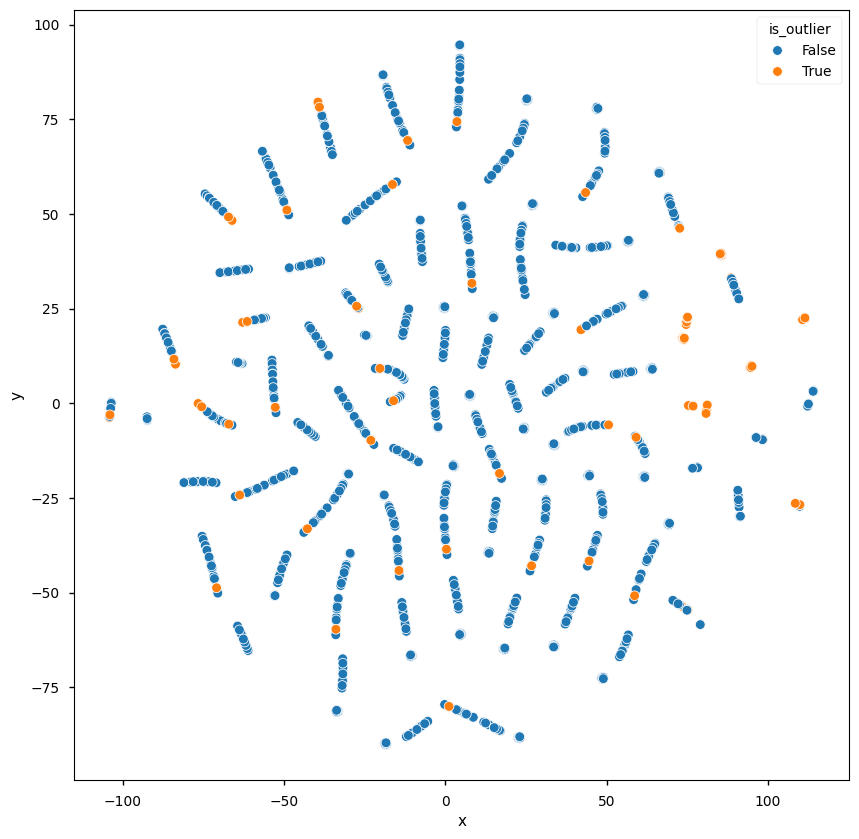

In [38]:
manhattan_outliers = outlier_distanse(X_scaled, metric="cityblock", threshold=90)
anomalies_report(manhattan_outliers)
marker_outliers_pairplot(X, manhattan_outliers)
marker_outliers_tsne(X, manhattan_outliers)

#### Методы, основанные на плотности

Total number of outliers: 20
Percentage of outliers:   1.33%


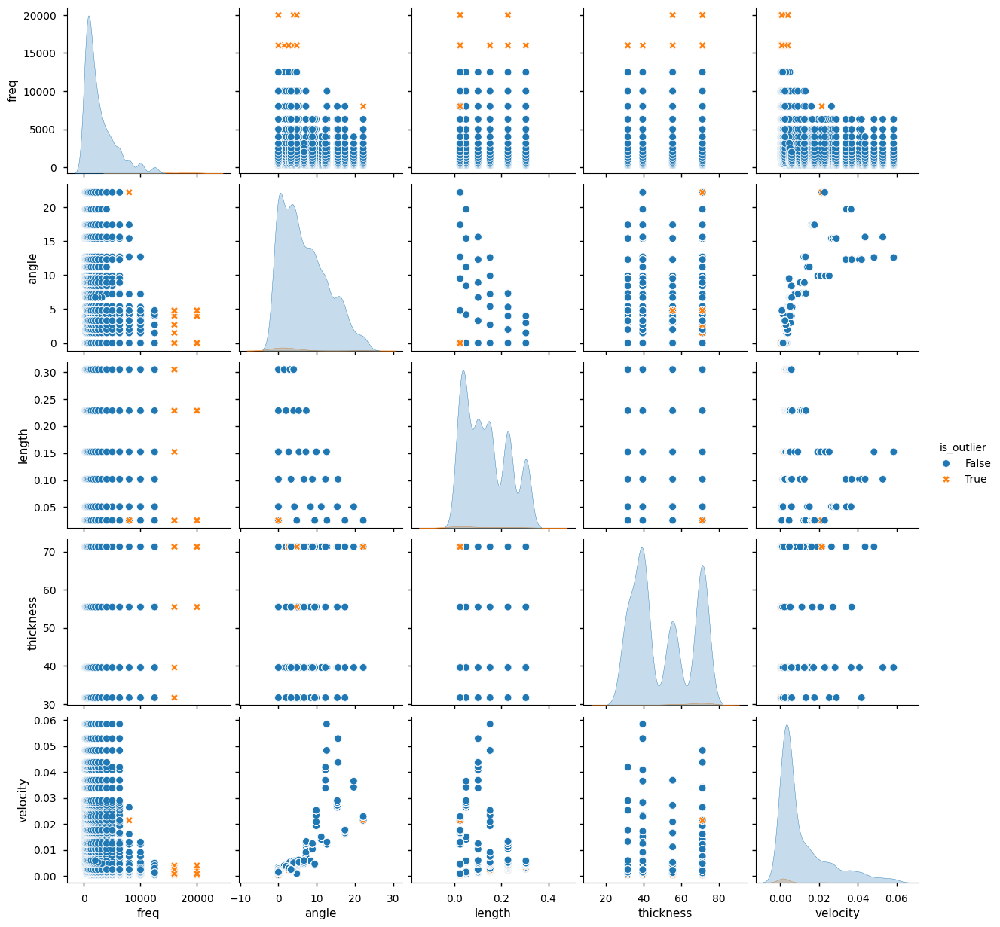

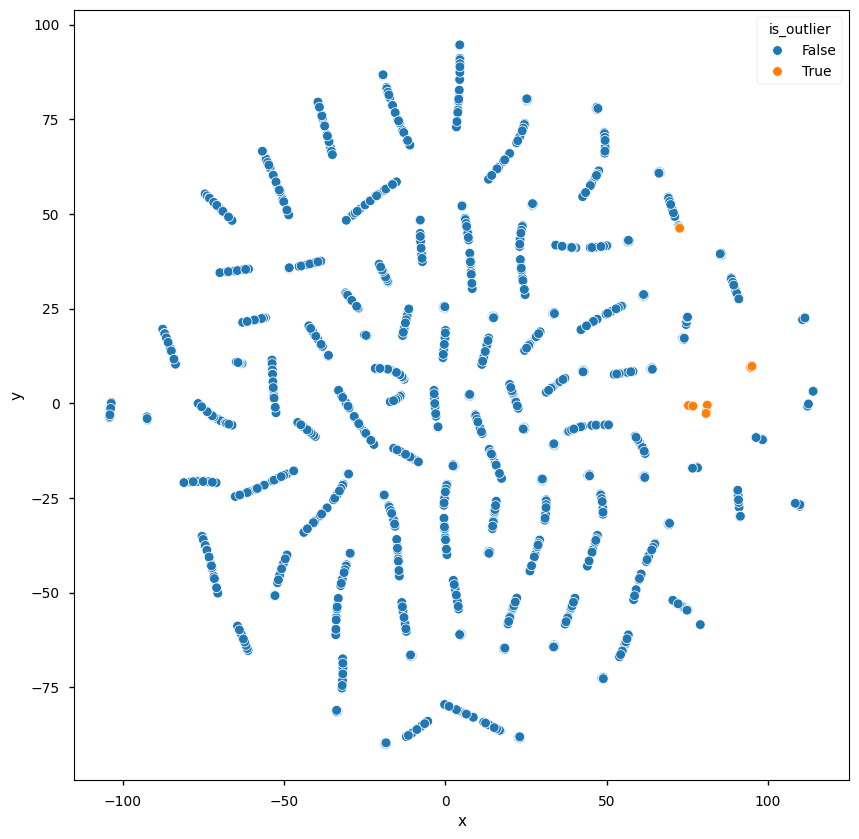

In [39]:
lof_outliers = LocalOutlierFactor(n_neighbors=150).fit_predict(X_scaled) == -1
anomalies_report(lof_outliers)
marker_outliers_pairplot(X, lof_outliers)
marker_outliers_tsne(X, lof_outliers)

In [40]:
def outlier_dbscan(data):
    outlier_percentage = 1.0

    # берем маленький эпсилон и начинаем увеличивать
    eps = 0.05
    while outlier_percentage > 0.1:
        model = DBSCAN(eps=eps).fit(X_scaled)
        # считаем текущий процент "выбросов"
        outlier_percentage = sum(model.labels_ == -1) / len(model.labels_)
        eps += 0.05

    model = DBSCAN(eps)
    model.fit(data)
    outliers = np.array([1 if label == -1 else 0 for label in model.labels_])
    return outliers

Total number of outliers: 76
Percentage of outliers:   5.06%


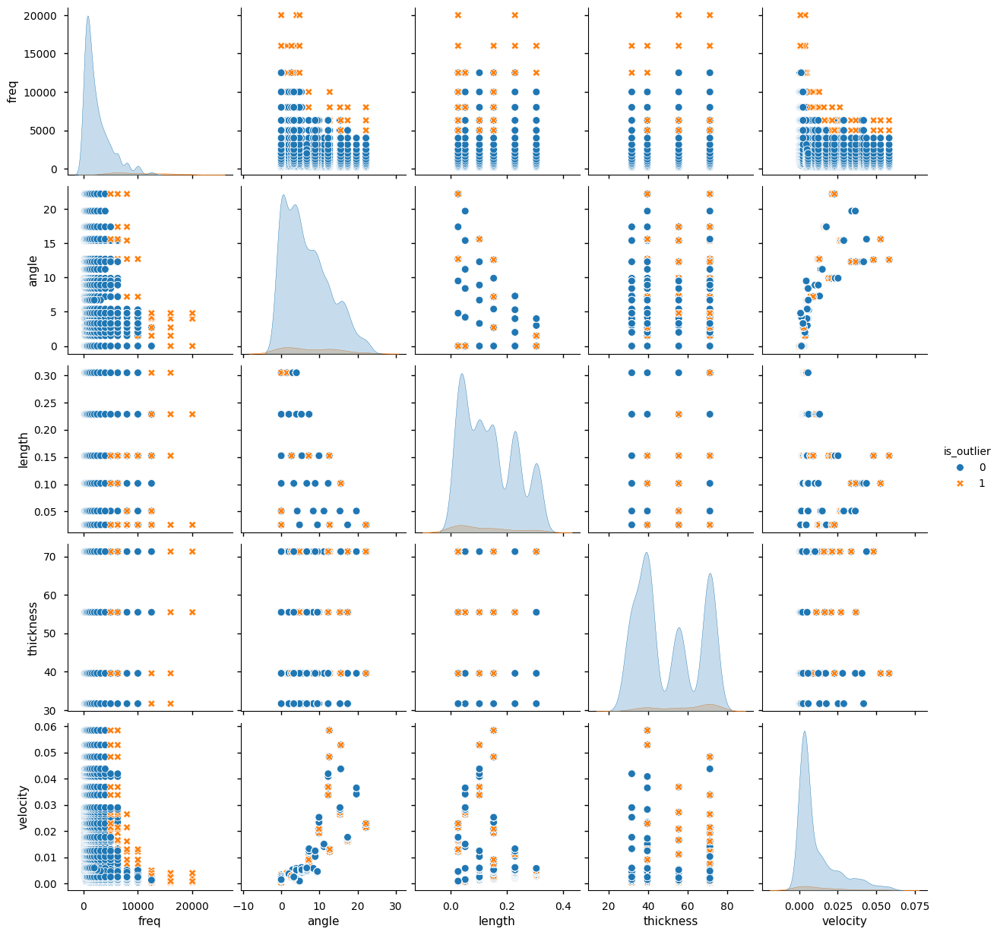

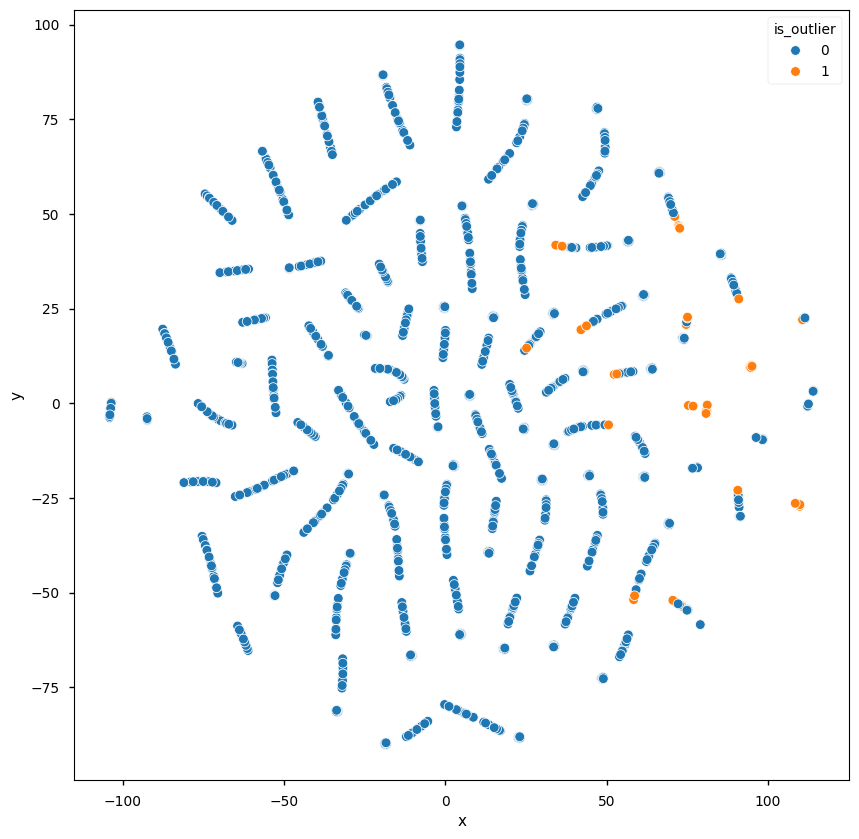

In [41]:
dbscan_outliers = outlier_dbscan(X_scaled)
anomalies_report(dbscan_outliers)
marker_outliers_pairplot(X, dbscan_outliers)
marker_outliers_tsne(X, dbscan_outliers)

#### Методы, основанные на углах

In [42]:
def outlier_abod(data, top_percentile=10):
    X = data.values
    n = X.shape[0]
    abod_scores = np.zeros(n)

    # Функция дисперсии косинусов между векторами от одной точки
    def angular_variance(x0, other_points):
        vectors = other_points - x0
        m = vectors.shape[0]
        cosines = []

        for i, j in combinations(range(m), 2):
            v1, v2 = vectors[i], vectors[j]
            dot = np.dot(v1, v2)
            norm = np.linalg.norm(v1) * np.linalg.norm(v2)
            cos = dot / norm if norm > 1e-10 else 0
            cosines.append(cos)
        return np.var(cosines)

    nbrs = NearestNeighbors(n_neighbors=100, algorithm="auto").fit(X)
    distances, indices = nbrs.kneighbors(X)

    for i in range(n):
        neighbor_idx = indices[i][1:]  # исключаем саму точку
        neighbors = X[neighbor_idx]
        abod_scores[i] = angular_variance(X[i], neighbors)

    # Чем меньше score, тем больше подозрение на выброс
    threshold = np.percentile(abod_scores, top_percentile)
    outlier_mask = abod_scores <= threshold

    return outlier_mask

Total number of outliers: 151
Percentage of outliers:   10.05%


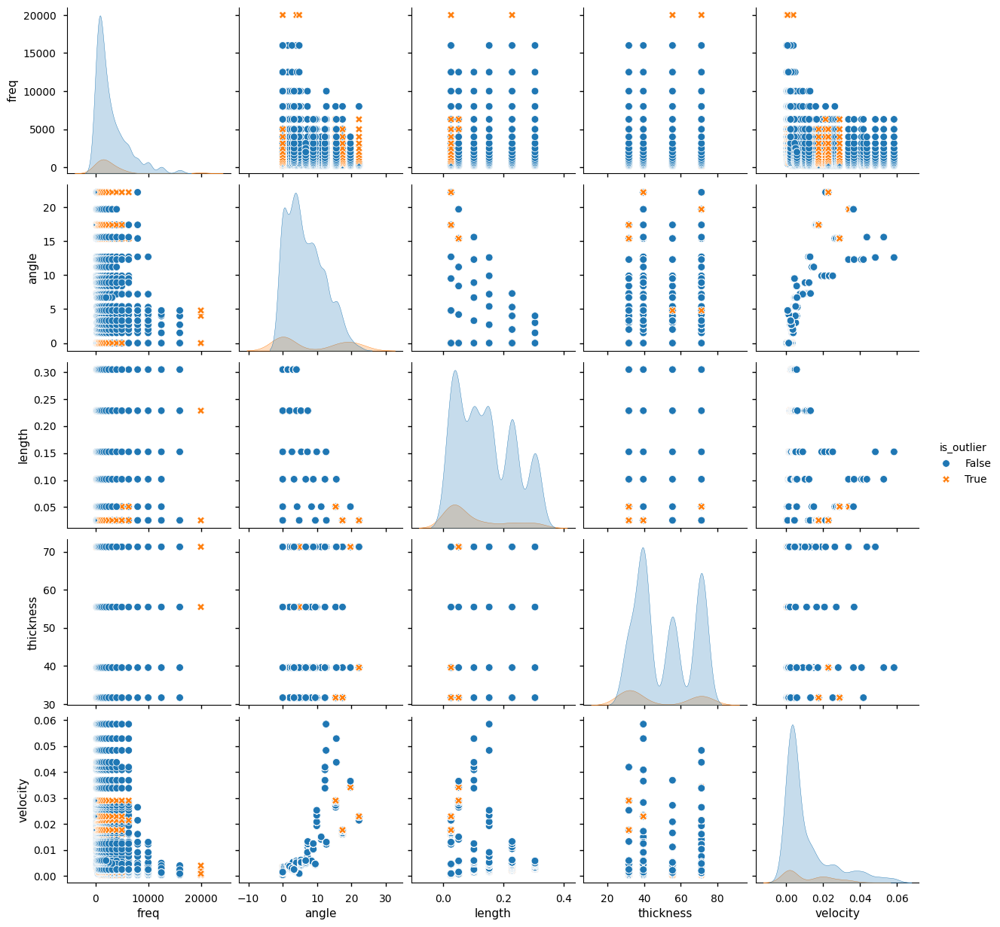

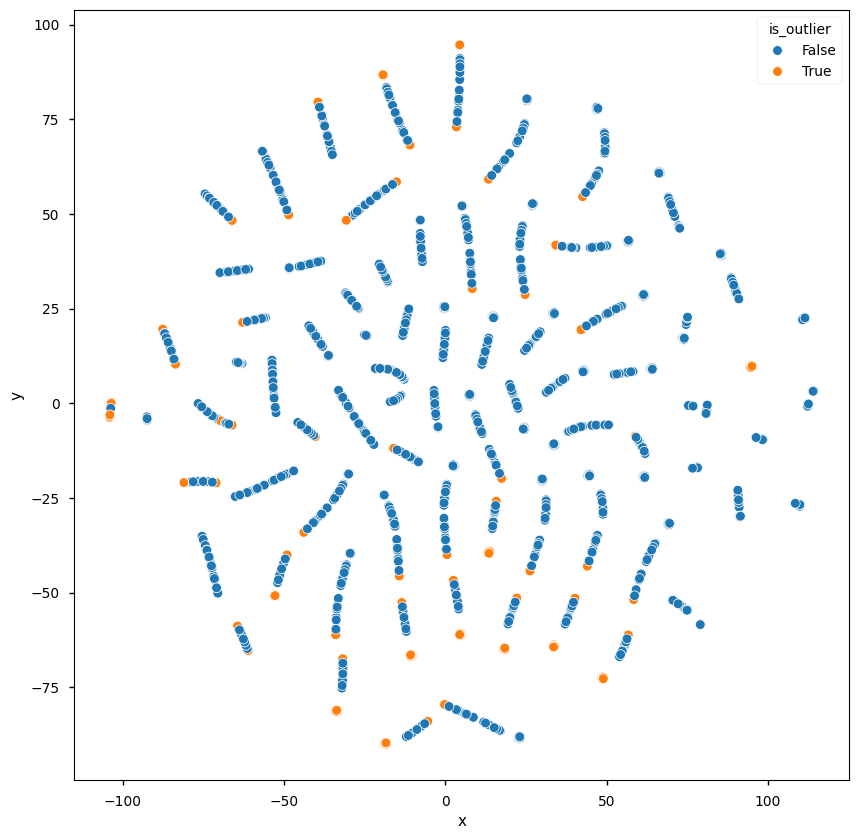

In [43]:
abod_outliers = outlier_abod(X)
anomalies_report(abod_outliers)
marker_outliers_pairplot(X, abod_outliers)
marker_outliers_tsne(X, abod_outliers)

#### Методы на основе моделей

Total number of outliers: 151
Percentage of outliers:   10.05%


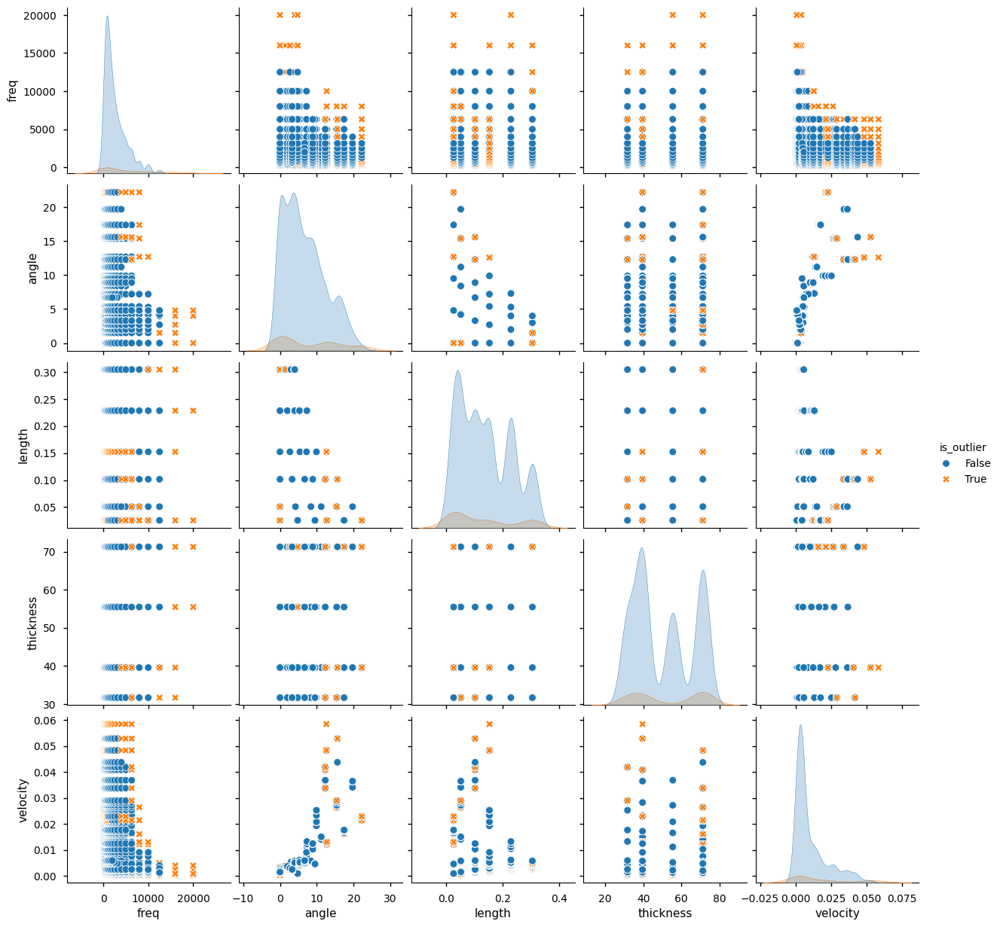

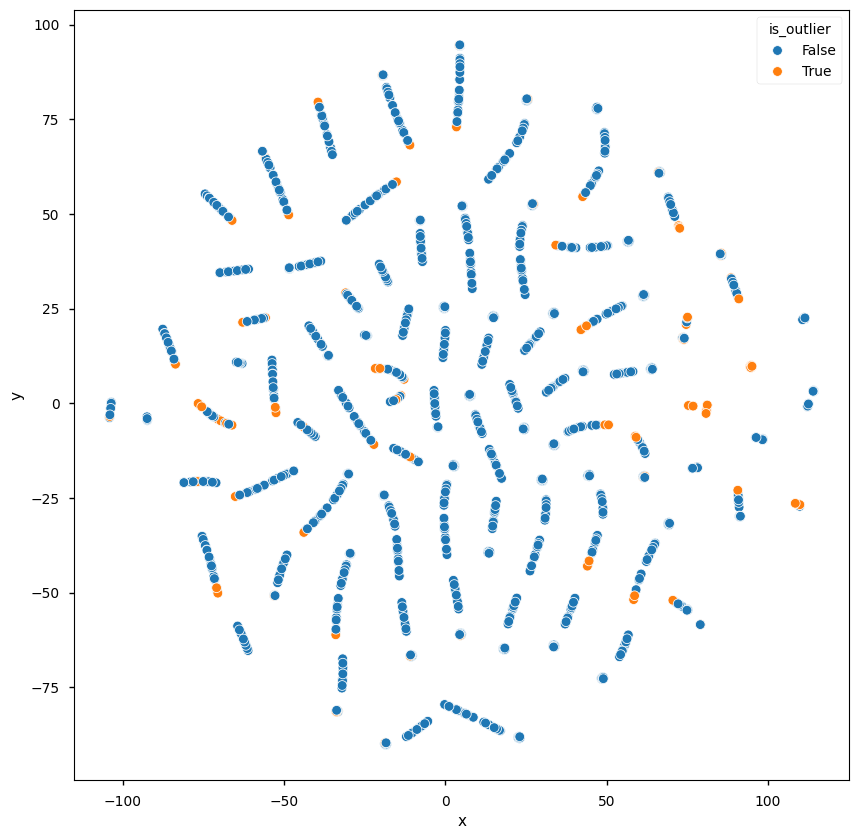

In [44]:
# One Class SVM
svm_outliers = OneClassSVM(nu=0.1, gamma="auto").fit_predict(X_scaled) == -1
anomalies_report(svm_outliers)
marker_outliers_pairplot(X, svm_outliers)
marker_outliers_tsne(X, svm_outliers)

Total number of outliers: 151
Percentage of outliers:   10.05%


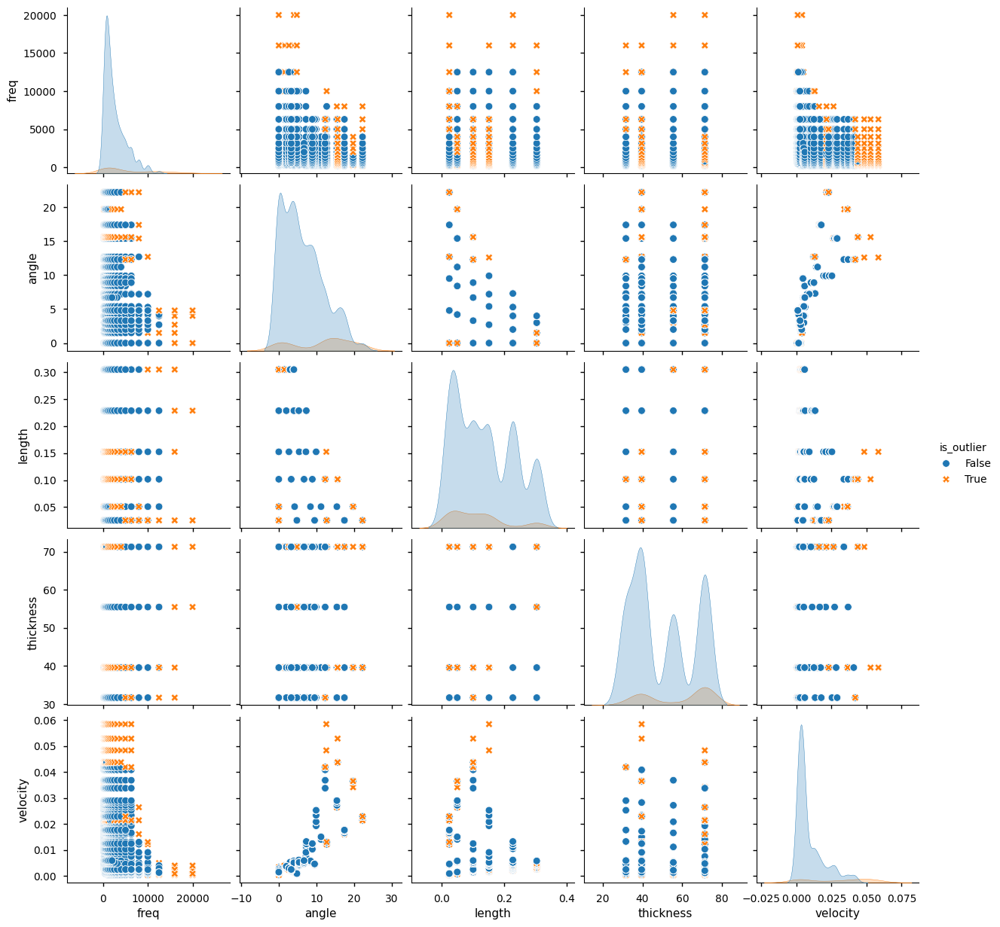

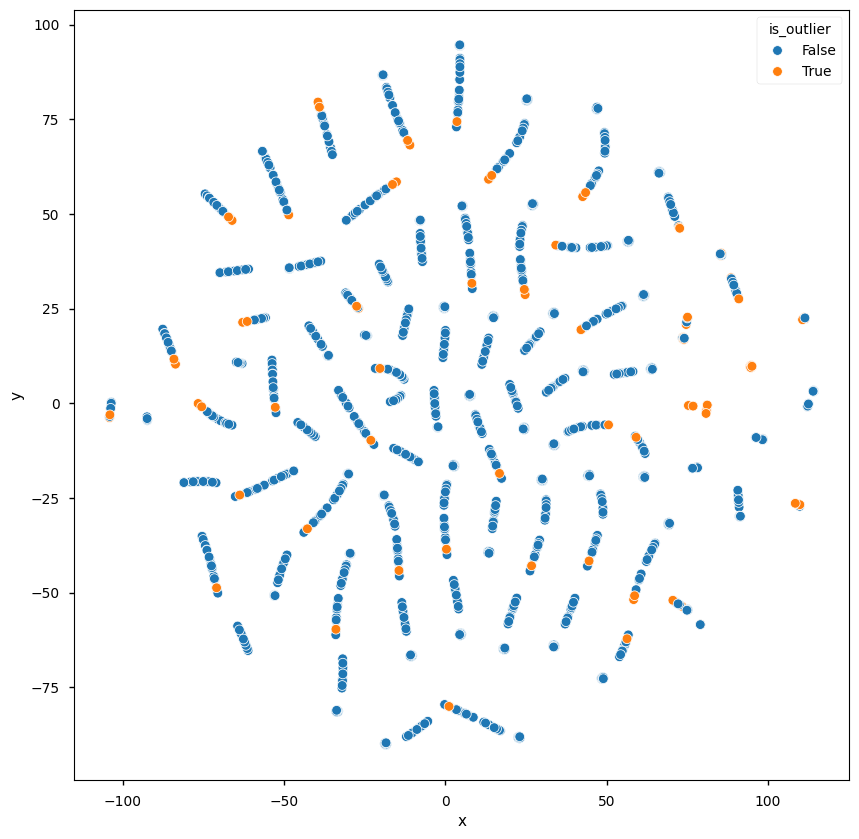

In [45]:
# Isolation Forest
if_outliers = (
    IsolationForest(max_samples=100, contamination=0.1, random_state=SEED).fit_predict(
        X
    )
    == -1
)
anomalies_report(if_outliers)
marker_outliers_pairplot(X, if_outliers)
marker_outliers_tsne(X, if_outliers)

#### Сравнение и принятие решения

In [46]:
summary = np.concatenate(
    (
        [std_outliers],
        [iqr_outliers],
        [knn_outliers],
        [euclidean_outliers],
        [manhattan_outliers],
        [lof_outliers],
        [dbscan_outliers],
        [abod_outliers],
        [svm_outliers],
        [if_outliers],
    )
).T

methods = [
    "std",
    "iqr",
    "knn",
    "euclid",
    "manhattan",
    "lof",
    "dbscan",
    "abod",
    "svm",
    "isoFor",
]
summary = pd.DataFrame(summary, columns=methods)
summary.head()

,std,iqr,knn,euclid,manhattan,lof,dbscan,abod,svm,isoFor
0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,1,1,0
2,0,0,0,0,0,0,0,1,1,0
3,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,1,0,0


In [47]:
# распределение аномалий по количеству методов, которые их обнаружили
summary.sum(axis=1).value_counts().sort_index()

0    1039
1     224
2      60
3      43
4      42
5      33
6      22
7      21
8      13
9       6
Name: count, dtype: int64

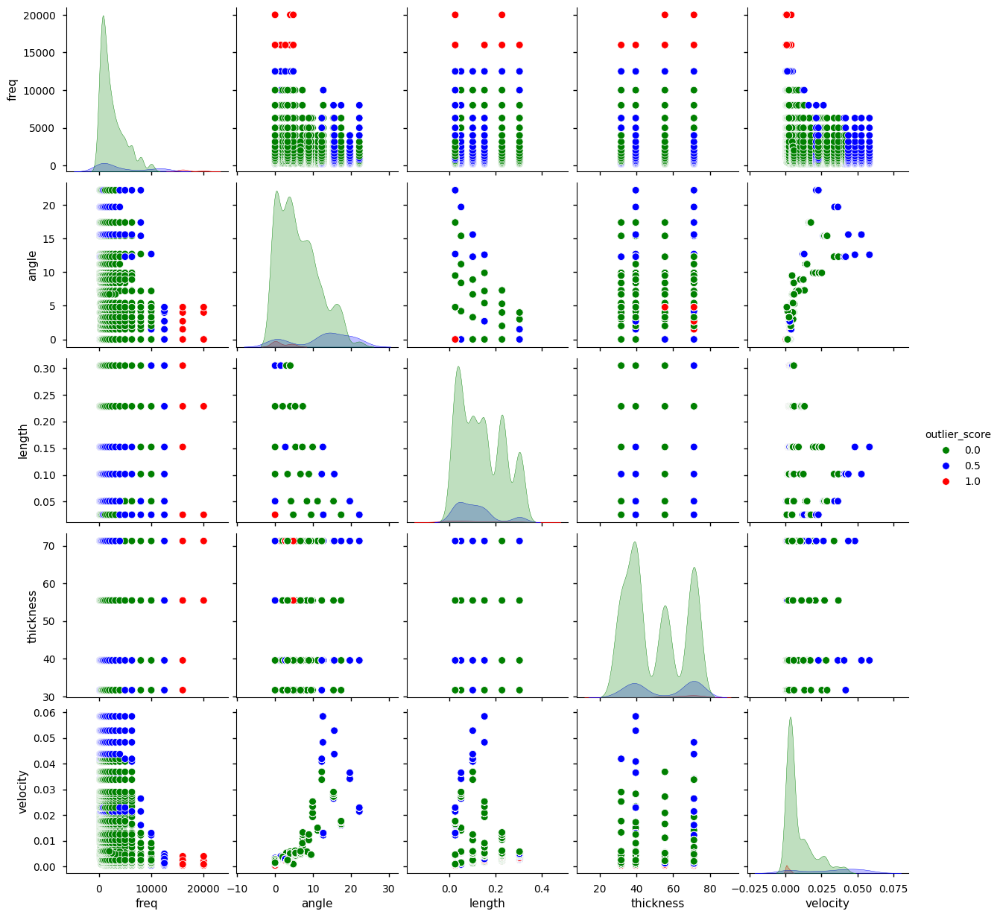

In [48]:
outlier_score = summary.mean(axis=1).apply(
    lambda x: 0 if x < 0.25 else 0.5 if x < 0.75 else 1
)
labeled_data = X.copy()
labeled_data["outlier_score"] = outlier_score
custom_palette = {0: "g", 0.5: "b", 1.0: "r"}
sns.pairplot(data=labeled_data, hue="outlier_score", palette=custom_palette)
plt.show()

In [49]:
# теперь учитываем только 5 последних методов
outliers_last_score = summary[methods[5:]]
outliers_last_score.sum(axis=1).value_counts().sort_index()

0    1171
1     198
2      80
3      31
4      17
5       6
Name: count, dtype: int64

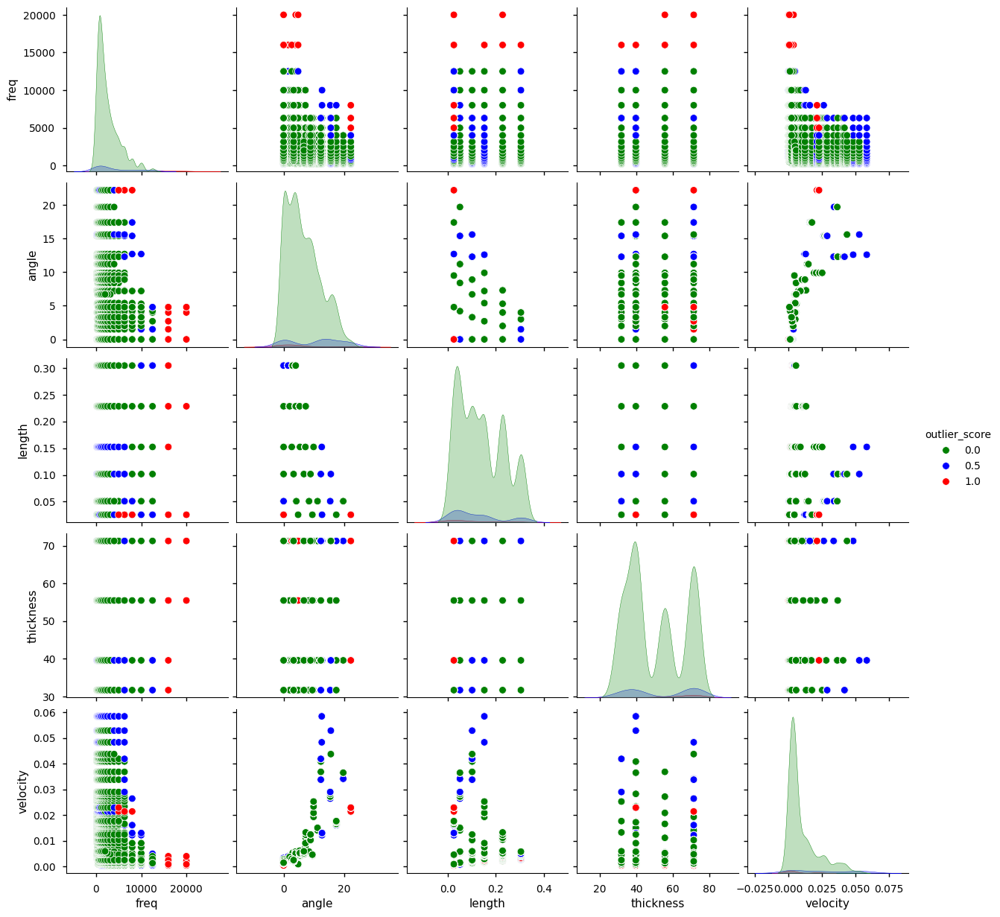

In [50]:
labeled_data = X.copy()
labeled_data["outlier_score"] = outliers_last_score.mean(axis=1).apply(
    lambda x: 0 if x < 0.25 else 0.5 if x < 0.75 else 1
)
custom_palette = {0: "g", 0.5: "b", 1.0: "r"}
sns.pairplot(data=labeled_data, hue="outlier_score", palette=custom_palette)
plt.show()

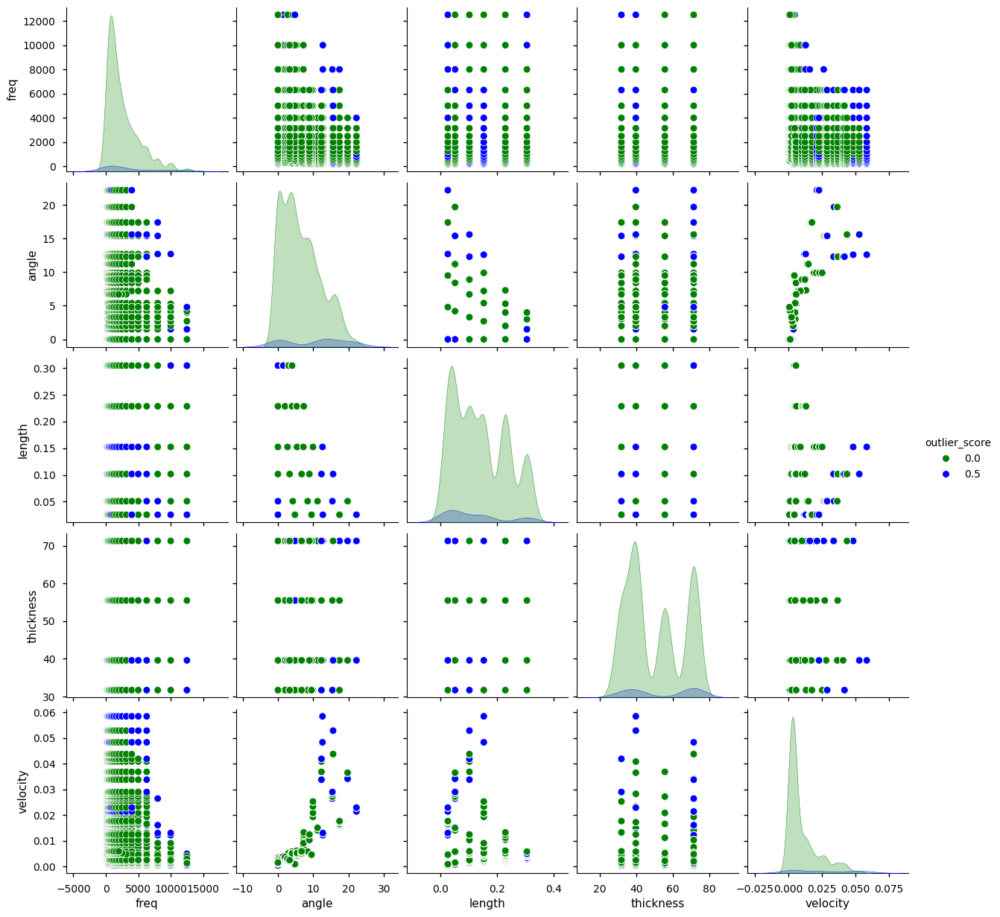

In [51]:
# выкинем красные точки как самые подозрительные значения
sns.pairplot(
    data=labeled_data[labeled_data["outlier_score"] < 0.75],
    hue="outlier_score",
    palette=custom_palette,
)
plt.show()

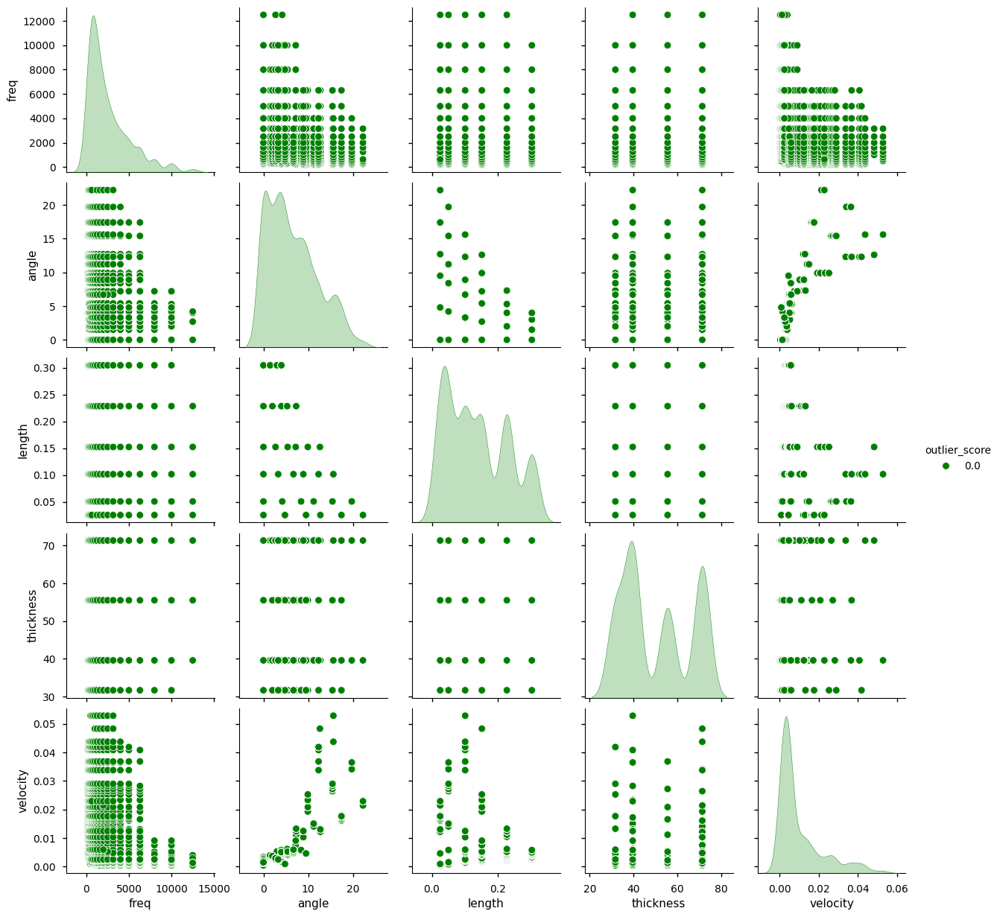

In [52]:
# посмотрим что будет, если выбросить еще и синие точки
sns.pairplot(
    data=labeled_data[labeled_data["outlier_score"] < 0.5],
    hue="outlier_score",
    palette=custom_palette,
)
plt.show()

Было принято решение удалить все примеры, посчитанные как выбросы последними методами в более, чем 3 из 5 случаев. Таким образом было удалено 23 из 1503 примеров (1.53%).

In [53]:
outliers = X[labeled_data["outlier_score"] >= 0.75]
print(
    f"Количество выбросов: {len(outliers)}, процентное соотношение: {len(outliers)/len(X):.2%}"
)

Количество выбросов: 23, процентное соотношение: 1.53%


In [54]:
# забываем про выбросы, перезаписывая датафреймы
X = X[labeled_data["outlier_score"] < 0.75]
y = y[labeled_data["outlier_score"] < 0.75]
df = pd.concat((X, y), axis=1)

### 2.1.3. Пропущенные значения <a id="213"></a>

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1480 entries, 0 to 1502
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   freq       1480 non-null   int64  
 1   angle      1480 non-null   float64
 2   length     1480 non-null   float64
 3   thickness  1480 non-null   float64
 4   velocity   1480 non-null   float64
 5   pressure   1480 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 80.9 KB


### 2.1.4. Визуальный анализ очищенных данных <a id="214"></a>

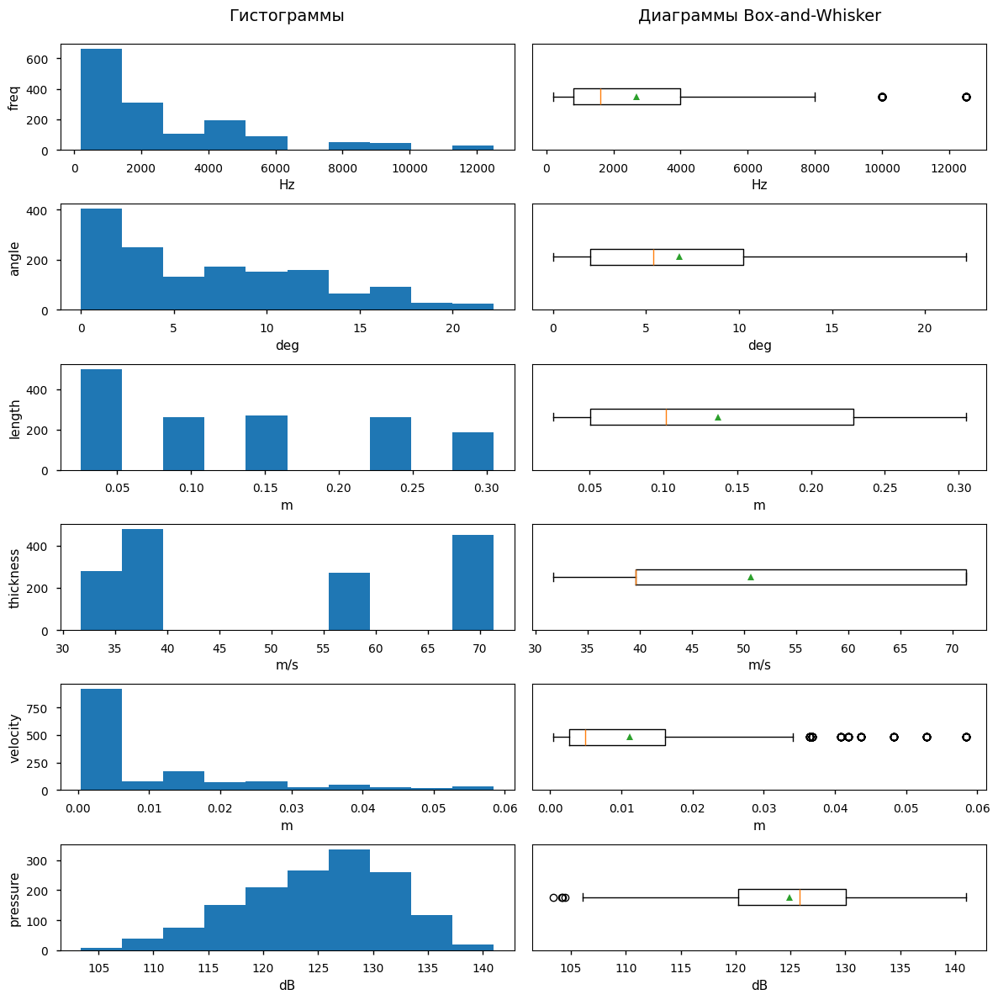

In [56]:
fig, axes = plt.subplots(ncols=2, nrows=len(df.columns), figsize=(12, 12))

axes[0, 0].set_title("Гистограммы", fontsize=14, pad=20)
axes[0, 1].set_title("Диаграммы Box-and-Whisker", fontsize=14, pad=20)

for i, column in enumerate(df.columns):
    axes[i, 0].hist(df[column])
    axes[i, 0].set_ylabel(column)
    axes[i, 0].set_xlabel(units[i])

    axes[i, 1].boxplot(df[column], vert=False, showmeans=True)
    axes[i, 1].set_xlabel(units[i])
    axes[i, 1].set_yticks([])

plt.tight_layout()
plt.show()

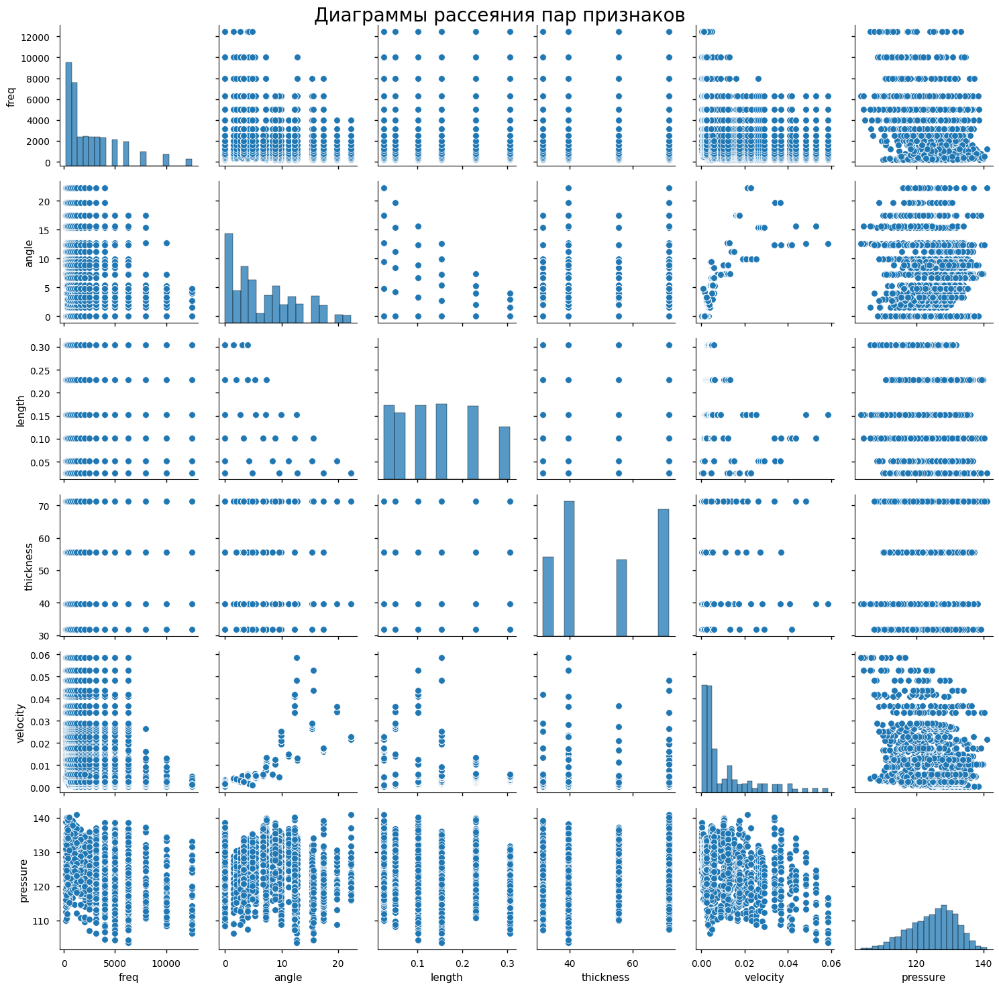

In [57]:
sns.pairplot(df)
plt.suptitle("Диаграммы рассеяния пар признаков", fontsize=20)
plt.tight_layout()
plt.show()

## 2.2. Преобразование данных <a id="22"></a>

In [58]:
x_train, x_test, y_train, y_test = train_test_split(
    X, y, train_size=0.9, random_state=SEED
)
x_train, x_val, y_train, y_val = train_test_split(
    x_train, y_train, train_size=2 / 3, random_state=SEED
)

print(f"Объем выборки: {len(x_train)=}, {len(x_val)=}, {len(x_test)=}, total={len(X)}")

Объем выборки: len(x_train)=888, len(x_val)=444, len(x_test)=148, total=1480


### 2.2.1. Преобразование входов <a id="221"></a>

In [59]:
class Whiter:
    def __init__(self):
        self.fit_flag = False

    def fit(self, X):
        # 1. Центрирование
        self.mean = np.mean(X, axis=0)
        X_centered = X - self.mean

        # 2. Ковариационная матрица
        cov = np.cov(X_centered, rowvar=False)

        # 3. Вычисление матрицы преобразования
        self.W = sqrtm(np.linalg.inv(cov))
        self.fit_flag = True

    def transform(self, X):
        if not self.fit_flag:
            raise Exception("Whitening matrix is not initialized")

        X_centered = X - self.mean

        X_white = X_centered @ self.W

        return X_white

    def fit_transform(self, X):
        self.fit(X)
        X_white = self.transform(X)

        return X_white

    def inverse_transform(self, X_white):
        if not self.fit_flag:
            raise Exception("Whitening matrix is not initialized")
        return (X_white @ np.linalg.inv(self.W)) + self.mean

In [60]:
x_whiter = Whiter()

x_train_prep = x_whiter.fit_transform(x_train)
x_train_prep.columns = X.columns

x_val_prep = x_whiter.transform(x_val)
x_val_prep.columns = X.columns

x_test_prep = x_whiter.transform(x_test)
x_test_prep.columns = X.columns

x_train_prep.head()

,freq,angle,length,thickness,velocity
275,-0.689555,-0.970413,0.571129,-0.666567,-0.190730
902,-0.911562,1.354281,-0.293495,-0.705993,0.339402
1184,-0.799646,1.745950,-0.333914,-0.725725,-1.366911
810,-0.689452,0.089564,-0.991993,0.320696,-0.739916
1270,-0.615304,-1.323148,-1.225729,-0.664235,0.458750


### 2.2.2. Преобразование выходов <a id="222"></a>

In [61]:
y_scaler = RobustScaler()

y_train_prep = pd.DataFrame(
    data=y_scaler.fit_transform(y_train), index=y_train.index, columns=y_train.columns
)
y_val_prep = pd.DataFrame(
    data=y_scaler.transform(y_val), index=y_val.index, columns=y_val.columns
)
y_test_prep = pd.DataFrame(
    data=y_scaler.transform(y_test), index=y_test.index, columns=y_test.columns
)
y_train_prep.head()

,pressure
275,0.282287
902,-0.453637
1184,-0.886730
810,0.234098
1270,0.459217


### 2.2.3. Визуальный анализ преобразованных данных <a id="223"></a>

In [62]:
X_prep = pd.concat([x_train_prep, x_val_prep, x_test_prep]).sort_index()
X_prep.head()

,freq,angle,length,thickness,velocity
0,-0.690883,-1.466687,1.236593,1.368125,0.055319
1,-0.616412,-1.445538,1.248940,1.361051,0.054437
2,-0.523324,-1.419102,1.264374,1.352209,0.053334
3,-0.393000,-1.382092,1.285983,1.339830,0.051791
4,-0.244058,-1.339795,1.310678,1.325683,0.050027


In [63]:
y_prep = pd.concat([y_train_prep, y_val_prep, y_test_prep]).sort_index()
y_prep.head()

,pressure
0,-0.005428
1,-0.106878
2,-0.030790
3,0.135589
4,0.122400


In [64]:
df_prep = pd.concat([X_prep, y_prep], axis=1)
df_prep.head()

,freq,angle,length,thickness,velocity,pressure
0,-0.690883,-1.466687,1.236593,1.368125,0.055319,-0.005428
1,-0.616412,-1.445538,1.248940,1.361051,0.054437,-0.106878
2,-0.523324,-1.419102,1.264374,1.352209,0.053334,-0.030790
3,-0.393000,-1.382092,1.285983,1.339830,0.051791,0.135589
4,-0.244058,-1.339795,1.310678,1.325683,0.050027,0.122400


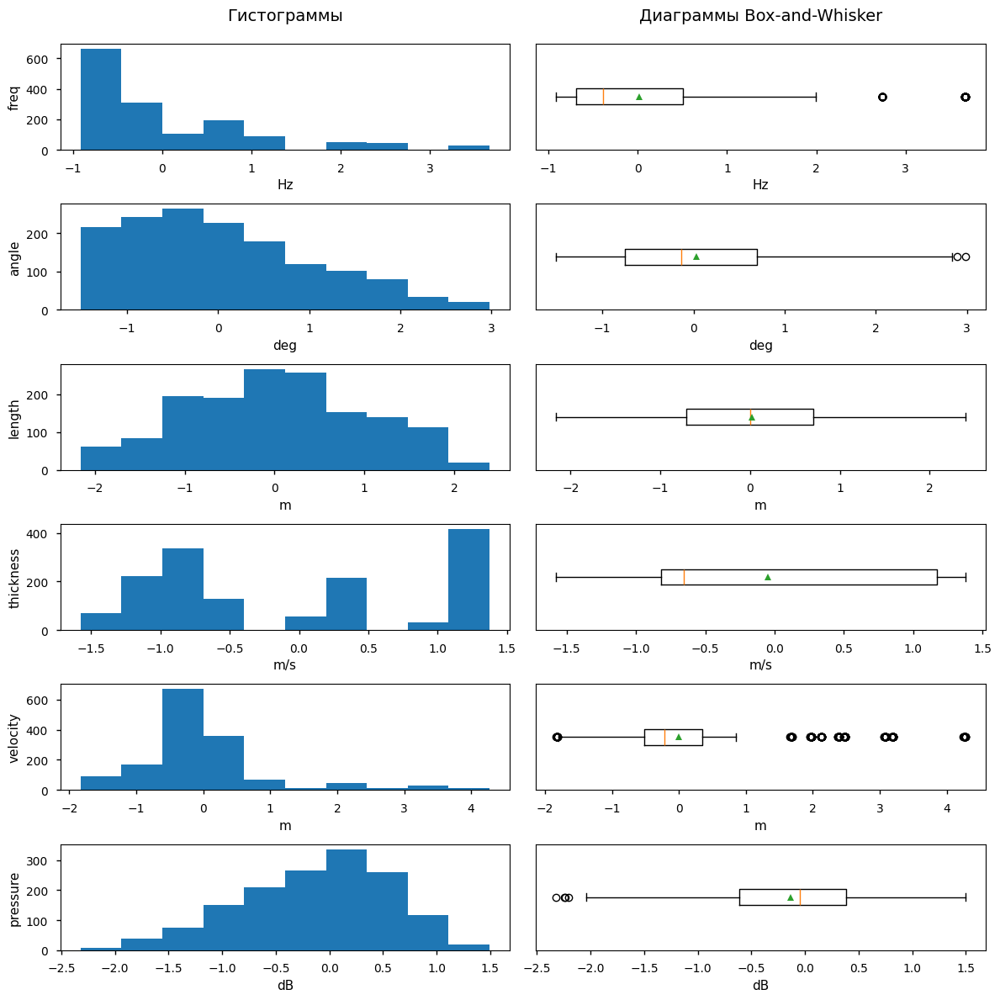

In [65]:
fig, axes = plt.subplots(ncols=2, nrows=len(df.columns), figsize=(12, 12))

axes[0, 0].set_title("Гистограммы", fontsize=14, pad=20)
axes[0, 1].set_title("Диаграммы Box-and-Whisker", fontsize=14, pad=20)

for i, column in enumerate(df.columns):
    axes[i, 0].hist(df_prep[column])
    axes[i, 0].set_ylabel(column)
    axes[i, 0].set_xlabel(units[i])

    axes[i, 1].boxplot(df_prep[column], vert=False, showmeans=True)
    axes[i, 1].set_xlabel(units[i])
    axes[i, 1].set_yticks([])

plt.tight_layout()
plt.show()

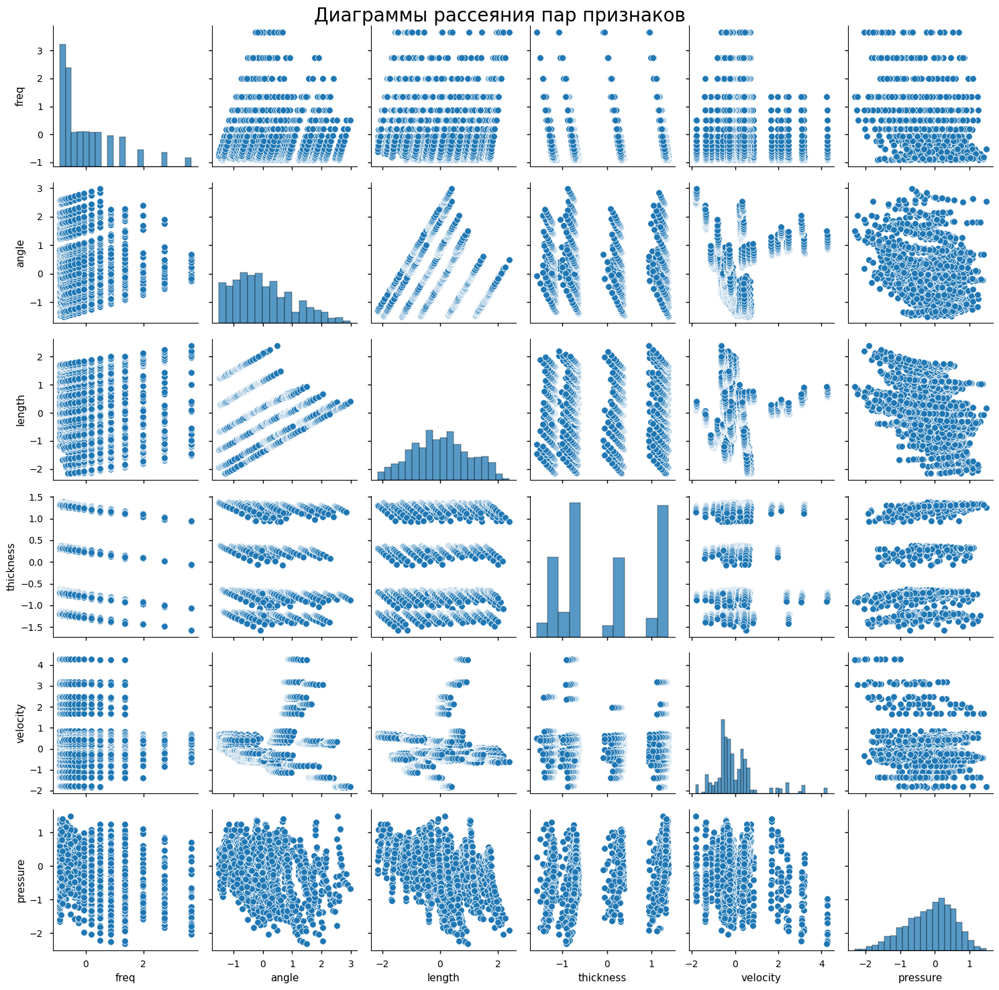

In [66]:
sns.pairplot(df_prep)
plt.suptitle("Диаграммы рассеяния пар признаков", fontsize=20)
plt.tight_layout()
plt.show()

# 3. Формирование признаков <a id="3"></a>

## 3.1. Сокращение числа признаков <a id="31"></a>

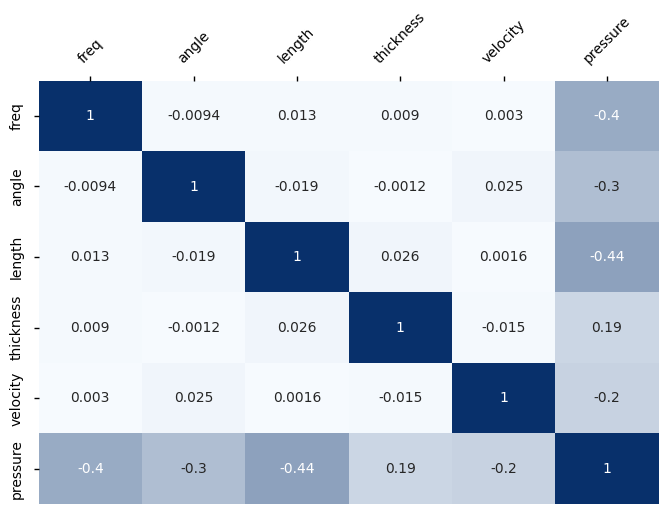

In [67]:
# после Whitening признаки стали некоррелированы
ax = sns.heatmap(
    df_prep.corr(), cbar=False, annot=True, cmap=custom_diverging_blues, vmin=-1, vmax=1
)
ax.xaxis.tick_top()
ax.xaxis.set_tick_params(rotation=45)
plt.show()

In [68]:
print(
    SelectKBest(score_func=f_regression, k="all")
    .fit(x_train_prep.values, y_train_prep.values.reshape(-1))
    .scores_
)

[171.24312515  89.87515101 218.39887955  36.05177218  26.60016882]


In [69]:
print(
    RFE(estimator=LinearRegression(), n_features_to_select=3)
    .fit(x_train_prep, y_train_prep)
    .support_
)

[ True  True  True False False]


In [70]:
print(Lasso(alpha=0.01).fit(x_train_prep, y_train_prep).coef_)

[-0.27157224 -0.20231843 -0.30112475  0.128337   -0.10943978]


In [71]:
print(
    RandomForestRegressor()
    .fit(x_train_prep, y_train_prep.values.reshape(-1))
    .feature_importances_
)

[0.38427692 0.11801555 0.33637926 0.07470866 0.08661961]


## 3.2. Конструирование новых признаков <a id="32"></a>

In [72]:
# полиномы 2-ой степени из исходных признаков
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
X_new_features = pd.DataFrame(
    poly.fit_transform(x_train_prep),
    index=x_train_prep.index,
    columns=poly.get_feature_names_out(X.columns),
)

# логарифмы признаков с ассиметрией
log_features = []
for col in X.columns:
    s = skew(x_train_prep[col])
    if (
        abs(s) > 1 and (x_train_prep[col] > 0).all()
    ):  # логарифм только от положительных значений
        X_new_features[f"log_{col}"] = np.log(x_train_prep[col])
        log_features.append(f"log_{col}")

X_new_features

,freq,angle,length,thickness,velocity,freq^2,freq angle,freq length,freq thickness,freq velocity,angle^2,angle length,angle thickness,angle velocity,length^2,length thickness,length velocity,thickness^2,thickness velocity,velocity^2
275,-0.689555,-0.970413,0.571129,-0.666567,-0.190730,0.475487,0.669154,-0.393825,0.459635,0.131519,0.941702,-0.554232,0.646845,0.185087,0.326189,-0.380696,-0.108932,0.444312,0.127134,0.036378
902,-0.911562,1.354281,-0.293495,-0.705993,0.339402,0.830946,-1.234512,0.267539,0.643557,-0.309386,1.834078,-0.397475,-0.956113,0.459646,0.086140,0.207206,-0.099613,0.498426,-0.239616,0.115194
1184,-0.799646,1.745950,-0.333914,-0.725725,-1.366911,0.639434,-1.396142,0.267013,0.580323,1.093045,3.048342,-0.582998,-1.267080,-2.386559,0.111499,0.242330,0.456431,0.526677,0.992002,1.868447
810,-0.689452,0.089564,-0.991993,0.320696,-0.739916,0.475344,-0.061750,0.683931,-0.221105,0.510136,0.008022,-0.088847,0.028723,-0.066270,0.984050,-0.318128,0.733991,0.102846,-0.237288,0.547475
1270,-0.615304,-1.323148,-1.225729,-0.664235,0.458750,0.378599,0.814138,0.754196,0.408706,-0.282271,1.750720,1.621821,0.878881,-0.606994,1.502412,0.814172,-0.562304,0.441208,-0.304718,0.210452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1418,-0.391712,0.803648,-0.004142,1.284290,1.681702,0.153438,-0.314798,0.001623,-0.503072,-0.658743,0.645850,-0.003329,1.032117,1.351496,0.000017,-0.005320,-0.006966,1.649401,2.159794,2.828123
1229,-0.799138,2.609212,0.179876,-0.747608,-1.781644,0.638622,-2.085121,-0.143746,0.597442,1.423780,6.807986,0.469335,-1.950667,-4.648686,0.032355,-0.134477,-0.320475,0.558917,1.331971,3.174255
191,-0.057886,-1.295268,0.386992,1.308168,0.245116,0.003351,0.074977,-0.022401,-0.075724,-0.014189,1.677720,-0.501259,-1.694429,-0.317490,0.149763,0.506251,0.094858,1.711305,0.320653,0.060082
1093,0.186258,0.606158,-1.004420,-0.783451,-1.103015,0.034692,0.112902,-0.187081,-0.145924,-0.205445,0.367427,-0.608837,-0.474895,-0.668601,1.008860,0.786914,1.107891,0.613796,0.864159,1.216643


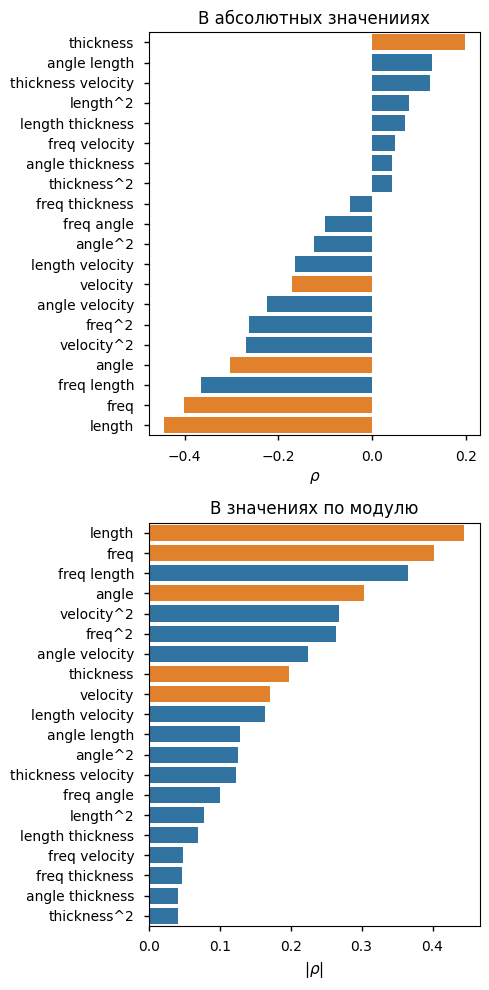

In [73]:
# корреляции с целевой переменной
correlations = X_new_features.corrwith(y_train_prep.iloc[:, 0])

cmap = mpl.colormaps["tab10"].colors
colors = [
    cmap[1] if idx in X.columns else cmap[0]
    for idx in correlations.sort_values(ascending=False).index
]
colors_abs = [
    cmap[1] if idx in X.columns else cmap[0]
    for idx in correlations.apply(abs).sort_values(ascending=False).index
]

plt.figure(figsize=(5, 10))
ax = plt.subplot(211)
ax.set_title("В абсолютных значенииях")
sns.barplot(
    x=correlations.sort_values(ascending=False),
    y=correlations.sort_values(ascending=False).index,
    hue=correlations.sort_values(ascending=False).index,
    legend=False,
    orient="h",
    palette=colors,
)
plt.xlabel(r"$\rho$")
plt.ylabel("")

ax = plt.subplot(212)
ax.set_title("В значениях по модулю")
sns.barplot(
    x=correlations.apply(abs).sort_values(ascending=False),
    y=correlations.apply(abs).sort_values(ascending=False).index,
    hue=correlations.sort_values(ascending=False).index,
    legend=False,
    orient="h",
    palette=colors_abs,
)
plt.xlabel(r"$|\rho|$")
plt.ylabel("")
plt.tight_layout()
plt.show()

In [74]:
# r^2 оценка влияния признака на целевую переменную
base_model = LinearRegression()
base_model.fit(x_train_prep, y_train_prep)
base_r2 = r2_score(y_train_prep, base_model.predict(x_train_prep))

selected_features = []
improved_r2 = []
dif_r2 = []

r2_df = pd.DataFrame(index=X_new_features.columns[5:])

for col in X_new_features.columns[5:]:
    X_tmp = pd.concat([x_train_prep, X_new_features[col]], axis=1)
    model = LinearRegression().fit(X_tmp, y_train_prep)
    r2_df.loc[col, "r2"] = r2_score(y_train_prep, model.predict(X_tmp))

r2_df.loc["base_r2", "r2"] = base_r2
r2_df["dif_r2"] = r2_df["r2"] - base_r2
r2_df

,r2,dif_r2
freq^2,0.531024,1.095508e-02
freq angle,0.535093,1.502415e-02
freq length,0.592588,7.251902e-02
freq thickness,0.521245,1.175791e-03
freq velocity,0.521840,1.771193e-03
angle^2,0.526713,6.643968e-03
angle length,0.534101,1.403172e-02
angle thickness,0.520771,7.016030e-04
angle velocity,0.520219,1.494165e-04
length^2,0.520069,1.916873e-07


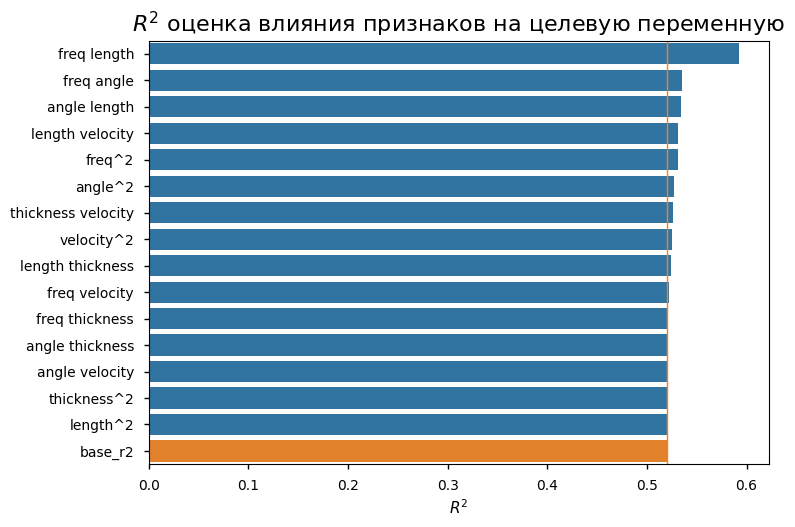

In [75]:
highlight = "base_r2"
cmap = mpl.colormaps["tab10"].colors
colors = [
    cmap[1] if idx == highlight else cmap[0]
    for idx in r2_df["r2"].sort_values(ascending=False).index
]
sns.barplot(
    x=r2_df["r2"].sort_values(ascending=False),
    y=r2_df["r2"].sort_values(ascending=False).index,
    hue=r2_df["r2"].sort_values(ascending=False).index,
    legend=False,
    palette=colors,
    orient="h",
)
plt.axvline(x=r2_df.loc["base_r2", "r2"], color=cmap[1], linewidth=1)
plt.title("$R^2$ оценка влияния признаков на целевую переменную", fontsize=16)
plt.ylabel("")
plt.xlabel("$R^2$")
plt.show()

In [76]:
# добавление нового признака в выборку
x_train_new = x_train_prep.copy()
x_train_new["freq length"] = x_train_prep["freq"] * x_train_prep["length"]

x_val_new = x_val_prep.copy()
x_val_new["freq length"] = x_val_prep["freq"] * x_val_prep["length"]

x_test_new = x_test_prep.copy()
x_test_new["freq length"] = x_test_prep["freq"] * x_test_prep["length"]

x_train_new

,freq,angle,length,thickness,velocity,freq length
275,-0.689555,-0.970413,0.571129,-0.666567,-0.190730,-0.393825
902,-0.911562,1.354281,-0.293495,-0.705993,0.339402,0.267539
1184,-0.799646,1.745950,-0.333914,-0.725725,-1.366911,0.267013
810,-0.689452,0.089564,-0.991993,0.320696,-0.739916,0.683931
1270,-0.615304,-1.323148,-1.225729,-0.664235,0.458750,0.754196
...,...,...,...,...,...,...
1418,-0.391712,0.803648,-0.004142,1.284290,1.681702,0.001623
1229,-0.799138,2.609212,0.179876,-0.747608,-1.781644,-0.143746
191,-0.057886,-1.295268,0.386992,1.308168,0.245116,-0.022401
1093,0.186258,0.606158,-1.004420,-0.783451,-1.103015,-0.187081


# 4. Построение и исследование нейросетевых моделей <a id="4"></a>

## 4.1. Параметры архитектуры и обучения многослойной нейронной сети <a id="41"></a>

### Архитектура

In [77]:
n_neurons1 = 15
act1 = F.tanh
n_neurons2 = 10
act2 = F.tanh
n_neurons3 = 5
act3 = F.tanh

In [78]:
class EarlyStopping:
    def __init__(self, patience=10):
        self.stopping_flag = False
        self.patience = patience
        self.best_loss = float("inf")
        self.trigger_times = 0

    def __call__(self, current_loss):
        # ошибка уменьшилась - сбрасываем счетчик
        if current_loss < self.best_loss:
            self.best_loss = current_loss
            self.trigger_times = 0
            return 0

        # ошибка как минимум на том же уровне - увеличиваем счетчик и, если patience превышен, совершаем останов
        else:
            self.trigger_times += 1
            if self.trigger_times <= self.patience:
                return 1
            else:
                self.stopping_flag = True
                return 2

In [79]:
class Neural_Network(nn.Module):
    def __init__(self):
        super().__init__()

        self.fc1 = nn.Linear(x_train_new.shape[1], n_neurons1)
        torch.nn.init.xavier_normal_(self.fc1.weight)
        nn.init.normal_(self.fc1.bias, mean=0.0, std=0.1)
        self.act1 = act1

        self.fc2 = nn.Linear(n_neurons1, n_neurons2)
        torch.nn.init.xavier_normal_(self.fc2.weight)
        nn.init.normal_(self.fc2.bias, mean=0.0, std=0.1)
        self.act2 = act2

        self.fc3 = nn.Linear(n_neurons2, n_neurons3)
        torch.nn.init.xavier_normal_(self.fc3.weight)
        nn.init.normal_(self.fc3.bias, mean=0.0, std=0.1)
        self.act3 = act3

        self.fc4 = nn.Linear(n_neurons3, y_train_prep.shape[1])
        torch.nn.init.xavier_normal_(self.fc4.weight)
        nn.init.normal_(self.fc4.bias, mean=0.0, std=0.1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.act3(x)
        x = self.fc4(x)
        return x

    def _train_one_epoch(self, train_loader, criterion, optimizer):
        accum_loss = 0
        self.train()
        for x_batch, y_batch in train_loader:

            def closure():
                optimizer.zero_grad()
                y_pred = self(x_batch)
                loss = criterion(y_pred, y_batch)
                loss.backward()
                return loss

            loss = optimizer.step(closure)
            if not torch.isfinite(loss):
                raise ValueError("Loss is not finite")
            accum_loss += len(x_batch) * loss.item()

        epoch_loss = accum_loss / len(train_loader.dataset)

        return epoch_loss

    def _evaluate(self, data_loader, criterion):
        accum_loss = 0
        self.eval()
        with torch.no_grad():
            for x_batch, y_batch in data_loader:
                y_pred = self(x_batch)
                loss = criterion(y_pred, y_batch)
                accum_loss += len(x_batch) * loss.item()

        total_loss = accum_loss / len(data_loader.dataset)

        return total_loss

    def fit(
        self,
        train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer,
        max_epochs=1000,
        patience=50,
    ):
        stopping = EarlyStopping(patience=patience)
        history_rows = []

        # записываем начальные параметры модели
        best_model = {
            name: param.clone().detach()  # клонируем и отключаем граф вычислений
            for name, param in model.state_dict().items()
        }

        for epoch in (
            p_bar := tqdm(range(1, max_epochs + 1), desc="Обучение", unit="эпоха")
        ):
            # записываем различные потери по ходу обучения
            train_loss = self._train_one_epoch(train_loader, criterion, optimizer)
            val_loss = self._evaluate(val_loader, criterion)
            test_loss = self._evaluate(test_loader, criterion)

            epoch_dict = {
                r"$\tau$": epoch,
                r"$E_{train}(\tau)$": train_loss,
                r"$E_{val}(\tau)$": val_loss,
                r"$E_{test}(\tau)$": test_loss,
            }
            history_rows.append(epoch_dict)
            p_bar.set_postfix(
                {"E_tr": round(train_loss, 4), "E_val": round(val_loss, 4)}
            )

            stopping_signal = stopping(val_loss)
            if stopping_signal == 2:
                print(f"Early stopping at epoch {epoch}")
                break
            elif stopping_signal == 0:
                best_model = {
                    name: param.clone().detach()  # клонируем и отключаем граф вычислений
                    for name, param in model.state_dict().items()
                }

        # восстанавливаем лучшие параметры у модели
        model.load_state_dict(best_model)

        # откатываем оценки в момент, когда параметры модели были лучшими

        history_rows = history_rows[
            : -stopping.trigger_times if stopping.trigger_times else None
        ]

        result = pd.DataFrame(history_rows).set_index(r"$\tau$")

        return result

In [80]:
dict_arch = {
    "Функция потерь": torch.nn.MSELoss(),
    "Число входов сети": x_train_new.shape[1],
    "Число выходов сети": y_train.shape[1],
    "Число скрытых слоев сети": 3,
    "Число нейронов 1-го скрытого слоя": n_neurons1,
    "Активационная характеристика нейронов 1-го скрытого слоя": torch.nn.Tanh(),
    "Число нейронов 2-го скрытого слоя": n_neurons2,
    "Активационная характеристика нейронов 2-го скрытого слоя": torch.nn.Tanh(),
    "Число нейронов 3-го скрытого слоя": n_neurons3,
    "Активационная характеристика нейронов 3-го скрытого слоя": torch.nn.Tanh(),
    "Активационная характеристика нейронов выходного слоя": "Linear",
    "Кросс-валидация": "Holdout(60/30/10)",
    "Объемы обучающей/валидационной/тестовой выборок": f"{len(y_train)}/{len(y_val)}/{len(y_test)}",
    "Режим обучения": "Stochastic",
    "Метод инициализации весов": "Havier Normal",
    "Критерий останова": "По числу эпох",
    "Ранний останов": "Да",
}
architecture = pd.DataFrame(
    dict_arch,
    index=["Значение"],
    columns=pd.Index(data=dict_arch.keys(), name="Параметр"),
).T
Markdown(architecture.to_markdown())

| Параметр                                                 | Значение          |
|:---------------------------------------------------------|:------------------|
| Функция потерь                                           | MSELoss()         |
| Число входов сети                                        | 6                 |
| Число выходов сети                                       | 1                 |
| Число скрытых слоев сети                                 | 3                 |
| Число нейронов 1-го скрытого слоя                        | 15                |
| Активационная характеристика нейронов 1-го скрытого слоя | Tanh()            |
| Число нейронов 2-го скрытого слоя                        | 10                |
| Активационная характеристика нейронов 2-го скрытого слоя | Tanh()            |
| Число нейронов 3-го скрытого слоя                        | 5                 |
| Активационная характеристика нейронов 3-го скрытого слоя | Tanh()            |
| Активационная характеристика нейронов выходного слоя     | Linear            |
| Кросс-валидация                                          | Holdout(60/30/10) |
| Объемы обучающей/валидационной/тестовой выборок          | 888/444/148       |
| Режим обучения                                           | Stochastic        |
| Метод инициализации весов                                | Havier Normal     |
| Критерий останова                                        | По числу эпох     |
| Ранний останов                                           | Да                |

### Даталоадеры

In [81]:
x_train_tensor = torch.FloatTensor(x_train_new.values)
x_val_tensor = torch.FloatTensor(x_val_new.values)
x_test_tensor = torch.FloatTensor(x_test_new.values)
y_train_tensor = torch.FloatTensor(y_train_prep.values)
y_val_tensor = torch.FloatTensor(y_val_prep.values)
y_test_tensor = torch.FloatTensor(y_test_prep.values)

train_dataset = torch.utils.data.TensorDataset(x_train_tensor, y_train_tensor)
val_dataset = torch.utils.data.TensorDataset(x_val_tensor, y_val_tensor)
test_dataset = torch.utils.data.TensorDataset(x_test_tensor, y_test_tensor)

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=g,
)
val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=len(val_dataset), worker_init_fn=seed_worker, generator=g
)
test_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=len(test_dataset), worker_init_fn=seed_worker, generator=g
)

### Объект нейронной сети и целевая функция

In [82]:
model = Neural_Network()
init_parameters = {
    name: param.clone().detach()  # клонируем и отключаем граф вычислений
    for name, param in model.state_dict().items()
}
criterion = nn.MSELoss()

## 4.2. Исследование простого градиентного метода обучения <a id="42"></a>

In [83]:
lrs = [1e-1, 5e-2, 1e-2, 5e-3, 1e-3]
result_list_gd = []
for lr in lrs:
    model.load_state_dict(init_parameters)
    optimizer_sgd = optim.SGD(params=model.parameters(), lr=lr)
    result = model.fit(
        train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer_sgd,
        max_epochs=10000,
        patience=100,
    )
    result_list_gd.append((lr, result))

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 358


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 357


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 473


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 319


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 872


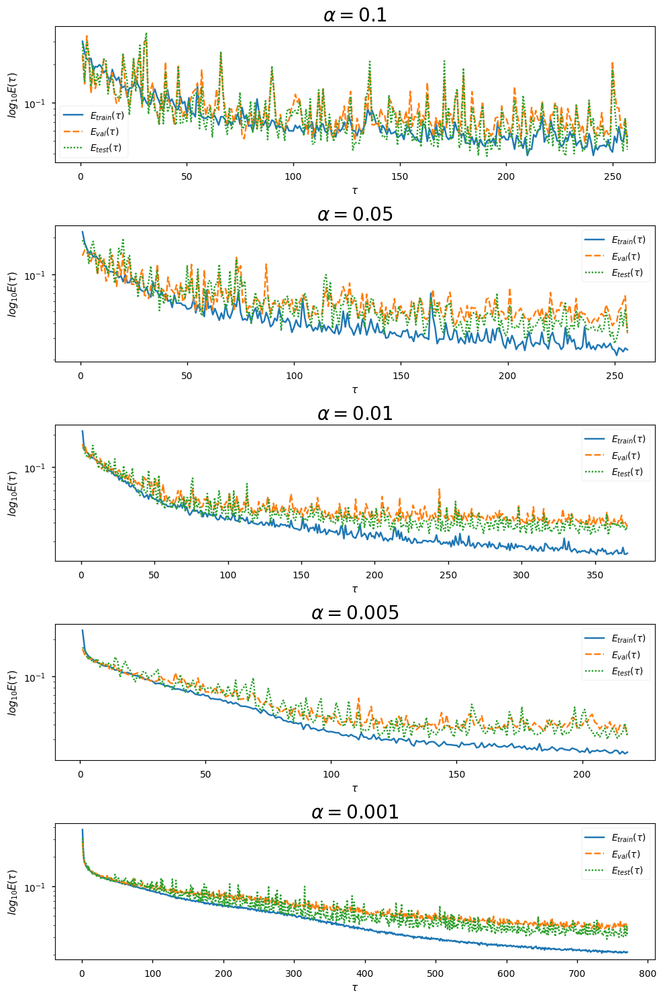

In [84]:
plt.figure(figsize=(10, 15))
for i, (lr, result) in enumerate(result_list_gd, start=1):
    ax = plt.subplot(5, 1, i)
    ax.set_title(f"$\\alpha={lr}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$log_{10} E(\tau)$")
plt.tight_layout()
plt.show()

In [85]:
table_gd = pd.DataFrame(
    index=pd.Index(data=range(1, len(result_list_gd) + 1), name="№ п/п")
)
for i, (lr, result) in enumerate(result_list_gd, start=1):
    table_gd.loc[i, r"Метод"] = "GD"
    table_gd.loc[i, r"Скорость обучения $\alpha$"] = lr
    table_gd.loc[i, r"Число эпох обучения"] = result.index[-1]
    table_gd.loc[i, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
        result[r"$E_{train}(\tau)$"].iloc[-1], 3
    )
    table_gd.loc[i, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
        result[r"$E_{test}(\tau)$"].iloc[-1], 3
    )
Markdown(table_gd.to_markdown())

|   № п/п | Метод   |   Скорость обучения $\alpha$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|-----------------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | GD      |                        0.1   |                   257 |                                            0.054 |                                           0.043 |
|       2 | GD      |                        0.05  |                   256 |                                            0.024 |                                           0.034 |
|       3 | GD      |                        0.01  |                   372 |                                            0.016 |                                           0.028 |
|       4 | GD      |                        0.005 |                   218 |                                            0.024 |                                           0.032 |
|       5 | GD      |                        0.001 |                   771 |                                            0.021 |                                           0.031 |

## 4.3. Исследование методов GDM и NAG <a id="43"></a>

In [86]:
lr = table_gd.sort_values(by=table_gd.columns[-1]).iloc[
    0, 1
]  # берем лучший learning rate из предыдущего эксперимента
print(f"Best lr = {lr.item()}")
momentums = [0.2, 0.4, 0.6, 0.8]

result_list_gdm = []
for momentum in momentums:
    model.load_state_dict(init_parameters)
    optimizer_gdm = optim.SGD(params=model.parameters(), lr=lr, momentum=momentum)
    result = model.fit(
        train_loader,
        test_loader,
        val_loader,
        criterion,
        optimizer_gdm,
        10000,
        100,
    )
    result_list_gdm.append((momentum, result))

result_list_nag = []
for momentum in momentums:
    model.load_state_dict(init_parameters)
    optimizer_nag = optim.SGD(
        params=model.parameters(), lr=lr, momentum=momentum, nesterov=True
    )
    result = model.fit(
        train_loader,
        test_loader,
        val_loader,
        criterion,
        optimizer_nag,
        10000,
        100,
    )
    result_list_nag.append((momentum, result))

Best lr = 0.01


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 257


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 566


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 461


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 275


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 493


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 700


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 292


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 434


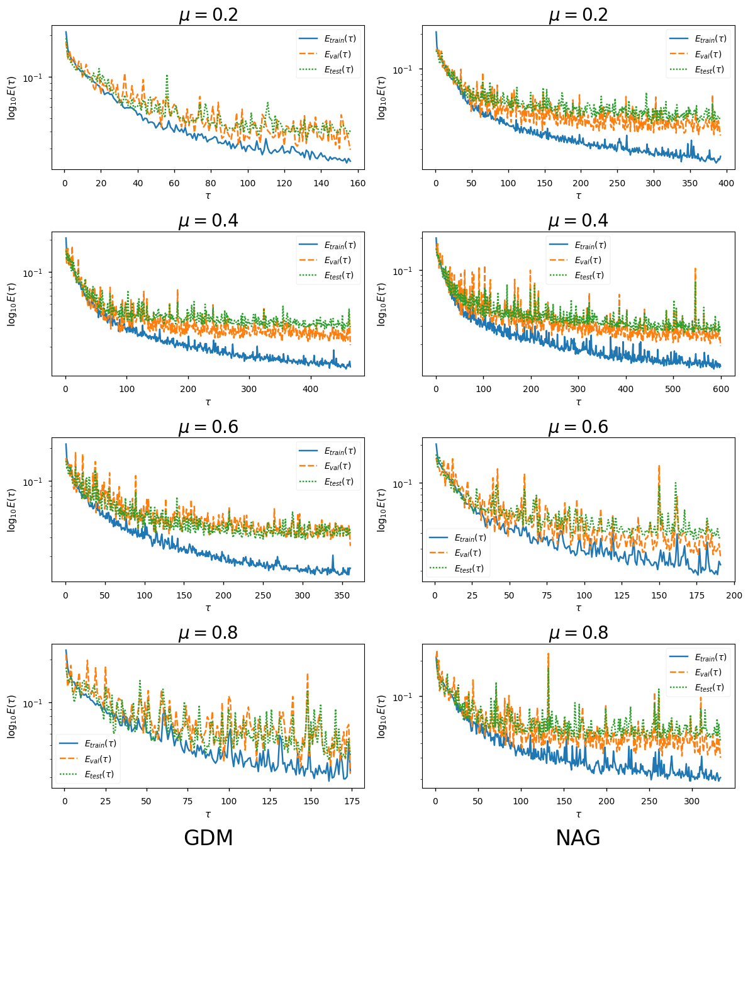

In [87]:
plt.figure(figsize=(12, 16))

for i, (momentum, result) in enumerate(result_list_gdm):
    ax = plt.subplot(5, 2, 2 * i + 1)
    ax.set_title(f"$\\mu={momentum}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$\log_{10}E(\tau)$")

for i, (momentum, result) in enumerate(result_list_nag):
    ax = plt.subplot(5, 2, 2 * i + 2)
    ax.set_title(f"$\\mu={momentum}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$\log_{10}E(\tau)$")

ax = plt.subplot(5, 2, 9)
ax.set_title("GDM", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

ax = plt.subplot(5, 2, 10)
ax.set_title("NAG", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

plt.tight_layout()
plt.show()

In [88]:
table_gdm_nag = pd.DataFrame(
    index=pd.Index(
        data=range(1, len(result_list_gdm) + len(result_list_nag) + 1), name="№ п/п"
    )
)
for i, (momentum, result) in enumerate(result_list_gdm):
    table_gdm_nag.loc[2 * i + 1, r"Метод"] = "GDM"
    table_gdm_nag.loc[2 * i + 1, r"Момент, $\mu$"] = momentum
    table_gdm_nag.loc[2 * i + 1, r"Число эпох обучения"] = result.index[-1]
    table_gdm_nag.loc[2 * i + 1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
        round(result[r"$E_{train}(\tau)$"].iloc[-1], 3)
    )
    table_gdm_nag.loc[2 * i + 1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
        round(result[r"$E_{test}(\tau)$"].iloc[-1], 3)
    )

for i, (momentum, result) in enumerate(result_list_nag):
    table_gdm_nag.loc[2 * i + 2, r"Метод"] = "NAG"
    table_gdm_nag.loc[2 * i + 2, r"Момент, $\mu$"] = momentum
    table_gdm_nag.loc[2 * i + 2, r"Число эпох обучения"] = result.index[-1]
    table_gdm_nag.loc[2 * i + 2, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
        round(result[r"$E_{train}(\tau)$"].iloc[-1], 3)
    )
    table_gdm_nag.loc[2 * i + 2, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
        round(result[r"$E_{test}(\tau)$"].iloc[-1], 3)
    )
Markdown(table_gdm_nag.to_markdown())

|   № п/п | Метод   |   Момент, $\mu$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | GDM     |             0.2 |                   156 |                                            0.024 |                                           0.041 |
|       2 | NAG     |             0.2 |                   392 |                                            0.017 |                                           0.036 |
|       3 | GDM     |             0.4 |                   465 |                                            0.013 |                                           0.031 |
|       4 | NAG     |             0.4 |                   599 |                                            0.013 |                                           0.027 |
|       5 | GDM     |             0.6 |                   360 |                                            0.016 |                                           0.032 |
|       6 | NAG     |             0.6 |                   191 |                                            0.022 |                                           0.036 |
|       7 | GDM     |             0.8 |                   174 |                                            0.033 |                                           0.042 |
|       8 | NAG     |             0.8 |                   333 |                                            0.02  |                                           0.042 |

## 4.4. Исследование методов наискорейшего спуска и сопряжённых градиентов<a id="44"></a>

Подробнее о написании оптимизатора `SteepestGD` можно почитать [здесь](https://colab.research.google.com/drive/1Cb06fx1gN7gahZjbP-kCVZv7k5zIUYcZ?usp=sharing).

Он примерно на 20% медленнее аналогичного оптимизатора с ручным линейным поиском, однако оказалось, что он точнее оптимизирует целевую функцию, поэтому я использую его.

In [89]:
class SteepestGD(torch.optim.Optimizer):
    def __init__(self, params, alternate_lr=1e-3):
        defaults = dict(alternate_lr=alternate_lr)
        super().__init__(params, defaults)

    @torch.no_grad()
    def get_flatten_numpy_params(self):
        w_list = []
        grad_list = []
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None:
                    continue
                w_list.append(p.data.ravel().detach().clone().numpy())
                grad_list.append(p.grad.ravel().detach().clone().numpy())
        w = np.concatenate(w_list)
        grad = np.concatenate(grad_list)
        return w, grad

    @torch.no_grad()
    def set_params_from_flatten_numpy(self, params):
        idx = 0
        for group in self.param_groups:
            for p in group["params"]:
                size = p.numel()
                update = (
                    torch.tensor(params[idx : idx + size].reshape(p.shape))
                    .requires_grad_(True)
                    .to(p.data)
                )
                p.data.copy_(update)
                idx += size

    def f(self, w):
        self.set_params_from_flatten_numpy(w)
        f = self._closure().item()
        return f

    def grad_f(self, w):
        self.set_params_from_flatten_numpy(w)
        self._closure()
        w, grad = self.get_flatten_numpy_params()
        return grad

    def step(self, closure):
        assert closure is not None
        self._closure = closure
        from scipy.optimize import line_search

        f = closure()
        w, grad = self.get_flatten_numpy_params()
        p = -grad
        alpha, _, _, _, _, _ = line_search(self.f, self.grad_f, w, p, grad)

        if alpha is None:
            w_new = w + self.defaults["alternate_lr"] * p
        else:
            w_new = w + alpha * p

        self.set_params_from_flatten_numpy(w_new)
        return f

В стохастическом режиме он работает непозволительно медленно и плохо оптимизирует, так как частные производные зашумлены.

In [90]:
result_list_steepestgd = []
model.load_state_dict(init_parameters)
optimizer_steepestgd = SteepestGD(params=model.parameters())
result = model.fit(
    train_loader,
    test_loader,
    val_loader,
    criterion,
    optimizer_steepestgd,
    10000,
    100,
)
result_list_steepestgd.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

/var/folders/91/5nd525qn3bj4_rkt88_n02z80000gn/T/ipykernel_58632/3549160394.py:53: LineSearchWarning: The line search algorithm did not converge
  alpha, _, _, _, _, _ = line_search(self.f, self.grad_f, w, p, grad)


Early stopping at epoch 150


Поэтому я решил засунуть в него даталоадер со стабильным `batch_size=64` и добавить такую конфигурацию в сравнение

In [91]:
model.load_state_dict(init_parameters)
optimizer_steepestgd = SteepestGD(params=model.parameters())
result = model.fit(
    torch.utils.data.DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True,
        worker_init_fn=seed_worker,
        generator=g,
    ),
    test_loader,
    val_loader,
    criterion,
    optimizer_steepestgd,
    10000,
    100,
)
result_list_steepestgd.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 400


О создании оптимизатора `ConjugateGD` [здесь](https://colab.research.google.com/drive/1yY7XUx_1Xpm921aoYn-SgIwJrRU5iY70?usp=sharing). Есть готовые решения, например [NCG_optimizer](https://github.com/RyunMi/NCG-Optimizer), но, как мне показалось на тестировании, они работают менее стабильно.

In [92]:
class ConjugateGD(torch.optim.Optimizer):
    def __init__(
        self,
        params,
        method="PR",
        need_reset=True,
        line_search="Wolfe",
        alpha_init=1.0,
        c1=1e-4,
        c2=0.9,
        c=0.35,
        max_ls=100,
        decay_factor=0.5,
        rise_factor=1.2,
        alpha_alternate=1e-3,
    ):
        """
        params (iterable) – iterable of parameters or named_parameters to optimize or iterable of dicts defining parameter groups.
        When using named_parameters, all parameters in all groups should be named

        method (str) - 'FR' (Fletcher-Reeves) or 'PR' (Polak-Ribiere) (default 'PR')

        need_reset (bool) - whether the optimiser should be reset every n iterations, where n is the number of parameters (default 'True')

        line_search (str) - 'Armijo', 'Goldstein' or 'Wolfe' - criterion for linear search algorithm (default 'Wolfe')

        alpha_init (float) - initial step size in line search (default 1.0)

        c1 (float in (0, 1)) - parameter for Armijo condtition (default 1e-4)

        c2 (float in (c1, 1)) - parameter for Wolfe conditions (default 0.9)

        c (float in (0, 0.5)) - parameter for Goldstein conditions (default 0.35)

        max_ls (int) - maximum number of line search iterations (default 100)

        decay_factor (float in (0, 1)) - decay factor for line search (default 0.5)

        rise_factor (float in (1, 2)) - rise factor for line search (default 1.2)

        alpha_alternate (float) - if line search doesnt converge, it will use this value as step size (default 1e-3)
        """
        if method not in ["FR", "PR"]:
            raise ValueError("Method must be 'FR' or 'PR'")

        params = list(params)
        if need_reset:
            reset_interval = 0
            for p in params:
                reset_interval += p.numel()
        else:
            reset_interval = None

        if line_search not in ["Armijo", "Goldstein", "Wolfe"]:
            raise ValueError("Line search must be 'Armijo', 'Goldstein' or 'Wolfe")

        if not 0 < c1 < c2 <= 1:
            raise ValueError("c1 must be in (0, c2], c2 must be in (c1, 1]")

        if not 0 < c < 0.5:
            raise ValueError("c must be in (0, 0.5]")

        if not 0 < decay_factor < 1:
            raise ValueError("decay_factor must be in (0, 1)")

        if not 1 < rise_factor < 2:
            raise ValueError("rise_factor must be in (1, 2)")

        if not 0 < alpha_alternate:
            raise ValueError("alpha_alternate must be positive")

        defaults = dict(
            method=method,
            reset_interval=reset_interval,
            line_search=line_search,
            alpha_init=alpha_init,
            c1=c1,
            c2=c2,
            c=c,
            max_ls=max_ls,
            decay_factor=decay_factor,
            rise_factor=rise_factor,
            alpha_alternate=alpha_alternate,
        )
        super().__init__(params, defaults)

        for group in self.param_groups:
            for wk_i in group["params"]:
                self.state[wk_i]["pk"] = torch.zeros_like(wk_i.data)
                self.state[wk_i]["gfk_prev"] = torch.zeros_like(wk_i.data)
        self.state["step"] = 0

    def _compute_beta(self):
        """
        Computes beta depending on the chosen method.
        """
        if self.state["step"] == 0:
            return 0.0

        method = self.param_groups[0]["method"]
        wk = self.param_groups[0]["params"]
        state = self.state

        gfk_prev_norm = sum([state[wk_i]["gfk_prev"].norm().pow(2) for wk_i in wk])
        if method == "FR":
            beta = (
                sum([wk_i.grad.data.norm().pow(2) for wk_i in wk]) / gfk_prev_norm
            )  # cкалярные произведения без перевода в плоский вектор
        elif method == "PR":
            beta = (
                sum(
                    [
                        (
                            wk_i.grad.data * (wk_i.grad.data - state[wk_i]["gfk_prev"])
                        ).sum_to_size(1)
                        for wk_i in wk
                    ]
                )
                / gfk_prev_norm
            )
            beta = max(0, beta)
        else:
            raise ValueError("Method must be 'FR' or 'PR'")

        return beta

    def _line_search(self, closure, fk):
        """
        Performs line search algorithm depending on the chosen condition.
        """
        group = self.param_groups[0]
        state = self.state
        method = group["line_search"]

        if method == "Armijo":
            c1 = group["c1"]
        elif method == "Goldstein":
            c1 = min(group["c"], 1 - group["c"])
            c2 = max(group["c"], 1 - group["c"])
        elif method == "Wolfe":
            c1 = group["c1"]
            c2 = group["c2"]
        else:
            raise ValueError("Line search must be 'Armijo', 'Goldstein' or 'Wolfe'")

        wk_orig = [
            p.detach().clone() for p in group["params"]
        ]  # клонируем для дальнейшего восстановления
        wk = group["params"]

        alpha, max_ls = group["alpha_init"], group["max_ls"]
        decay_factor, rise_factor = group["decay_factor"], group["rise_factor"]
        alpha_alternate = group["alpha_alternate"]

        gfk = [wk_i.grad.data for wk_i in wk]
        pk = [state[wk_i]["pk"] for wk_i in wk]
        gfpk = sum([(gfk[i] * pk[i]).sum_to_size(1) for i in range(len(wk))])

        for _ in range(max_ls):
            with torch.no_grad():
                for i, wk_i in enumerate(wk):
                    wk_i.data.add_(alpha * pk[i])

            fk_new = closure()

            armijo = fk_new <= fk + c1 * alpha * gfpk

            if armijo:
                if method == "Armijo":
                    goldstein = True
                    wolfe = True
                elif method == "Goldstein":
                    goldstein = fk_new >= fk + c2 * alpha * gfpk
                    wolfe = True
                elif method == "Wolfe":
                    goldstein = True
                    gfpk_new = sum(
                        [
                            (wk[i].grad.data * pk[i]).sum_to_size(1)
                            for i in range(len(wk))
                        ]
                    )
                    wolfe = gfpk_new >= c2 * gfpk
                if goldstein and wolfe:
                    return gfk
                else:
                    alpha *= rise_factor
            else:
                alpha *= decay_factor

            with torch.no_grad():
                for i in range(len(wk)):
                    wk[i].copy_(wk_orig[i])

        with torch.no_grad():
            for i in range(len(wk)):
                wk[i].data.copy_(wk_orig[i] + alpha_alternate * pk[i])

        return gfk

    def step(self, closure):
        """
        Performs a single optimization step.
        """
        fk = closure()
        if not torch.isfinite(fk):
            raise ValueError("Loss is not finite")

        group = self.param_groups[0]
        state = self.state
        wk = group["params"]
        for wk_i in wk:
            if wk_i.grad is None:
                raise RuntimeError("Gradient not computed")

        reset_interval = group["reset_interval"]
        if reset_interval is not None:
            if self.state["step"] % reset_interval == 0:
                self.state["step"] = 0

        beta = self._compute_beta()
        for wk_i in wk:
            state[wk_i]["pk"].mul_(beta).add_(-wk_i.grad.data)

        gfk = self._line_search(closure, fk)
        for i in range(len(wk)):
            state[wk[i]]["gfk_prev"] = gfk[i]
        self.state["step"] += 1

        return fk

Данный алгоритм в стохастическом режиме работает даже хуже `SteepestGD`, потому что он расходится на первой эпохе из-за слишком шумных градиентов.

In [93]:
try:
    model.load_state_dict(init_parameters)
    optimizer_fr = ConjugateGD(
        params=model.parameters(), method="FR", line_search="Armijo"
    )
    result = model.fit(
        train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer_fr,
        10000,
        100,
    )
    print(result)
except Exception as e:
    print(f"Training failed: {e}")

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Training failed: Loss is not finite


Поэтому в общую таблицу пойдет конфигурация с `batch_size = 64`, которая работает отлично, и сходится быстро.

In [94]:
result_list_fr = []
model.load_state_dict(init_parameters)
optimizer_fr = ConjugateGD(
    params=model.parameters(), method="FR", line_search="Wolfe", c1=0.75, c2=0.9
)
result = model.fit(
    torch.utils.data.DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True,
        worker_init_fn=seed_worker,
        generator=g,
    ),
    test_loader,
    val_loader,
    criterion,
    optimizer_fr,
    10000,
    100,
)
result_list_fr.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 229


Ситуация с Polak-Ribiere аналогичная.

In [95]:
try:
    model.load_state_dict(init_parameters)
    optimizer_pr = ConjugateGD(
        params=model.parameters(), method="PR", line_search="Armijo"
    )
    result = model.fit(
        train_loader,
        val_loader,
        test_loader,
        criterion,
        optimizer_pr,
        10000,
        100,
    )
    print(result)
except Exception as e:
    print(f"Training failed: {e}")

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Training failed: Loss is not finite


In [96]:
result_list_pr = []
model.load_state_dict(init_parameters)
optimizer_pr = ConjugateGD(
    params=model.parameters(), method="PR", line_search="Wolfe", c1=0.1, c2=0.5
)
result = model.fit(
    torch.utils.data.DataLoader(
        train_dataset,
        batch_size=64,
        shuffle=True,
        worker_init_fn=seed_worker,
        generator=g,
    ),
    test_loader,
    val_loader,
    criterion,
    optimizer_pr,
    10000,
    100,
)
result_list_pr.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 317


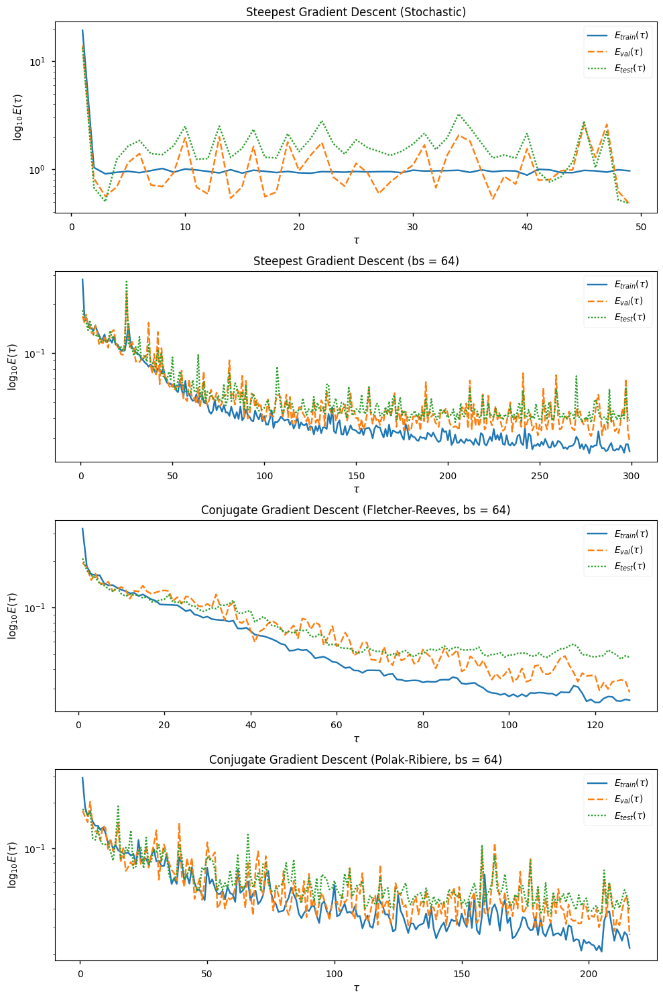

In [97]:
plt.figure(figsize=(10, 15))

plt.subplot(411)
sns.lineplot(result_list_steepestgd[0])
plt.title(label="Steepest Gradient Descent (Stochastic)")
plt.yscale("log")
plt.ylabel(r"$\log_{10} E(\tau)$")

plt.subplot(412)
sns.lineplot(result_list_steepestgd[1])
plt.title(label="Steepest Gradient Descent (bs = 64)")
plt.yscale("log")
plt.ylabel(r"$\log_{10} E(\tau)$")

plt.subplot(413)
sns.lineplot(result_list_fr[0])
plt.title(label="Conjugate Gradient Descent (Fletcher-Reeves, bs = 64)")
plt.yscale("log")
plt.ylabel(r"$\log_{10} E(\tau)$")

plt.subplot(414)
sns.lineplot(result_list_pr[0])
plt.title(label="Conjugate Gradient Descent (Polak-Ribiere, bs = 64)")
plt.yscale("log")
plt.ylabel(r"$\log_{10} E(\tau)$")

plt.tight_layout()
plt.show()

In [98]:
table_steepest_gd_fr_pr = pd.DataFrame(
    index=pd.Index(
        data=range(
            1,
            1 + len(result_list_steepestgd) + len(result_list_fr) + len(result_list_pr),
        ),
        name="№ п/п",
    )
)

table_steepest_gd_fr_pr.loc[1, r"Метод"] = "SGD (Stochastic)"
table_steepest_gd_fr_pr.loc[1, r"Число эпох обучения"] = result_list_steepestgd[
    0
].index[-1]
table_steepest_gd_fr_pr.loc[1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
    round(result_list_steepestgd[0][r"$E_{train}(\tau)$"].iloc[-1], 3)
)
table_steepest_gd_fr_pr.loc[1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
    round(result_list_steepestgd[0][r"$E_{test}(\tau)$"].iloc[-1], 3)
)

table_steepest_gd_fr_pr.loc[2, r"Метод"] = "SGD (bs = 64)"
table_steepest_gd_fr_pr.loc[2, r"Число эпох обучения"] = result_list_steepestgd[
    1
].index[-1]
table_steepest_gd_fr_pr.loc[2, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
    round(result_list_steepestgd[1][r"$E_{train}(\tau)$"].iloc[-1], 3)
)
table_steepest_gd_fr_pr.loc[2, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
    round(result_list_steepestgd[1][r"$E_{test}(\tau)$"].iloc[-1], 3)
)

table_steepest_gd_fr_pr.loc[3, r"Метод"] = "Fletcher-Reeves (bs = 64)"
table_steepest_gd_fr_pr.loc[3, r"Число эпох обучения"] = result_list_fr[0].index[-1]
table_steepest_gd_fr_pr.loc[3, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
    round(result_list_fr[0][r"$E_{train}(\tau)$"].iloc[-1], 3)
)
table_steepest_gd_fr_pr.loc[3, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
    round(result_list_fr[0][r"$E_{test}(\tau)$"].iloc[-1], 3)
)

table_steepest_gd_fr_pr.loc[4, r"Метод"] = "Polak-Ribiere (bs = 64)"
table_steepest_gd_fr_pr.loc[4, r"Число эпох обучения"] = result_list_pr[0].index[-1]
table_steepest_gd_fr_pr.loc[4, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
    round(result_list_pr[0][r"$E_{train}(\tau)$"].iloc[-1], 3)
)
table_steepest_gd_fr_pr.loc[4, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = (
    round(result_list_pr[0][r"$E_{test}(\tau)$"].iloc[-1], 3)
)

Markdown(table_steepest_gd_fr_pr.to_markdown())

|   № п/п | Метод                     |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------------------------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | SGD (Stochastic)          |                    49 |                                            0.967 |                                           0.481 |
|       2 | SGD (bs = 64)             |                   299 |                                            0.025 |                                           0.039 |
|       3 | Fletcher-Reeves (bs = 64) |                   128 |                                            0.025 |                                           0.048 |
|       4 | Polak-Ribiere (bs = 64)   |                   216 |                                            0.022 |                                           0.039 |

## 4.5. Исследование метода AdaGrad<a id="45"></a>

Нас просят построить графики зависимости `learning_rate` во время обучения. Для отдельных синаптических коэффициентов нам бы не пришлось хранить $G_j(\tau)$ для всех $j$ - порядкового номера параметра нейронной сети, но для минимумов, максимумов и средних нужно хранить целый вектор $G$ размерности такой же, как и градиент $\nabla f$.

На каждой итерации $\tau$ внутри стандартного оптимизатора `torch.optim.Adagrad` можно в словаре состояний найти $G(\tau)$, но не в виде одного длинного плоского вектора, а для каждого слоя своя матрица, к чему в `torch` уже привычно. Поэтому для рандомного параметра $w_{ij}^{(p)}$, где $p$ - номер слоя, можно найти $\alpha_{ij}^{(p)}(\tau) = \dfrac{\alpha}{\sqrt{G_{ij}^{(p)}(\tau) + \varepsilon}}$.

Предлагаю сделать обертку для оптимизатора, который будет соххранять `learning_rate` $\alpha_{ij}^{(p)}(\tau)$ для каждого параметра $w_{ij}^{(p)}$ для каждой итерации $\tau$. Таким образом, не нужно будет переписывать функцию `fit()`.

In [99]:
class OptimWithAlphaHistory(ABC):
    def __init__(self, optim_class, batches_per_epoch=1, *args, **kwargs):
        self.optimizer = optim_class(*args, **kwargs)
        self.batches_per_epoch = batches_per_epoch
        self.current_batch = 0
        self.alpha_history = []
        self.epoch_alphas = []

    def step(self, closure=None):
        """Обертка для сохранения alpha для каждого батча и усреднения в конце эпохи."""
        loss = self.optimizer.step(closure)
        self.current_batch += 1

        wk = self.optimizer.param_groups[0]["params"]

        batch_alphas = []
        for wk_i in wk:
            alpha_i = self.compute_alpha(wk_i)
            batch_alphas.append(alpha_i)  # записываем в список для текущего батча

        self.epoch_alphas.append(batch_alphas)

        # Если эпоха завершена, усредняем и сохраняем
        if self.current_batch % self.batches_per_epoch == 0:
            self._end_epoch()

        return loss

    def zero_grad(self):
        """Обертка для обнуления градиентов."""
        self.optimizer.zero_grad()

    def _end_epoch(self):
        """Усредняет alpha по всем батчам эпохи и сохраняет в alpha_history."""
        if not self.epoch_alphas[0]:
            return

        epoch_alpha_params = list(zip(*self.epoch_alphas))
        mean_alpha = [sum(alphas) / len(alphas) for alphas in epoch_alpha_params]

        self.alpha_history.append(mean_alpha)
        self.epoch_alphas = []

    @abstractmethod
    def compute_alpha(self, param):
        """
        Вымышленный метод для вычисления alpha для параметра.
        Должен быть реализован в наследниках.
        """
        pass

In [100]:
class AdaGradWithHistory(OptimWithAlphaHistory):
    def __init__(self, *args, **kwargs):
        super().__init__(optim_class=optim.Adagrad, *args, **kwargs)

    def compute_alpha(self, param):
        return self.optimizer.param_groups[0]["lr"] / (
            torch.sqrt(self.optimizer.state[param]["sum"])
            + self.optimizer.param_groups[0]["eps"]
        )

In [101]:
result_list_adagrad = []
print(f"Best lr = {lr.item()}")
model.load_state_dict(init_parameters)
optimizer_adagrad = AdaGradWithHistory(
    batches_per_epoch=len(train_loader), params=model.parameters(), lr=lr
)
result = model.fit(
    train_loader,
    test_loader,
    val_loader,
    criterion,
    optimizer_adagrad,
    10000,
    100,
)
result_list_adagrad.append(result)

Best lr = 0.01


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 1308


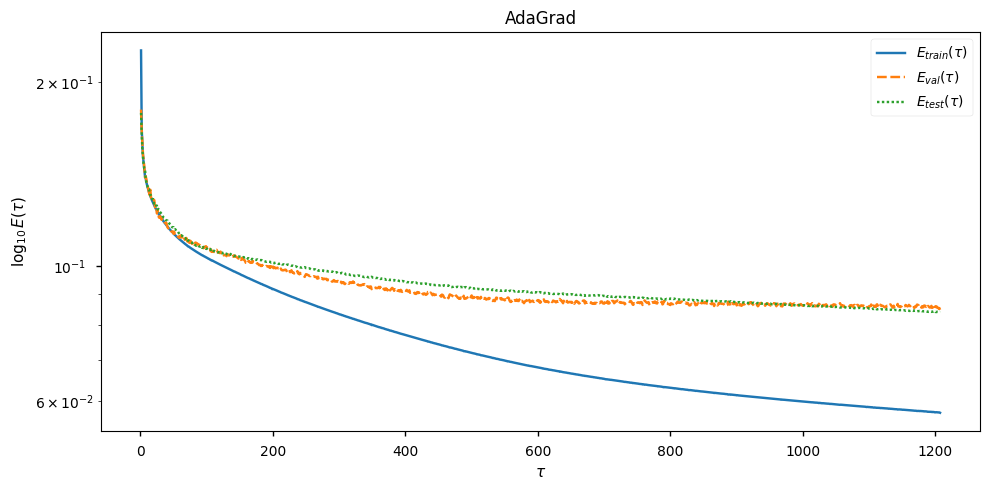

In [104]:
plt.figure(figsize=(10, 5))

sns.lineplot(result_list_adagrad[0])
plt.title(label="AdaGrad")
plt.yscale("log")
plt.ylabel(r"$\log_{10} E(\tau)$")

plt.tight_layout()
plt.show()

In [102]:
def paint_alpha_history(optimizer, p, ij, *args, **kwargs):
    """
    Функция для визуализации истории alpha из обертки оптимизатора
    """
    alpha_history = []
    for alpha_tau in optimizer.alpha_history:
        alphas_with_index = [alpha_tau[i][j].item() for i, j in zip(p, ij)]
        min_alpha = float("inf")
        max_alpha = float("-inf")
        sum_alphas = 0
        count_alphas = 0
        for alpha_tau_i in alpha_tau:
            sum_alphas += alpha_tau_i.sum().item()
            count_alphas += alpha_tau_i.numel()
            min_alpha = min(alpha_tau_i.min().item(), min_alpha)
            max_alpha = max(alpha_tau_i.max().item(), max_alpha)
        mean_alpha = sum_alphas / count_alphas if count_alphas > 0 else 0
        alpha_history.append(alphas_with_index + [mean_alpha, min_alpha, max_alpha])

    alpha_history = pd.DataFrame(
        alpha_history,
        index=pd.Index(data=range(1, len(alpha_history) + 1), name=r"$\tau$"),
    )
    alpha_history.columns = [
        (
            f"$w_{{{j[0] + 1}{j[1] + 1}}}^{{({i // 2 + 1})}}$"
            if type(j) == type(tuple())
            else f"$b_{{{j + 1}}}^{{({i // 2 + 1})}}$"
        )
        for i, j in zip(p, ij)
    ] + [r"$\overline{\alpha}$", r"$\alpha_{min}$", r"$\alpha_{max}$"]

    ax = alpha_history.plot(
        *args,
        title=f"График зависимости скорости обучения от времени обучения",
        logy=True,
        ylabel=r"$\log_{10} \alpha_{ij}^{(p)}(\tau)$",
        **kwargs,
    )

    return ax, alpha_history

От нас требуют построить графики зависимости $\alpha_j(\tau)$ для произвольных $j$. Я возьму $j$ такие, чтобы они соответствовали параметрам $w_{11}^{(1)}, w_{21}^{(2)}, b_1^{(4)}$, где верхний индекс - номер слоя.

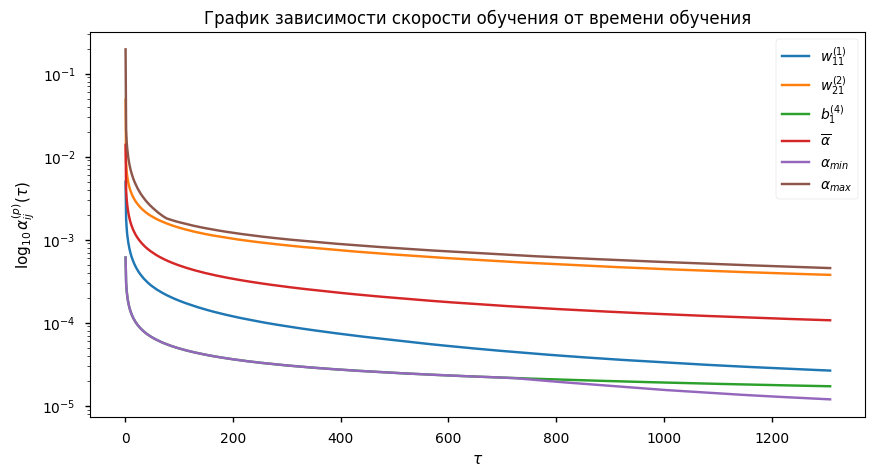

In [103]:
# в индексах
p = [0, 2, 7]
ij = [(0, 0), (1, 0), 0]

ax, alpha_history_adagrad = paint_alpha_history(
    optimizer_adagrad, p, ij, figsize=(10, 5)
)

In [105]:
table_adagrad = pd.DataFrame(
    index=pd.Index(data=range(1, len(result_list_adagrad) + 1), name="№ п/п")
)

table_adagrad.loc[1, r"Метод"] = "AdaGrad"
table_adagrad.loc[1, r"Число эпох обучения"] = result_list_adagrad[0].index[-1]
table_adagrad.loc[1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
    result_list_adagrad[0][r"$E_{train}(\tau)$"].iloc[-1], 3
)
table_adagrad.loc[1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
    result_list_adagrad[0][r"$E_{test}(\tau)$"].iloc[-1], 3
)

Markdown(table_adagrad.to_markdown())

|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | AdaGrad |                  1207 |                                            0.057 |                                           0.084 |

## 4.6. Исследование методов RMSProp и AdaDelta<a id="46"></a>

In [106]:
class RMSPropWithHistory(OptimWithAlphaHistory):
    def __init__(self, *args, **kwargs):
        super().__init__(optim_class=optim.RMSprop, *args, **kwargs)

    def compute_alpha(self, param):
        return self.optimizer.param_groups[0]["lr"] / (
            torch.sqrt(self.optimizer.state[param]["square_avg"])
            + self.optimizer.param_groups[0]["eps"]
        )

In [107]:
class AdaDeltaWithHistory(OptimWithAlphaHistory):
    def __init__(self, *args, **kwargs):
        super().__init__(optim_class=optim.Adadelta, *args, **kwargs)

    def compute_alpha(self, param):
        eps = self.optimizer.param_groups[0]["eps"]
        return (torch.sqrt(self.optimizer.state[param]["acc_delta"]) + eps) / (
            torch.sqrt(self.optimizer.state[param]["square_avg"]) + eps
        )

In [108]:
result_list_rmsprop = []
result_list_adadelta = []
optimizer_history_list_rmsprop = []
optimizer_history_list_adadelta = []
print(f"Best lr = {lr.item()}")

rhos = [0, 0.25, 0.5, 0.75]
for rho in rhos:
    model.load_state_dict(init_parameters)
    optimizer_rmsprop = RMSPropWithHistory(
        batches_per_epoch=len(train_loader),
        params=model.parameters(),
        lr=lr,
        alpha=rho,
    )
    result = model.fit(
        train_loader,
        test_loader,
        val_loader,
        criterion,
        optimizer_rmsprop,
        10000,
        100,
    )
    result_list_rmsprop.append((rho, result))
    optimizer_history_list_rmsprop.append((rho, optimizer_rmsprop))

    model.load_state_dict(init_parameters)
    optimizer_adadelta = AdaDeltaWithHistory(
        batches_per_epoch=len(train_loader),
        params=model.parameters(),
        rho=rho,
    )
    result = model.fit(
        train_loader,
        test_loader,
        val_loader,
        criterion,
        optimizer_adadelta,
        10000,
        100,
    )
    result_list_adadelta.append((rho, result))
    optimizer_history_list_adadelta.append((rho, optimizer_adadelta))

Best lr = 0.01


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 136


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 211


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 340


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 347


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 214


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 358


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 251


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 436


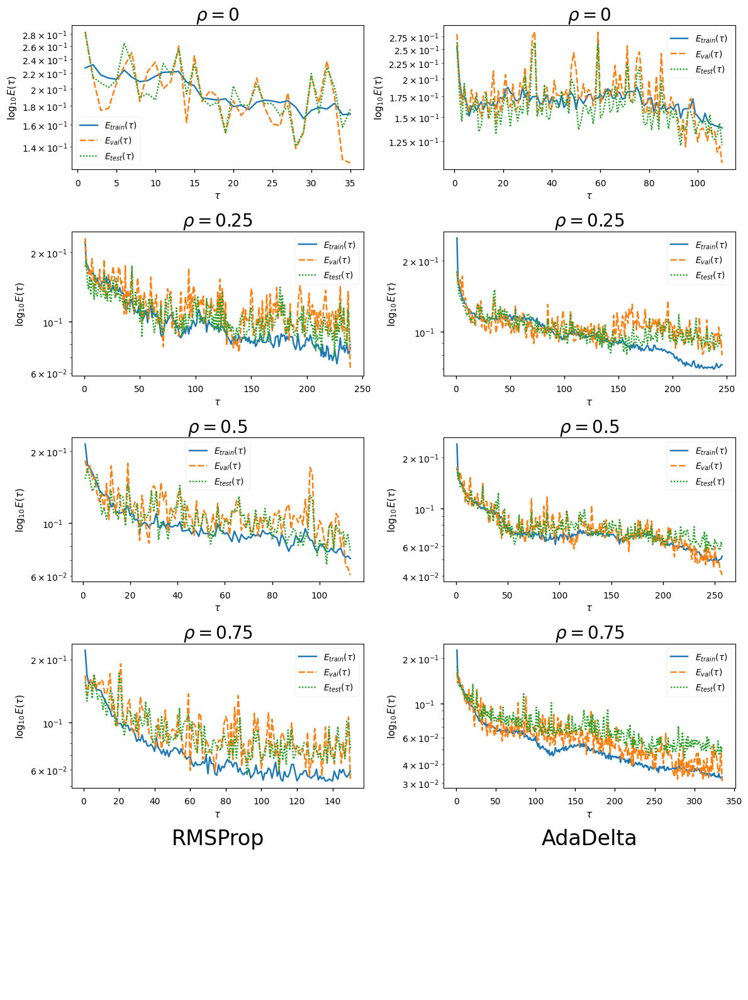

In [110]:
plt.figure(figsize=(12, 16))

for i, (rho, result) in enumerate(result_list_rmsprop):
    ax = plt.subplot(5, 2, 2 * i + 1)
    ax.set_title(f"$\\rho={rho}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$\log_{10}E(\tau)$")

for i, (rho, result) in enumerate(result_list_adadelta):
    ax = plt.subplot(5, 2, 2 * i + 2)
    ax.set_title(f"$\\rho={rho}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$\log_{10}E(\tau)$")

ax = plt.subplot(5, 2, 9)
ax.set_title("RMSProp", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

ax = plt.subplot(5, 2, 10)
ax.set_title("AdaDelta", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

plt.tight_layout()
plt.show()

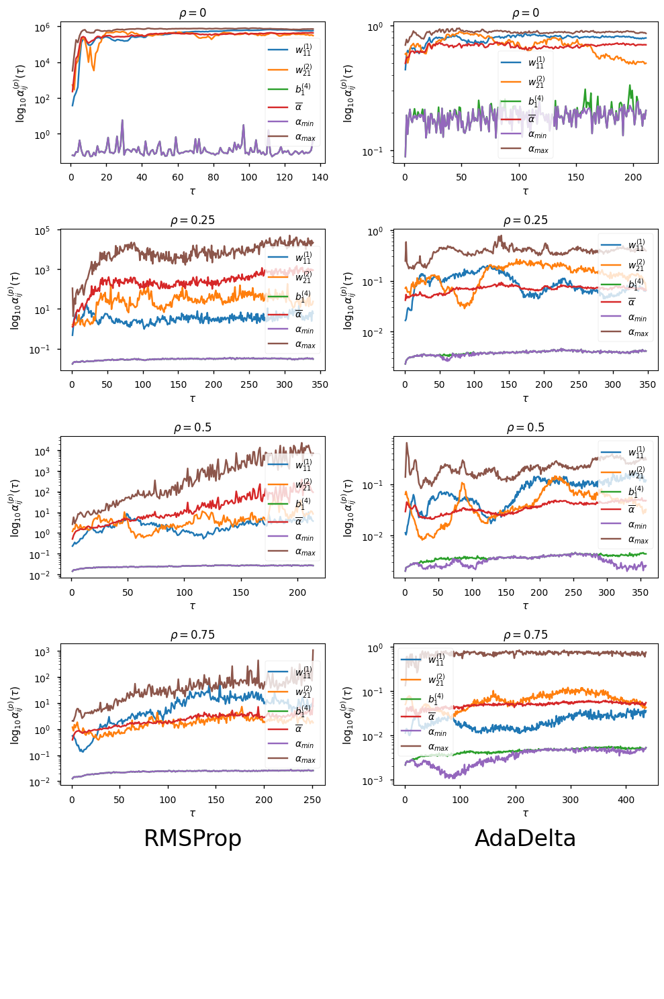

In [109]:
p = [0, 2, 7]
ij = [(0, 0), (1, 0), 0]

plt.figure(figsize=(10, 15))

for i, (rho, optimizer) in enumerate(optimizer_history_list_rmsprop):
    axis = plt.subplot(5, 2, 2 * i + 1)
    ax, alpha_history_rmsprop = paint_alpha_history(optimizer, p, ij, ax=axis)
    ax.set_title(f"$\\rho = {rho}$")

for i, (rho, optimizer) in enumerate(optimizer_history_list_adadelta):
    axis = plt.subplot(5, 2, 2 * i + 2)
    ax, alpha_history_rmsprop = paint_alpha_history(optimizer, p, ij, ax=axis)
    ax.set_title(f"$\\rho = {rho}$")

ax = plt.subplot(5, 2, 9)
ax.set_title("RMSProp", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

ax = plt.subplot(5, 2, 10)
ax.set_title("AdaDelta", fontsize=24)
ax = plt.gca()  # Получить текущие оси
ax.axis("off")  # Выключить отображение осей

plt.tight_layout()
plt.show()

In [ ]:
table_rmsprop_adadelta = pd.DataFrame(
    index=pd.Index(
        data=range(1, len(result_list_rmsprop) + len(result_list_adadelta) + 1),
        name="№ п/п",
    )
)
for i, (rho, result) in enumerate(result_list_rmsprop):
    table_rmsprop_adadelta.loc[2 * i + 1, r"Метод"] = "RMSProp"
    table_rmsprop_adadelta.loc[2 * i + 1, r"Параметр сглаживания, $\rho$"] = rho
    table_rmsprop_adadelta.loc[2 * i + 1, r"Число эпох обучения"] = result.index[-1]
    table_rmsprop_adadelta.loc[
        2 * i + 1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"
    ] = round(result[r"$E_{train}(\tau)$"].iloc[-1], 3)
    table_rmsprop_adadelta.loc[
        2 * i + 1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"
    ] = round(result[r"$E_{test}(\tau)$"].iloc[-1], 3)
for i, (rho, result) in enumerate(result_list_adadelta):
    table_rmsprop_adadelta.loc[2 * i + 2, r"Метод"] = "AdaDelta"
    table_rmsprop_adadelta.loc[2 * i + 2, r"Параметр сглаживания, $\rho$"] = rho
    table_rmsprop_adadelta.loc[2 * i + 2, r"Число эпох обучения"] = result.index[-1]
    table_rmsprop_adadelta.loc[
        2 * i + 2, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"
    ] = round(result[r"$E_{train}(\tau)$"].iloc[-1], 3)
    table_rmsprop_adadelta.loc[
        2 * i + 2, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"
    ] = round(result[r"$E_{test}(\tau)$"].iloc[-1], 3)

Markdown(table_rmsprop_adadelta.to_markdown())0

|   № п/п | Метод    |   Параметр сглаживания, $\rho$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:---------|-------------------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | RMSProp  |                           0    |                    35 |                                            0.171 |                                           0.176 |
|       2 | AdaDelta |                           0    |                   110 |                                            0.138 |                                           0.121 |
|       3 | RMSProp  |                           0.25 |                   239 |                                            0.077 |                                           0.078 |
|       4 | AdaDelta |                           0.25 |                   246 |                                            0.073 |                                           0.099 |
|       5 | RMSProp  |                           0.5  |                   113 |                                            0.071 |                                           0.076 |
|       6 | AdaDelta |                           0.5  |                   257 |                                            0.052 |                                           0.06  |
|       7 | RMSProp  |                           0.75 |                   150 |                                            0.059 |                                           0.076 |
|       8 | AdaDelta |                           0.75 |                   335 |                                            0.033 |                                           0.053 |

## 4.7. Исследование метода Adam<a id="47"></a>

In [112]:
class AdamWithHistory(OptimWithAlphaHistory):
    def __init__(self, *args, **kwargs):
        super().__init__(optim_class=optim.Adam, *args, **kwargs)

    def compute_alpha(self, param):
        return self.optimizer.param_groups[0]["lr"] / (
            torch.sqrt(self.optimizer.state[param]["exp_avg_sq"])
            + self.optimizer.param_groups[0]["eps"]
        )

In [113]:
optimizer_history_list_adam = []
result_list_adam = []

rho = table_rmsprop_adadelta.sort_values(by=table_rmsprop_adadelta.columns[-1]).iloc[
    0, 1
]
print(f"Best lr = {lr.item()}, Best rho = {rho}")

betas = [(0.25, 0.25), (0.25, 0.5), (0.5, 0.25), (0.5, 0.5), (rho, rho), (0.9, 0.999)]
for beta1, beta2 in betas:
    model.load_state_dict(init_parameters)
    optimizer_adam = AdamWithHistory(
        batches_per_epoch=len(train_loader),
        params=model.parameters(),
        lr=lr,
        betas=(beta1, beta2),
    )
    result = model.fit(
        train_loader,
        test_loader,
        val_loader,
        criterion,
        optimizer_adam,
        10000,
        100,
    )
    result_list_adam.append((beta1, beta2, result))
    optimizer_history_list_adam.append((beta1, beta2, optimizer_adam))

Best lr = 0.01, Best rho = 0.75


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 175


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 249


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 376


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 229


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 338


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 187


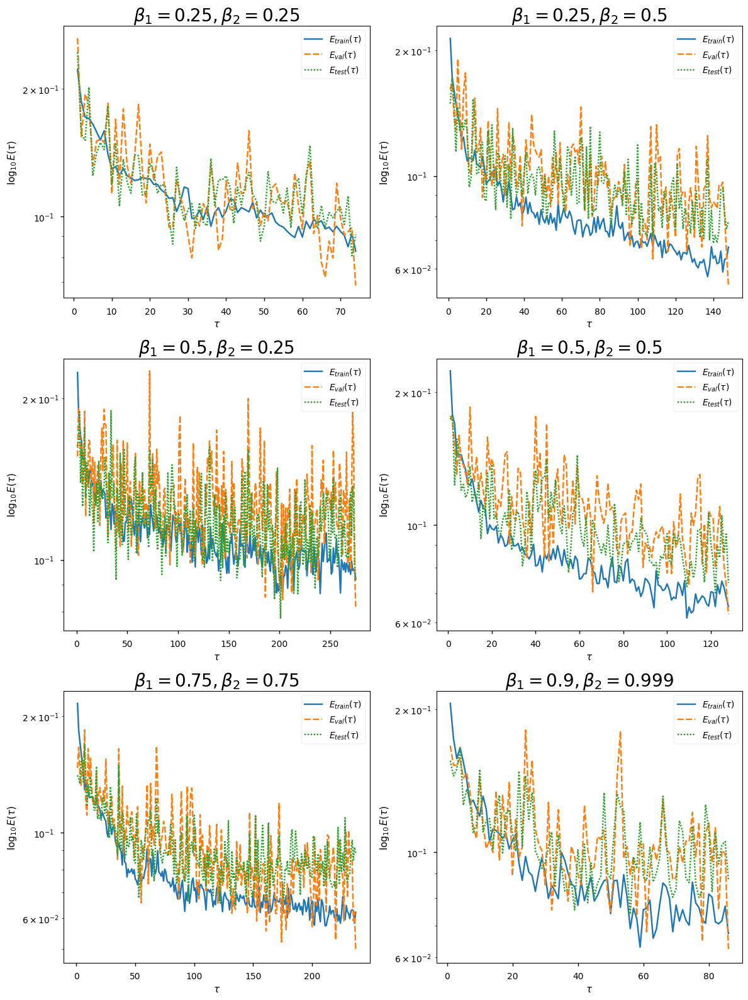

In [115]:
plt.figure(figsize=(12, 16))
for i, (beta1, beta2, result) in enumerate(result_list_adam):
    ax = plt.subplot(3, 2, i + 1)
    ax.set_title(f"$\\beta_1 = {beta1}, \\beta_2 = {beta2}$", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$\log_{10}E(\tau)$")

plt.tight_layout()
plt.show()

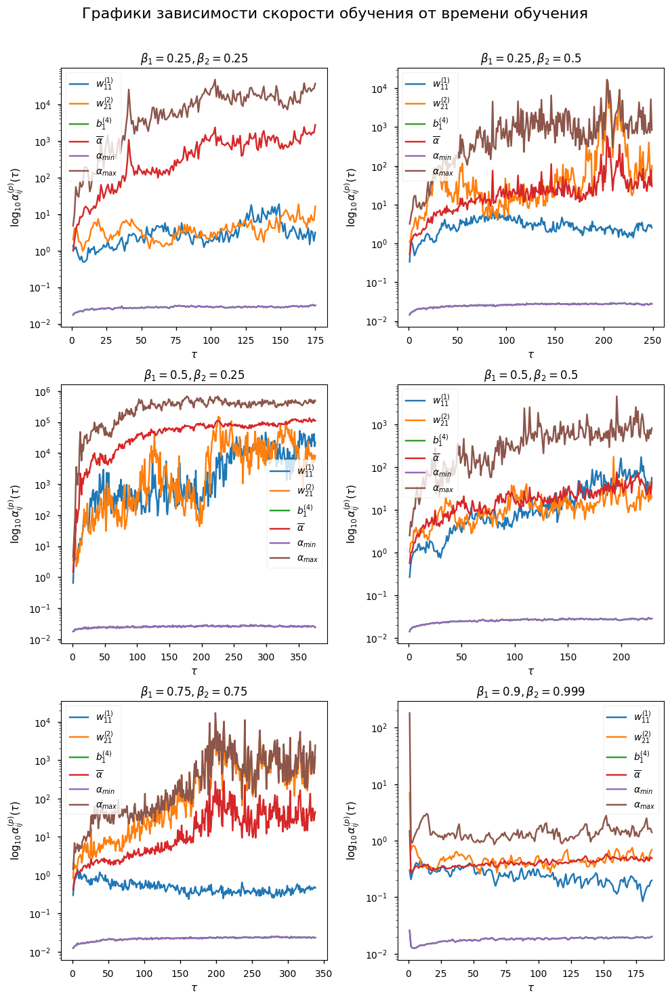

In [114]:
p = [0, 2, 7]
ij = [(0, 0), (1, 0), 0]

plt.figure(figsize=(10, 15))
for i, (beta1, beta2, optimizer) in enumerate(optimizer_history_list_adam):
    axis = plt.subplot(3, 2, i + 1)
    ax, alpha_history_adam = paint_alpha_history(optimizer, p, ij, ax=axis)
    ax.set_title(f"$\\beta_1 = {beta1}, \\beta_2 = {beta2}$")
plt.suptitle(
    "Графики зависимости скорости обучения от времени обучения",
    fontsize=16,
)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

In [116]:
table_adam = pd.DataFrame(
    index=pd.Index(data=range(1, len(result_list_adam) + 1), name="№ п/п")
)

for i, (beta1, beta2, result) in enumerate(result_list_adam):
    table_adam.loc[i + 1, r"Метод"] = "Adam"
    table_adam.loc[i + 1, r"$\beta_1$"] = beta1
    table_adam.loc[i + 1, r"$\beta_2$"] = beta2
    table_adam.loc[i + 1, r"Число эпох обучения"] = result.index[-1]
    table_adam.loc[i + 1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
        result[r"$E_{train}(\tau)$"].iloc[-1], 3
    )
    table_adam.loc[i + 1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
        result[r"$E_{test}(\tau)$"].iloc[-1], 3
    )
Markdown(table_adam.to_markdown())

|   № п/п | Метод   |   $\beta_1$ |   $\beta_2$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|------------:|------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | Adam    |        0.25 |       0.25  |                    74 |                                            0.083 |                                           0.091 |
|       2 | Adam    |        0.25 |       0.5   |                   148 |                                            0.068 |                                           0.078 |
|       3 | Adam    |        0.5  |       0.25  |                   275 |                                            0.092 |                                           0.091 |
|       4 | Adam    |        0.5  |       0.5   |                   128 |                                            0.065 |                                           0.074 |
|       5 | Adam    |        0.75 |       0.75  |                   237 |                                            0.062 |                                           0.089 |
|       6 | Adam    |        0.9  |       0.999 |                    86 |                                            0.067 |                                           0.087 |

## 4.8. Исследование метода RProp<a id="48"></a>

In [117]:
class RPropWithHistory(OptimWithAlphaHistory):
    def __init__(self, *args, **kwargs):
        super().__init__(optim_class=optim.Rprop, *args, **kwargs)

    def compute_alpha(self, param):
        return self.optimizer.state[param]["step_size"]

In [118]:
result_list_rprop = []
model.load_state_dict(init_parameters)
optimizer_rprop = RPropWithHistory(
    batches_per_epoch=len(train_loader),
    params=model.parameters(),
)
result = model.fit(
    train_loader,
    test_loader,
    val_loader,
    criterion,
    optimizer_rprop,
    10000,
    100,
)
result_list_rprop.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 3656


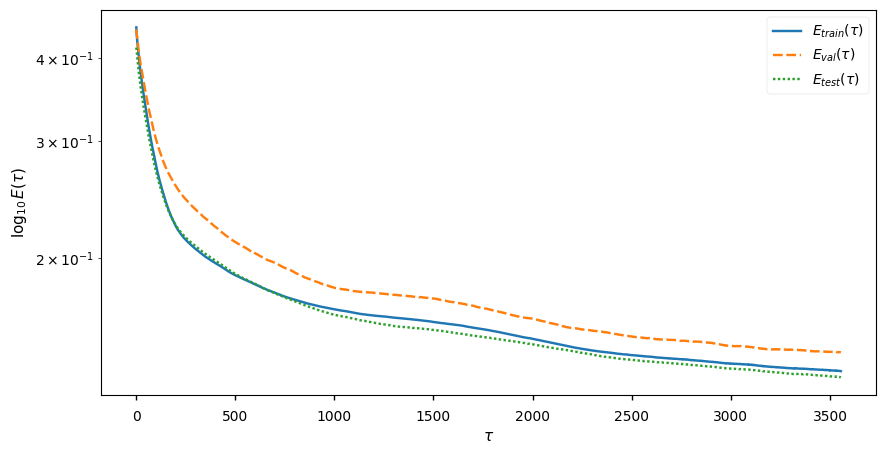

In [120]:
plt.figure(figsize=(10, 5))
sns.lineplot(result_list_rprop[0])
plt.yscale("log")
plt.ylabel(r"$\log_{10}E(\tau)$")
plt.show()

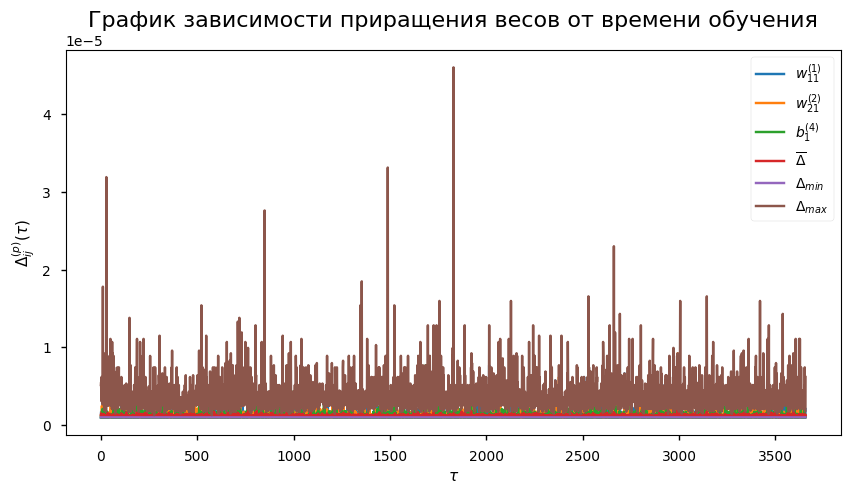

In [119]:
p = [0, 2, 7]
ij = [(0, 0), (1, 0), 0]
ax, deltras_history_rprop = paint_alpha_history(
    optimizer_rprop,
    p,
    ij,
    figsize=(10, 5),
)
ax.set_title("График зависимости приращения весов от времени обучения", fontsize=16)
ax.set_yscale("linear")
ax.set_ylabel(r"$\Delta_{ij}^{(p)}(\tau)$")
labels = ax.get_legend()
labels.get_texts()[3].set_text(r"$\overline{\Delta}$")
labels.get_texts()[4].set_text(r"$\Delta_{min}$")
labels.get_texts()[5].set_text(r"$\Delta_{max}$")
plt.show()

In [121]:
table_rprop = pd.DataFrame(
    index=pd.Index(data=range(1, len(result_list_rprop) + 1), name="№ п/п")
)
table_rprop.loc[1, r"Метод"] = "RProp"
table_rprop.loc[1, r"Число эпох обучения"] = result_list_rprop[0].index[-1]
table_rprop.loc[1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
    result_list_rprop[0][r"$E_{train}(\tau)$"].iloc[-1], 3
)
table_rprop.loc[1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
    result_list_rprop[0][r"$E_{test}(\tau)$"].iloc[-1], 3
)
Markdown(table_rprop.to_markdown())

|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | RProp   |                  3555 |                                            0.135 |                                           0.132 |

## 4.9. Исследование методов Левенберга-Маркардта и BFGS<a id="49"></a>

[Ссылка](https://github.com/xausssr/LewenbergMarkvardt-PyTorch) на репозиторий, откуда взят метод LM

In [122]:
model.load_state_dict(init_parameters)

test_history_lm = []


def callback():
    """Пример пользовательской метрики"""
    test_history_lm.append(model._evaluate(test_loader, criterion))


train_history_lm, val_history_lm, *_ = train_distributed_levenberg(
    model,
    train_loader,
    criterion,
    val_loader=val_loader,
    max_epochs=100,
    min_error=0.02,
    device="cpu",
    metric_callbacks=[callback],
    verbose=True,
)

result = pd.DataFrame()
result[r"$E_{train}(\tau)$"] = train_history_lm
result[r"$E_{val}(\tau)$"] = val_history_lm
result[r"$E_{test}(\tau)$"] = test_history_lm
result_list_lm = [result]

  0%|          | 0/100 [00:00<?, ?it/s]

MSE: 0.003 val: 0.025: 100%|██████████| 100/100 [07:02<00:00,  4.22s/it]


BFGS так же плохо работает не только в `Stochastic` режиме, но и в `Mini-Batch (bs = 64)` тоже плохо сходится.

In [123]:
try:
    model.load_state_dict(init_parameters)
    optimizer_bfgs = optim.LBFGS(model.parameters(), line_search_fn=None)
    result = model.fit(
        torch.utils.data.DataLoader(
            train_dataset,
            batch_size=1,
            shuffle=True,
            worker_init_fn=seed_worker,
            generator=g,
        ),
        test_loader,
        val_loader,
        criterion,
        optimizer_bfgs,
        100,
        100,
    )
except Exception as e:
    print(f"Training failed: {e}")

Обучение:   0%|          | 0/100 [00:00<?, ?эпоха/s]

Training failed: Loss is not finite


In [124]:
# 100 эпох на одном месте
try:
    model.load_state_dict(init_parameters)
    optimizer_bfgs = optim.LBFGS(model.parameters(), line_search_fn=None)
    result = model.fit(
        torch.utils.data.DataLoader(
            train_dataset,
            batch_size=64,
            shuffle=True,
            worker_init_fn=seed_worker,
            generator=g,
        ),
        test_loader,
        val_loader,
        criterion,
        optimizer_bfgs,
        100,
        100,
    )
except Exception as e:
    print(f"Training failed: {e}")

Обучение:   0%|          | 0/100 [00:00<?, ?эпоха/s]

Поэтому здесь в batch режиме работаю

In [125]:
result_list_bfgs = []
model.load_state_dict(init_parameters)
optimizer_bfgs = optim.LBFGS(model.parameters(), line_search_fn=None)
result = model.fit(
    torch.utils.data.DataLoader(
        train_dataset,
        batch_size=len(train_dataset),
        shuffle=True,
        worker_init_fn=seed_worker,
        generator=g,
    ),
    test_loader,
    val_loader,
    criterion,
    optimizer_bfgs,
    10000,
    1000,
)
result_list_bfgs.append(result)

Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 1032


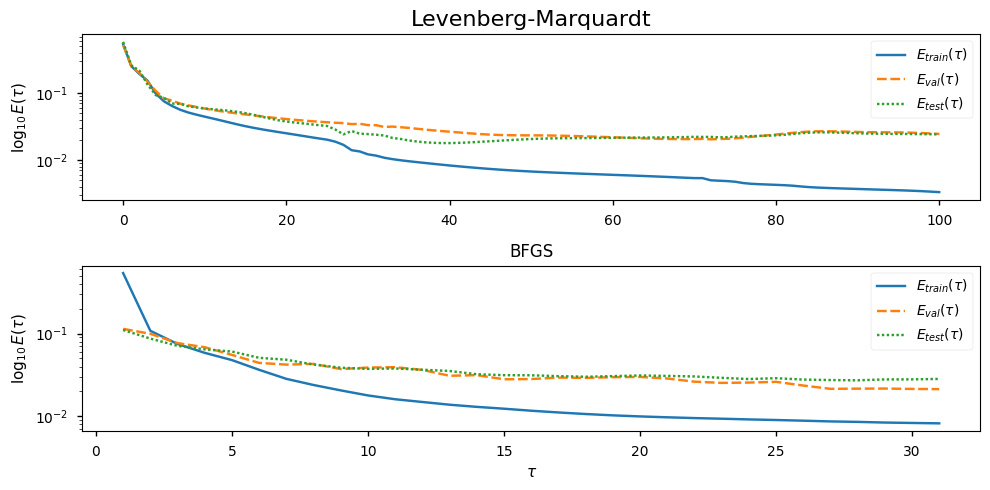

In [126]:
plt.figure(figsize=(10, 5))

plt.subplot(211)
sns.lineplot(result_list_lm[0])
plt.title("Levenberg-Marquardt", fontsize=16)
plt.yscale("log")
plt.ylabel(r"$\log_{10}E(\tau)$")

plt.subplot(212)
sns.lineplot(result_list_bfgs[0])
plt.title("BFGS")
plt.yscale("log")
plt.ylabel(r"$\log_{10}E(\tau)$")

plt.tight_layout()
plt.show()

In [127]:
table_lm_bfgs = pd.DataFrame(
    index=pd.Index(
        data=range(1, len(result_list_lm) + len(result_list_bfgs) + 1), name="№ п/п"
    )
)
table_lm_bfgs.loc[1, r"Метод"] = "LM"
table_lm_bfgs.loc[1, r"Число эпох обучения"] = result_list_lm[0].index[-1]
table_lm_bfgs.loc[1, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
    result_list_lm[0][r"$E_{train}(\tau)$"].iloc[-1], 3
)
table_lm_bfgs.loc[1, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
    result_list_lm[0][r"$E_{test}(\tau)$"].iloc[-1], 3
)
table_lm_bfgs.loc[2, r"Метод"] = "BFGS"
table_lm_bfgs.loc[2, r"Число эпох обучения"] = result_list_bfgs[0].index[-1]
table_lm_bfgs.loc[2, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = round(
    result_list_bfgs[0][r"$E_{train}(\tau)$"].iloc[-1], 3
)
table_lm_bfgs.loc[2, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
    result_list_bfgs[0][r"$E_{test}(\tau)$"].iloc[-1], 3
)
Markdown(table_lm_bfgs.to_markdown())

|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | LM      |                   100 |                                            0.003 |                                           0.024 |
|       2 | BFGS    |                    31 |                                            0.008 |                                           0.028 |

## 4.10. Исследование метода стохастического градиента<a id="410"></a>

In [128]:
result_list_stochasticgd = []
print(f"Best lr = {lr}")
batch_sizes = [1, 20, 100, len(train_dataset)]
for batch_size in batch_sizes:
    model.load_state_dict(init_parameters)
    optimizer_stochasticgd = optim.SGD(model.parameters(), lr=lr)
    result = model.fit(
        torch.utils.data.DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            worker_init_fn=seed_worker,
            generator=g,
        ),
        test_loader,
        val_loader,
        criterion,
        optimizer_stochasticgd,
        10000,
        100,
    )
    result_list_stochasticgd.append((batch_size, result))

Best lr = 0.01


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 1012


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 902


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

Early stopping at epoch 1415


Обучение:   0%|          | 0/10000 [00:00<?, ?эпоха/s]

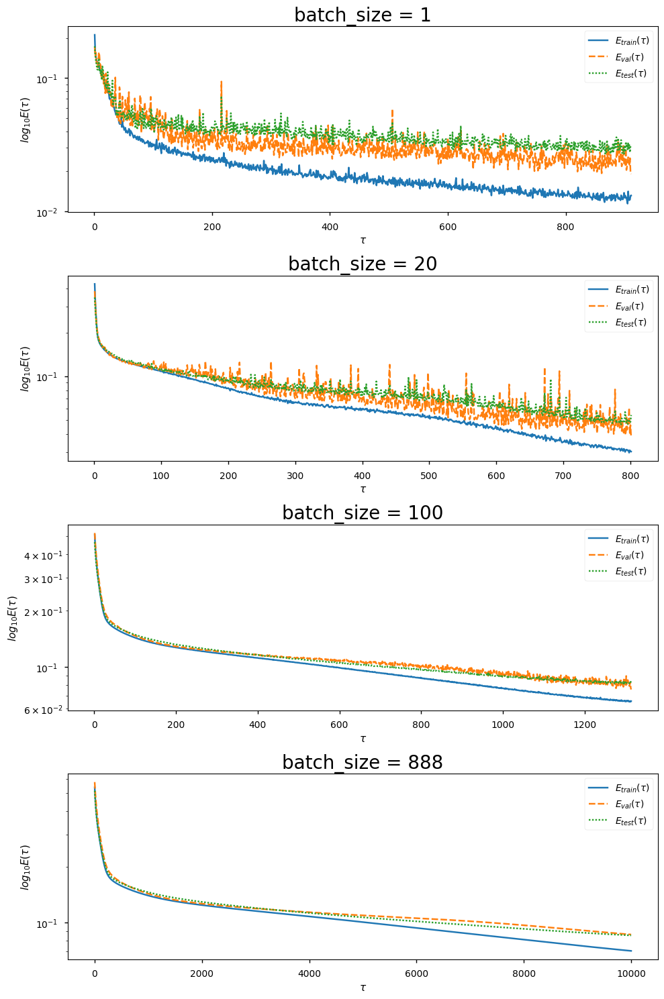

In [129]:
plt.figure(figsize=(10, 15))
for i, (batch_size, result) in enumerate(result_list_stochasticgd, start=1):
    ax = plt.subplot(4, 1, i)
    ax.set_title(f"batch_size = {batch_size}", fontsize=20)
    sns.lineplot(result)
    plt.yscale("log")
    plt.ylabel(r"$log_{10} E(\tau)$")
plt.tight_layout()
plt.show()

In [130]:
table_stochasticgd = pd.DataFrame(
    index=pd.Index(data=range(1, len(result_list_stochasticgd) + 1), name="№ п/п")
)
for i, (batch_size, result) in enumerate(result_list_stochasticgd, start=1):
    table_stochasticgd.loc[i, r"Метод"] = "StochasticGD"
    table_stochasticgd.loc[i, r"Размер mini-batch`а"] = batch_size
    table_stochasticgd.loc[i, r"Число эпох обучения"] = result.index[-1]
    table_stochasticgd.loc[i, r"Ошибка на обучающей выборке, $E_{\text{обуч}}$"] = (
        round(result[r"$E_{train}(\tau)$"].iloc[-1], 3)
    )
    table_stochasticgd.loc[i, r"Ошибка на тестовой выборке, $E_{\text{тест}}$"] = round(
        result[r"$E_{test}(\tau)$"].iloc[-1], 3
    )
Markdown(table_stochasticgd.to_markdown())

|   № п/п | Метод        |   Размер mini-batch`а |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:-------------|----------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | StochasticGD |                     1 |                   911 |                                            0.013 |                                           0.032 |
|       2 | StochasticGD |                    20 |                   801 |                                            0.03  |                                           0.054 |
|       3 | StochasticGD |                   100 |                  1314 |                                            0.066 |                                           0.085 |
|       4 | StochasticGD |                   888 |                 10000 |                                            0.07  |                                           0.085 |

## 4.11. Сравнение методов обучения<a id="411"></a>

In [131]:
tables = [
    table_gd,
    table_gdm_nag,
    table_steepest_gd_fr_pr,
    table_adagrad,
    table_rmsprop_adadelta,
    table_adam,
    table_rprop,
    table_lm_bfgs,
    table_stochasticgd,
]

# разделяем результаты на отдельные методы
finish_tables = []
for table in tables:
    for method in table[table.columns[0]].unique():
        finish_tables.append(
            table[table[table_gdm_nag.columns[0]] == method].sort_values(
                by=table.columns[-1]
            )
        )

for table in finish_tables:
    display(Markdown(table.to_markdown()))
    print("-" * 50)

|   № п/п | Метод   |   Скорость обучения $\alpha$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|-----------------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       3 | GD      |                        0.01  |                   372 |                                            0.016 |                                           0.028 |
|       5 | GD      |                        0.001 |                   771 |                                            0.021 |                                           0.031 |
|       4 | GD      |                        0.005 |                   218 |                                            0.024 |                                           0.032 |
|       2 | GD      |                        0.05  |                   256 |                                            0.024 |                                           0.034 |
|       1 | GD      |                        0.1   |                   257 |                                            0.054 |                                           0.043 |

--------------------------------------------------


|   № п/п | Метод   |   Момент, $\mu$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       3 | GDM     |             0.4 |                   465 |                                            0.013 |                                           0.031 |
|       5 | GDM     |             0.6 |                   360 |                                            0.016 |                                           0.032 |
|       1 | GDM     |             0.2 |                   156 |                                            0.024 |                                           0.041 |
|       7 | GDM     |             0.8 |                   174 |                                            0.033 |                                           0.042 |

--------------------------------------------------


|   № п/п | Метод   |   Момент, $\mu$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       4 | NAG     |             0.4 |                   599 |                                            0.013 |                                           0.027 |
|       2 | NAG     |             0.2 |                   392 |                                            0.017 |                                           0.036 |
|       6 | NAG     |             0.6 |                   191 |                                            0.022 |                                           0.036 |
|       8 | NAG     |             0.8 |                   333 |                                            0.02  |                                           0.042 |

--------------------------------------------------


|   № п/п | Метод            |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:-----------------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | SGD (Stochastic) |                    49 |                                            0.967 |                                           0.481 |

--------------------------------------------------


|   № п/п | Метод         |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       2 | SGD (bs = 64) |                   299 |                                            0.025 |                                           0.039 |

--------------------------------------------------


|   № п/п | Метод                     |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------------------------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       3 | Fletcher-Reeves (bs = 64) |                   128 |                                            0.025 |                                           0.048 |

--------------------------------------------------


|   № п/п | Метод                   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:------------------------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       4 | Polak-Ribiere (bs = 64) |                   216 |                                            0.022 |                                           0.039 |

--------------------------------------------------


|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | AdaGrad |                  1207 |                                            0.057 |                                           0.084 |

--------------------------------------------------


|   № п/п | Метод   |   Параметр сглаживания, $\rho$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|-------------------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       5 | RMSProp |                           0.5  |                   113 |                                            0.071 |                                           0.076 |
|       7 | RMSProp |                           0.75 |                   150 |                                            0.059 |                                           0.076 |
|       3 | RMSProp |                           0.25 |                   239 |                                            0.077 |                                           0.078 |
|       1 | RMSProp |                           0    |                    35 |                                            0.171 |                                           0.176 |

--------------------------------------------------


|   № п/п | Метод    |   Параметр сглаживания, $\rho$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:---------|-------------------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       8 | AdaDelta |                           0.75 |                   335 |                                            0.033 |                                           0.053 |
|       6 | AdaDelta |                           0.5  |                   257 |                                            0.052 |                                           0.06  |
|       4 | AdaDelta |                           0.25 |                   246 |                                            0.073 |                                           0.099 |
|       2 | AdaDelta |                           0    |                   110 |                                            0.138 |                                           0.121 |

--------------------------------------------------


|   № п/п | Метод   |   $\beta_1$ |   $\beta_2$ |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|------------:|------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       4 | Adam    |        0.5  |       0.5   |                   128 |                                            0.065 |                                           0.074 |
|       2 | Adam    |        0.25 |       0.5   |                   148 |                                            0.068 |                                           0.078 |
|       6 | Adam    |        0.9  |       0.999 |                    86 |                                            0.067 |                                           0.087 |
|       5 | Adam    |        0.75 |       0.75  |                   237 |                                            0.062 |                                           0.089 |
|       1 | Adam    |        0.25 |       0.25  |                    74 |                                            0.083 |                                           0.091 |
|       3 | Adam    |        0.5  |       0.25  |                   275 |                                            0.092 |                                           0.091 |

--------------------------------------------------


|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | RProp   |                  3555 |                                            0.135 |                                           0.132 |

--------------------------------------------------


|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | LM      |                   100 |                                            0.003 |                                           0.024 |

--------------------------------------------------


|   № п/п | Метод   |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:--------|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       2 | BFGS    |                    31 |                                            0.008 |                                           0.028 |

--------------------------------------------------


|   № п/п | Метод        |   Размер mini-batch`а |   Число эпох обучения |   Ошибка на обучающей выборке, $E_{\text{обуч}}$ |   Ошибка на тестовой выборке, $E_{\text{тест}}$ |
|--------:|:-------------|----------------------:|----------------------:|-------------------------------------------------:|------------------------------------------------:|
|       1 | StochasticGD |                     1 |                   911 |                                            0.013 |                                           0.032 |
|       2 | StochasticGD |                    20 |                   801 |                                            0.03  |                                           0.054 |
|       3 | StochasticGD |                   100 |                  1314 |                                            0.066 |                                           0.085 |
|       4 | StochasticGD |                   888 |                 10000 |                                            0.07  |                                           0.085 |

--------------------------------------------------


In [133]:
param_latex_map = {
    "Скорость обучения $\\alpha$": "$\\alpha$",
    "Параметр сглаживания, $\\rho$": "$\\rho$",
    "$\\beta_1$": "$\\beta_1$",
    "$\\beta_2$": "$\\beta_2$",
    "Момент, $\\mu$": "$\\mu$",
    "Размер mini-batch`а": "bs",
}

table_result = pd.DataFrame()
for table in finish_tables:
    method_name = table.iloc[0, 0]
    # Проверяем наличие параметров в столбцах 1 и 2
    if table.shape[1] > 2 and table.columns[1] != "Число эпох обучения":
        param1_name = param_latex_map.get(table.columns[1])
        param1 = table.iloc[0, 1]
        # Если есть второй параметр (например, для Adam)
        if table.shape[1] > 3 and table.columns[2] != "Число эпох обучения":
            param2_name = table.columns[2]
            param2 = table.iloc[0, 2]
            method_name = (
                f"{method_name} ({param1_name}={param1}, {param2_name}={param2})"
            )
        else:
            method_name = f"{method_name} ({param1_name}={param1})"
    finish_tables_cols = table.iloc[0, -3:]
    table_result = pd.concat(
        [table_result, pd.DataFrame([finish_tables_cols], index=[method_name])]
    )
table_result

,Число эпох обучения,"Ошибка на обучающей выборке, $E_{\text{обуч}}$","Ошибка на тестовой выборке, $E_{\text{тест}}$"
GD ($\alpha$=0.01),372.0,0.016,0.028
GDM ($\mu$=0.4),465.0,0.013,0.031
NAG ($\mu$=0.4),599.0,0.013,0.027
SGD (Stochastic),49.0,0.967,0.481
SGD (bs = 64),299.0,0.025,0.039
Fletcher-Reeves (bs = 64),128.0,0.025,0.048
Polak-Ribiere (bs = 64),216.0,0.022,0.039
AdaGrad,1207.0,0.057,0.084
RMSProp ($\rho$=0.5),113.0,0.071,0.076
AdaDelta ($\rho$=0.75),335.0,0.033,0.053


In [134]:
table_result.index.name = "Метод"
table_result.columns = [r"$\tau$", r"$E_{\text{обуч}}$", r"$E_{\text{тест}}$"]
table_result

,$\tau$,$E_{\text{обуч}}$,$E_{\text{тест}}$
Метод,,,
GD ($\alpha$=0.01),372.0,0.016,0.028
GDM ($\mu$=0.4),465.0,0.013,0.031
NAG ($\mu$=0.4),599.0,0.013,0.027
SGD (Stochastic),49.0,0.967,0.481
SGD (bs = 64),299.0,0.025,0.039
Fletcher-Reeves (bs = 64),128.0,0.025,0.048
Polak-Ribiere (bs = 64),216.0,0.022,0.039
AdaGrad,1207.0,0.057,0.084
RMSProp ($\rho$=0.5),113.0,0.071,0.076


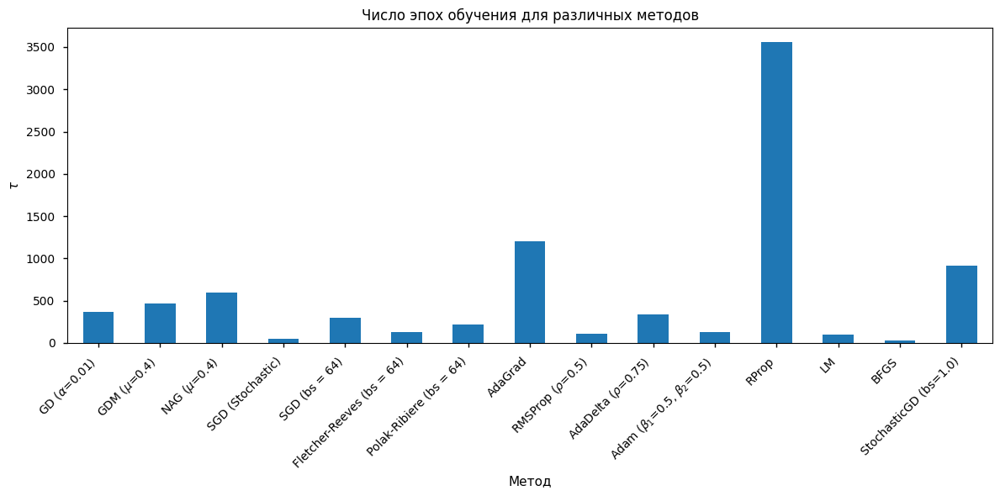

In [135]:
plt.figure(figsize=(12, 6))
ax = table_result[r"$\tau$"].plot(kind="bar", ylabel=r"$\tau$")
ax.set_xticklabels(table_result.index, rotation=45, ha="right")
plt.title("Число эпох обучения для различных методов")
plt.tight_layout()
plt.show()

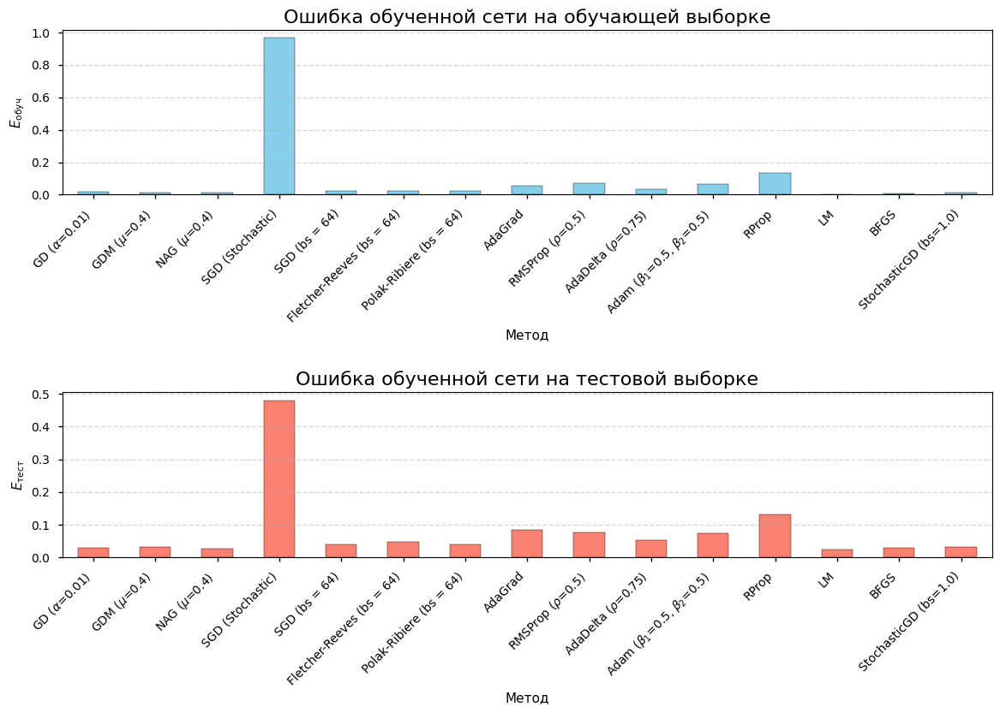

In [136]:
plt.figure(figsize=(14, 8))

# Первая диаграмма: ошибка на обучающей выборке
ax1 = plt.subplot(2, 1, 1)
table_result[r"$E_{\text{обуч}}$"].plot(
    kind="bar", ax=ax1, color="skyblue", edgecolor="black"
)
ax1.set_ylabel(r"$E_{\text{обуч}}$")
ax1.set_title("Ошибка обученной сети на обучающей выборке", fontsize=16)
ax1.set_xticklabels(table_result.index, rotation=45, ha="right")
ax1.grid(axis="y", linestyle="--", alpha=0.5)

# Вторая диаграмма: ошибка на тестовой выборке
ax2 = plt.subplot(2, 1, 2)
table_result[r"$E_{\text{тест}}$"].plot(
    kind="bar", ax=ax2, color="salmon", edgecolor="black"
)
ax2.set_ylabel(r"$E_{\text{тест}}$")
ax2.set_title("Ошибка обученной сети на тестовой выборке", fontsize=16)
ax2.set_xticklabels(table_result.index, rotation=45, ha="right")
ax2.grid(axis="y", linestyle="--", alpha=0.5)


plt.subplots_adjust(hspace=1.2)
plt.show()